In [1]:
import warnings
warnings.filterwarnings('ignore')


In [3]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_seq_items', None) 
pd.set_option('display.max_colwidth', None) 

In [5]:
def color_style(value):
    
    if value>0:
        color= 'red'
    elif value==0:
        color='blue'
    else:
        color='green'
    return 'color: %s' % color

In [6]:
def null_prcnt_df(data):
    df= data.copy()
    missing = pd.DataFrame(100*df.isnull().sum()/len(df.index))
    missing.rename(columns={0:'Null_Percentage'}, inplace=True)
    missing = pd.DataFrame(missing.Null_Percentage).sort_values(by='Null_Percentage',ascending=False).style.applymap(color_style)
    return missing

In [8]:
from IPython.display import Markdown, display
def printbold(string):
    return display(Markdown(string))

In [9]:
def other_metrics_logistic_model(confusion):

     TP = confusion[1,1] # true positive 
     TN = confusion[0,0] # true negatives
     FP = confusion[0,1] # false positives
     FN = confusion[1,0] # false negatives

     sensitivity= round((TP) / (TP+FN),4) #sensitivity of our logistic regression model
     specificity= round((TN) / (TN+FP),4) #specificity  of our logistic regression model   
     FPR= round((FP) / (TN+FP),4)        #False Positive Rate - predicting churn when customer does not have churned
     positive_pred_val= round((TP) / (TP+FP),4)  #Positive predictive value
     negative_pred_val= round((TN) / (TN+ FN),4) #Negative predictive value
     misclass_rate = round((FN+FP)/(TP+TN+FP+FN),4)  #Misclassification rate 
    
     metric_list= ['Sensitivity', 'Specificity', 'False Positive Rate','Positive Predictive Value','Negative Predictive Value', 'Misclassification Rate']
     metric_val = [sensitivity, specificity, FPR, positive_pred_val, negative_pred_val, misclass_rate]
     evaluation_metrics_df=pd.DataFrame({'Evaluation Metrics':metric_list, 'Value': metric_val})
     evaluation_metrics_df.set_index('Evaluation Metrics', inplace= True)
     return evaluation_metrics_df
    

In [10]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix

def plot_confusion_matrix(cm):

    classes=['Not Churned','Churned']
    cmap=plt.cm.Reds
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title('Confusion Matrix', fontsize=14)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes, rotation=90)
    thresh = cm.max() / 2.
    for i in range (cm.shape[0]):
        for j in range (cm.shape[1]):
            plt.text(j, i, cm[i, j],horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label', fontsize= 10)
    plt.xlabel('Predicted label', fontsize=10)


def print_model_metrics(y_test,y_pred,model_name):
    print(model_name+" Model Stats Scores Summary : ")
    cp = confusion_matrix(y_test,y_pred)
    plt.figure()
    plot_confusion_matrix(cp)
    plt.show()

In [2]:
import chardet
import os
file_path = os.path.join('telecom_churn_data.csv')
raw_data = open(file_path, 'rb').readline()

encoding = chardet.detect(raw_data)
print("File encoding details:\n", encoding)  

File encoding details:
 {'encoding': 'ascii', 'confidence': 1.0, 'language': ''}


In [4]:
import pandas as pd

telecom_df = pd.read_csv('telecom_churn_data.csv')
telecom_df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,...,0,1.0,1.0,1.0,NaN,968,30.4,0.0,101.20,3.58
1,7001865778,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,34.047,...,0,NaN,1.0,1.0,NaN,1006,0.0,0.0,0.00,0.00
2,7001625959,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,167.690,...,0,NaN,NaN,NaN,1.0,1103,0.0,0.0,4.17,0.00
3,7001204172,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,221.338,...,0,NaN,NaN,NaN,NaN,2491,0.0,0.0,0.00,0.00
4,7000142493,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,261.636,...,0,0.0,NaN,NaN,NaN,1526,0.0,0.0,0.00,0.00


In [5]:
telecom_df_orig = telecom_df.copy()

In [6]:
telecom_df.shape

(99999, 226)

In [7]:
telecom_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 226 entries, mobile_number to sep_vbc_3g
dtypes: float64(179), int64(35), object(12)
memory usage: 172.4+ MB


In [8]:
telecom_df.columns

Index(['mobile_number', 'circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou',
       'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7',
       'last_date_of_month_8', 'last_date_of_month_9', 'arpu_6',
       ...
       'sachet_3g_9', 'fb_user_6', 'fb_user_7', 'fb_user_8', 'fb_user_9',
       'aon', 'aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g', 'sep_vbc_3g'],
      dtype='object', length=226)

In [9]:
telecom_df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,...,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
count,9.999900e+04,99999.0,98981.0,98981.0,98981.0,99999.000000,99999.000000,99999.000000,99999.000000,96062.000000,...,99999.000000,25153.000000,25571.000000,26339.000000,25922.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000
mean,7.001207e+09,109.0,0.0,0.0,0.0,282.987358,278.536648,279.154731,261.645069,132.395875,...,0.084581,0.914404,0.908764,0.890808,0.860968,1219.854749,68.170248,66.839062,60.021204,3.299373
std,6.956694e+05,0.0,0.0,0.0,0.0,328.439770,338.156291,344.474791,341.998630,297.207406,...,0.650457,0.279772,0.287950,0.311885,0.345987,954.733842,267.580450,271.201856,253.938223,32.408353
min,7.000000e+09,109.0,0.0,0.0,0.0,-2258.709000,-2014.045000,-945.808000,-1899.505000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000606e+09,109.0,0.0,0.0,0.0,93.411500,86.980500,84.126000,62.685000,7.380000,...,0.000000,1.000000,1.000000,1.000000,1.000000,467.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001205e+09,109.0,0.0,0.0,0.0,197.704000,191.640000,192.080000,176.849000,34.310000,...,0.000000,1.000000,1.000000,1.000000,1.000000,863.000000,0.000000,0.000000,0.000000,0.000000
75%,7.001812e+09,109.0,0.0,0.0,0.0,371.060000,365.344500,369.370500,353.466500,118.740000,...,0.000000,1.000000,1.000000,1.000000,1.000000,1807.500000,0.000000,0.000000,0.000000,0.000000
max,7.002411e+09,109.0,0.0,0.0,0.0,27731.088000,35145.834000,33543.624000,38805.617000,7376.710000,...,49.000000,1.000000,1.000000,1.000000,1.000000,4337.000000,12916.220000,9165.600000,11166.210000,2618.570000


In [11]:

def null_prcnt_df(df):
    
    null_percent = df.isnull().sum() * 100 / len(df)
    
    result = pd.DataFrame({
        'Column': df.columns,
        'Null Percentage': null_percent
    })
    
    return result
    
null_prcnt_df(telecom_df)

,Column,Null Percentage
mobile_number,mobile_number,0.00000
circle_id,circle_id,0.00000
loc_og_t2o_mou,loc_og_t2o_mou,1.01801
std_og_t2o_mou,std_og_t2o_mou,1.01801
loc_ic_t2o_mou,loc_ic_t2o_mou,1.01801
...,...,...
aon,aon,0.00000
aug_vbc_3g,aug_vbc_3g,0.00000
jul_vbc_3g,jul_vbc_3g,0.00000
jun_vbc_3g,jun_vbc_3g,0.00000


In [12]:
telecom_df = telecom_df.rename(columns= lambda x: x.strip(), inplace=False)

In [13]:
telecom_df = telecom_df.drop_duplicates()

In [14]:
last_day_rech_cols = list(telecom_df.columns[telecom_df.columns.str.contains('last_day_rch_amt')])
last_day_rech_cols

['last_day_rch_amt_6',
 'last_day_rch_amt_7',
 'last_day_rch_amt_8',
 'last_day_rch_amt_9']

In [15]:
telecom_df = telecom_df.rename(columns= {'last_day_rch_amt_6':'last_day_rech_amt_6', 'last_day_rch_amt_7':'last_day_rech_amt_7',\
                                     'last_day_rch_amt_8':'last_day_rech_amt_8', 'last_day_rch_amt_9':'last_day_rech_amt_9'})
correct_last_day_rech_amt_cols = list(telecom_df.columns[telecom_df.columns.str.contains('last_day')])
correct_last_day_rech_amt_cols

['last_day_rech_amt_6',
 'last_day_rech_amt_7',
 'last_day_rech_amt_8',
 'last_day_rech_amt_9']

In [16]:
rech_amt_data_cols = telecom_df.columns[telecom_df.columns.str.contains('rech_amt|rech_data', regex=True)]
rech_amt_data_cols

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'total_rech_amt_9', 'max_rech_amt_6', 'max_rech_amt_7',
       'max_rech_amt_8', 'max_rech_amt_9', 'last_day_rech_amt_6',
       'last_day_rech_amt_7', 'last_day_rech_amt_8', 'last_day_rech_amt_9',
       'date_of_last_rech_data_6', 'date_of_last_rech_data_7',
       'date_of_last_rech_data_8', 'date_of_last_rech_data_9',
       'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8',
       'total_rech_data_9', 'max_rech_data_6', 'max_rech_data_7',
       'max_rech_data_8', 'max_rech_data_9', 'av_rech_amt_data_6',
       'av_rech_amt_data_7', 'av_rech_amt_data_8', 'av_rech_amt_data_9'],
      dtype='object')

In [17]:
rech_amt_data_df = telecom_df[rech_amt_data_cols]
null_prcnt_df(rech_amt_data_df)

,Column,Null Percentage
total_rech_amt_6,total_rech_amt_6,0.000000
total_rech_amt_7,total_rech_amt_7,0.000000
total_rech_amt_8,total_rech_amt_8,0.000000
total_rech_amt_9,total_rech_amt_9,0.000000
max_rech_amt_6,max_rech_amt_6,0.000000
max_rech_amt_7,max_rech_amt_7,0.000000
max_rech_amt_8,max_rech_amt_8,0.000000
max_rech_amt_9,max_rech_amt_9,0.000000
last_day_rech_amt_6,last_day_rech_amt_6,0.000000
last_day_rech_amt_7,last_day_rech_amt_7,0.000000


In [18]:
rech_amt_data_df.describe()

,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,last_day_rech_amt_6,last_day_rech_amt_7,...,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9
count,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,...,26339.000000,25922.000000,25153.000000,25571.000000,26339.000000,25922.00000,25153.000000,25571.000000,26339.000000,25922.000000
mean,327.514615,322.962970,324.157122,303.345673,104.637486,104.752398,107.728207,101.943889,63.156252,59.385804,...,2.651999,2.441170,126.393392,126.729459,125.717301,124.94144,192.600982,200.981292,197.526489,192.734315
std,398.019701,408.114237,416.540455,404.588583,120.614894,124.523970,126.902505,125.375109,97.356649,95.915385,...,3.074987,2.516339,108.477235,109.765267,109.437851,111.36376,192.646318,196.791224,191.301305,188.400286
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,0.500000,0.500000,1.000000
25%,109.000000,100.000000,90.000000,52.000000,30.000000,30.000000,30.000000,28.000000,0.000000,0.000000,...,1.000000,1.000000,25.000000,25.000000,25.000000,25.00000,82.000000,92.000000,87.000000,69.000000
50%,230.000000,220.000000,225.000000,200.000000,110.000000,110.000000,98.000000,61.000000,30.000000,30.000000,...,1.000000,2.000000,145.000000,145.000000,145.000000,145.00000,154.000000,154.000000,154.000000,164.000000
75%,437.500000,428.000000,434.500000,415.000000,120.000000,128.000000,144.000000,144.000000,110.000000,110.000000,...,3.000000,3.000000,177.000000,177.000000,179.000000,179.00000,252.000000,252.000000,252.000000,252.000000
max,35190.000000,40335.000000,45320.000000,37235.000000,4010.000000,4010.000000,4449.000000,3399.000000,4010.000000,4010.000000,...,60.000000,84.000000,1555.000000,1555.000000,1555.000000,1555.00000,7546.000000,4365.000000,4076.000000,4061.000000


In [19]:
telecom_df['av_rech_amt_data_6']= telecom_df['av_rech_amt_data_6'].fillna(0)
telecom_df['av_rech_amt_data_7']= telecom_df['av_rech_amt_data_7'].fillna(0)
telecom_df['av_rech_amt_data_8']= telecom_df['av_rech_amt_data_8'].fillna(0)
telecom_df['av_rech_amt_data_9']= telecom_df['av_rech_amt_data_9'].fillna(0)

telecom_df['total_rech_data_6']= telecom_df['total_rech_data_6'].fillna(0)
telecom_df['total_rech_data_7']= telecom_df['total_rech_data_7'].fillna(0)
telecom_df['total_rech_data_8']= telecom_df['total_rech_data_8'].fillna(0)
telecom_df['total_rech_data_9']= telecom_df['total_rech_data_9'].fillna(0)


In [20]:
telecom_df['total_rech_data_amt_6'] = (telecom_df['av_rech_amt_data_6'] * telecom_df['total_rech_data_6']) 
telecom_df['total_rech_data_amt_7'] = (telecom_df['av_rech_amt_data_7'] * telecom_df['total_rech_data_7']) 
telecom_df['total_rech_data_amt_8'] = (telecom_df['av_rech_amt_data_8'] * telecom_df['total_rech_data_8']) 
telecom_df['total_rech_data_amt_9'] = (telecom_df['av_rech_amt_data_9'] * telecom_df['total_rech_data_9'])

In [21]:
telecom_df['avg_total_rech_plus_data_amt_6_7'] = (telecom_df['total_rech_data_amt_6'] + telecom_df['total_rech_amt_6']+
                                                  telecom_df['total_rech_data_amt_7'] + telecom_df['total_rech_amt_7'])/2

In [22]:
avg_total_rech_plus_data_amt_6_7_70per =  telecom_df['avg_total_rech_plus_data_amt_6_7'].quantile(0.7)
avg_total_rech_plus_data_amt_6_7_70per

np.float64(478.0)

In [23]:
telecom_hv = telecom_df.loc[(telecom_df.avg_total_rech_plus_data_amt_6_7 > avg_total_rech_plus_data_amt_6_7_70per)]
telecom_hv.shape

(29953, 231)

In [24]:
churn_phase_cols = ['total_og_mou_9','total_ic_mou_9', 'vol_2g_mb_9', 'vol_3g_mb_9']

churn_phase_cols_df = telecom_df[churn_phase_cols]
null_prcnt_df(churn_phase_cols_df)

,Column,Null Percentage
total_og_mou_9,total_og_mou_9,0.0
total_ic_mou_9,total_ic_mou_9,0.0
vol_2g_mb_9,vol_2g_mb_9,0.0
vol_3g_mb_9,vol_3g_mb_9,0.0


In [26]:
import numpy as np  # Add this import statement at the beginning

telecom_hv['total_usage_col_9'] = (telecom_hv['total_og_mou_9'] + telecom_hv['total_ic_mou_9'] + 
                                   telecom_hv['vol_2g_mb_9'] + telecom_hv['vol_3g_mb_9'])

##Tagging churners based on 'total_usage_col_9' 
telecom_hv['churn'] = np.where(telecom_hv['total_usage_col_9']== 0, 1, 0)  
#(A value in 'total_usage_col_9' column indicates presence of calling and/or internet in 9th month; if absent i.e. total=0 implies churn i.e. 1)

print("Tagging churners [No. of Records]\n(churn=1, else 0):")
telecom_hv['churn'].value_counts()

Tagging churners [No. of Records]
(churn=1, else 0):


C:\Users\USER\AppData\Local\Temp\ipykernel_9808\525914069.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  telecom_hv['total_usage_col_9'] = (telecom_hv['total_og_mou_9'] + telecom_hv['total_ic_mou_9'] +
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\525914069.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  telecom_hv['churn'] = np.where(telecom_hv['total_usage_col_9']== 0, 1, 0)


churn
0    27520
1     2433
Name: count, dtype: int64

In [27]:
print("\nTagging churners (% of total)\n(churn=1, else 0):")
round(100*telecom_hv['churn'].value_counts()/len(telecom_hv.index),3)


Tagging churners (% of total)
(churn=1, else 0):


churn
0    91.877
1     8.123
Name: count, dtype: float64

In [28]:
churn_rate = round(100*telecom_hv['churn'].sum()/len(telecom_hv.index),3)
print('Churn Rate(%):',churn_rate)
print("High-Valued Customers Dataset shape: ",telecom_hv.shape)

Churn Rate(%): 8.123
High-Valued Customers Dataset shape:  (29953, 233)


In [29]:
attributes_9 = list(telecom_hv.columns[telecom_hv.columns.str.contains('_9')])

##Also considering 'sep_vbc_3g' as this column also belongs to the churn phase (month 9: September)
attributes_9.append('sep_vbc_3g')

##Dropping churn phase (month 9) columns (except churn column)
telecom_hv.drop(attributes_9, axis=1, inplace=True)

telecom_hv.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\2669145688.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  telecom_hv.drop(attributes_9, axis=1, inplace=True)


,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,...,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_data_amt_6,total_rech_data_amt_7,total_rech_data_amt_8,avg_total_rech_plus_data_amt_6_7,churn
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,197.385,214.816,...,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,559.0,1
7,7000701601,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,1069.180,1349.850,...,NaN,802,57.74,19.38,18.74,0.0,0.0,0.0,1185.0,1
8,7001524846,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,378.721,492.223,...,1.0,315,21.03,910.65,122.16,0.0,354.0,207.0,696.0,0
21,7002124215,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,514.453,597.753,...,NaN,720,0.00,0.00,0.00,0.0,0.0,0.0,640.0,0
23,7000887461,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,74.350,193.897,...,1.0,604,40.45,51.86,0.00,0.0,712.0,540.0,583.0,0


In [30]:
def remove_single_val_uniq_col(df):
    df_newsingle = df.copy()
    
    uniq_svcol = df_newsingle.nunique() ==1
    list_uniq_svcol = list(uniq_svcol[uniq_svcol.values== True].index)
    df_newsingle.drop(list_uniq_svcol, axis=1, inplace=True)
    print('Columns that are dropped are:\n{0}'.format(list_uniq_svcol))
    print('\nNumber of columns dropped:\n{0}'.format(len(list_uniq_svcol)))
    return df_newsingle

telecom_hv= remove_single_val_uniq_col(telecom_hv)

Columns that are dropped are:
['circle_id', 'loc_og_t2o_mou', 'std_og_t2o_mou', 'loc_ic_t2o_mou', 'last_date_of_month_6', 'last_date_of_month_7', 'last_date_of_month_8', 'std_og_t2c_mou_6', 'std_og_t2c_mou_7', 'std_og_t2c_mou_8', 'std_ic_t2o_mou_6', 'std_ic_t2o_mou_7', 'std_ic_t2o_mou_8']

Number of columns dropped:
13


In [31]:
date_columns_list= list(telecom_hv.columns[telecom_hv.columns.str.contains('date')])
date_columns_list

['date_of_last_rech_6',
 'date_of_last_rech_7',
 'date_of_last_rech_8',
 'date_of_last_rech_data_6',
 'date_of_last_rech_data_7',
 'date_of_last_rech_data_8']

In [32]:
telecom_hv.drop(date_columns_list, axis=1, inplace=True)
telecom_hv.head()

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_data_amt_6,total_rech_data_amt_7,total_rech_data_amt_8,avg_total_rech_plus_data_amt_6_7,churn
0,7000842753,197.385,214.816,213.803,NaN,NaN,0.00,NaN,NaN,0.00,...,1.0,968,30.40,0.00,101.20,252.0,252.0,252.0,559.0,1
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,NaN,802,57.74,19.38,18.74,0.0,0.0,0.0,1185.0,1
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,1.0,315,21.03,910.65,122.16,0.0,354.0,207.0,696.0,0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,...,NaN,720,0.00,0.00,0.00,0.0,0.0,0.0,640.0,0
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,...,1.0,604,40.45,51.86,0.00,0.0,712.0,540.0,583.0,0


In [33]:
telecom_hv.shape

(29953, 157)

In [36]:
##Unique count dataframe
import pandas as pd
import numpy as np

def hv_categorical_cols_unique(data):
    df = data.copy()
    
    unique_count = []
    unique_val = []
    col_list = []
    data_type = []
    
    for col in df.columns:
        if len(df[col].unique()) < 20:  ##Set a threshold to check for the distinct values of potential categorical datatype columns
            col_list.append(col)
            data_type.append(df[col].dtype)
            unique_count.append(len(df[col].unique()))
            unique_val.append(list(df[col].unique()))  # Convert to list instead of numpy array
    
    # Create DataFrame without using numpy arrays
    unique_df = pd.DataFrame({
        'Features': col_list,
        'Data Type': data_type,
        'Unique Count': unique_count,
        'Unique Values': unique_val  # This will now be stored as Python objects, not numpy arrays
    })
    
    unique_df.set_index('Features', inplace=True)
    sorted_df = unique_df.sort_values(by='Unique Count', ascending=True)
    return sorted_df


print("**Checking for potential categorical datatype columns:**")  

hv_categorical_cols_unique(data=telecom_hv)

**Checking for potential categorical datatype columns:**


,Data Type,Unique Count,Unique Values
Features,,,
churn,int64,2,"[1, 0]"
night_pck_user_6,float64,3,"[0.0, nan, 1.0]"
night_pck_user_7,float64,3,"[0.0, nan, 1.0]"
night_pck_user_8,float64,3,"[0.0, nan, 1.0]"
fb_user_6,float64,3,"[1.0, nan, 0.0]"
fb_user_7,float64,3,"[1.0, nan, 0.0]"
fb_user_8,float64,3,"[1.0, nan, 0.0]"
monthly_2g_6,int64,5,"[0, 2, 1, 3, 4]"
monthly_2g_7,int64,6,"[0, 1, 2, 5, 4, 3]"


In [37]:
telecom_hv.describe(percentiles= [0,0.01,0.1,0.25,0.5,0.75,0.9,0.95,0.99,0.999])

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,total_rech_data_amt_6,total_rech_data_amt_7,total_rech_data_amt_8,avg_total_rech_plus_data_amt_6_7,churn
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29411.000000,29417.000000,28781.000000,29411.000000,29417.000000,28781.000000,...,15935.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000
mean,7.001206e+09,558.820058,561.160547,508.890301,265.708886,272.935850,243.888097,380.688975,385.124799,348.769656,...,0.897207,1209.280573,169.276670,179.057629,158.731865,456.387566,528.958341,463.640890,1153.701715,0.081227
std,6.908102e+05,460.868223,480.028497,502.136278,462.692744,483.282132,465.505577,484.441095,501.024091,486.836956,...,0.303697,957.449442,421.128001,443.756247,416.989501,1419.713940,1477.097887,1623.839242,1359.533621,0.273188
min,7.000000e+09,-2258.709000,-2014.045000,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,478.500000,0.000000
0%,7.000000e+09,-2258.709000,-2014.045000,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,180.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,478.500000,0.000000
1%,7.000026e+09,1.272400,0.726000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,188.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,483.000000,0.000000
10%,7.000251e+09,171.795000,177.973000,84.302800,1.650000,1.406000,0.650000,16.610000,15.578000,9.030000,...,0.000000,284.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,521.000000,0.000000
25%,7.000609e+09,310.142000,310.071000,231.615000,19.250000,18.180000,14.280000,78.550000,76.180000,58.760000,...,1.000000,460.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,604.000000,0.000000
50%,7.001203e+09,482.354000,481.496000,427.604000,88.140000,86.890000,72.990000,229.630000,227.130000,197.690000,...,1.000000,846.000000,0.000000,0.000000,0.000000,92.000000,100.000000,25.000000,800.500000,0.000000
75%,7.001804e+09,700.240000,698.829000,661.753000,297.490000,298.380000,255.310000,494.755000,500.480000,455.440000,...,1.000000,1756.000000,129.130000,137.860000,98.750000,400.000000,575.000000,308.000000,1209.000000,0.000000


In [38]:
def plot_boxplots_6_7_8(feature):  ##Note: Showfliers: False (Suppresses the effect of outliers on the graphs.)
    plt.figure(figsize=(24,10), dpi=250)
    sns.set_style("whitegrid")
    df = telecom_hv.copy()
    
    plt.subplot(1,3,1)
    ax_11= sns.boxplot(data=df, y=feature+"_6", x="churn", hue="churn", showfliers= False, palette=("Paired"))
    ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBoxplot: '{feature}_6'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_6", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=22, fontstyle='italic')
    plt.yticks(fontsize=16)
    
    #legend subplot_131
    T1= ax_11.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T1.get_texts()[0].set_text('Not Churned (Retention)')
    T1.get_texts()[1].set_text('Churned')
    
    plt.subplot(1,3,2)
    ax_22= sns.boxplot(data=df, y=feature+"_7",x="churn",hue="churn", showfliers= False, palette=("Paired"))
    ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBoxplot: '{feature}_7'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_7", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=20, fontstyle='italic')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    #legend subplot_132
    T2= ax_22.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T2.get_texts()[0].set_text('Not Churned (Retention)')
    T2.get_texts()[1].set_text('Churned')

    
    plt.subplot(1,3,3)
    ax_33= sns.boxplot(data=df, y=feature+"_8",x="churn",hue="churn", showfliers= False, palette=("Paired"))
    ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBoxplot: '{feature}_8'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_8", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=20, fontstyle='italic')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    #legend subplot_133
    T3= ax_33.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T3.get_texts()[0].set_text('Not Churned (Retention)')
    T3.get_texts()[1].set_text('Churned')
    
    plt.show()

In [39]:
rech_amt_cols = telecom_hv.columns[telecom_hv.columns.str.contains('rech_amt|rech_data_amt')]  ##For 6, 7 and 8 months
rech_amt_cols

Index(['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8',
       'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8',
       'last_day_rech_amt_6', 'last_day_rech_amt_7', 'last_day_rech_amt_8',
       'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8',
       'total_rech_data_amt_6', 'total_rech_data_amt_7',
       'total_rech_data_amt_8'],
      dtype='object')

In [40]:
rech_amt_df = telecom_hv[rech_amt_cols]
null_prcnt_df(rech_amt_df)

,Column,Null Percentage
total_rech_amt_6,total_rech_amt_6,0.0
total_rech_amt_7,total_rech_amt_7,0.0
total_rech_amt_8,total_rech_amt_8,0.0
max_rech_amt_6,max_rech_amt_6,0.0
max_rech_amt_7,max_rech_amt_7,0.0
max_rech_amt_8,max_rech_amt_8,0.0
last_day_rech_amt_6,last_day_rech_amt_6,0.0
last_day_rech_amt_7,last_day_rech_amt_7,0.0
last_day_rech_amt_8,last_day_rech_amt_8,0.0
av_rech_amt_data_6,av_rech_amt_data_6,0.0


C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


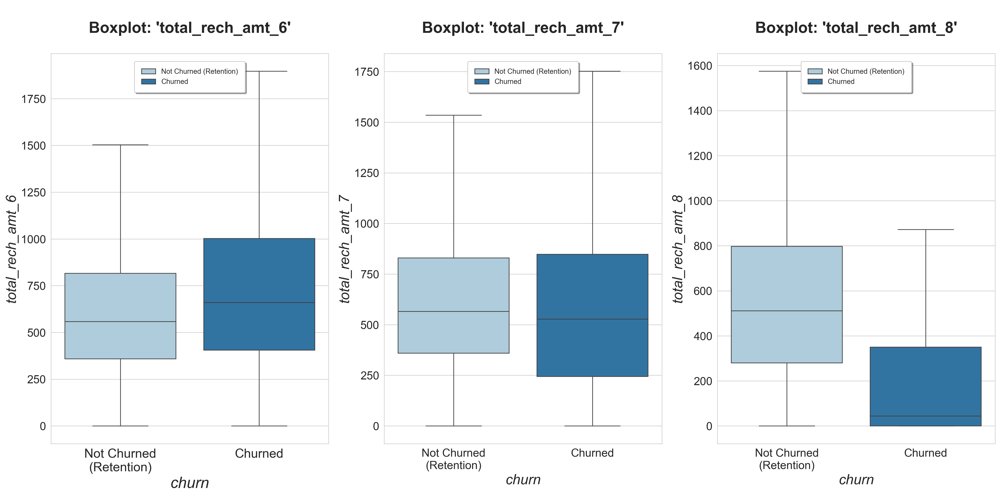

In [43]:
# Import matplotlib.pyplot as plt
import matplotlib.pyplot as plt
# Import seaborn as sns
import seaborn as sns

# Now you can use the function with plt and sns available
plot_boxplots_6_7_8('total_rech_amt')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


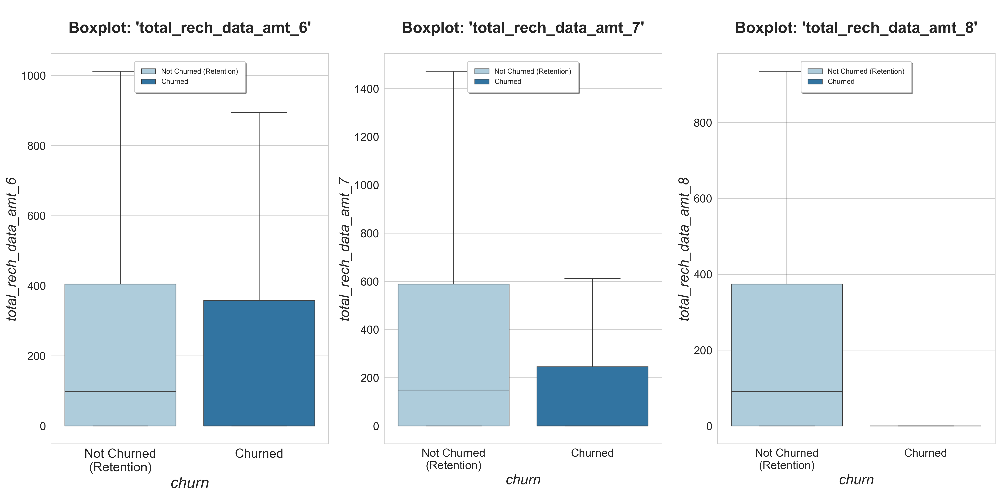

In [44]:
plot_boxplots_6_7_8('total_rech_data_amt')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


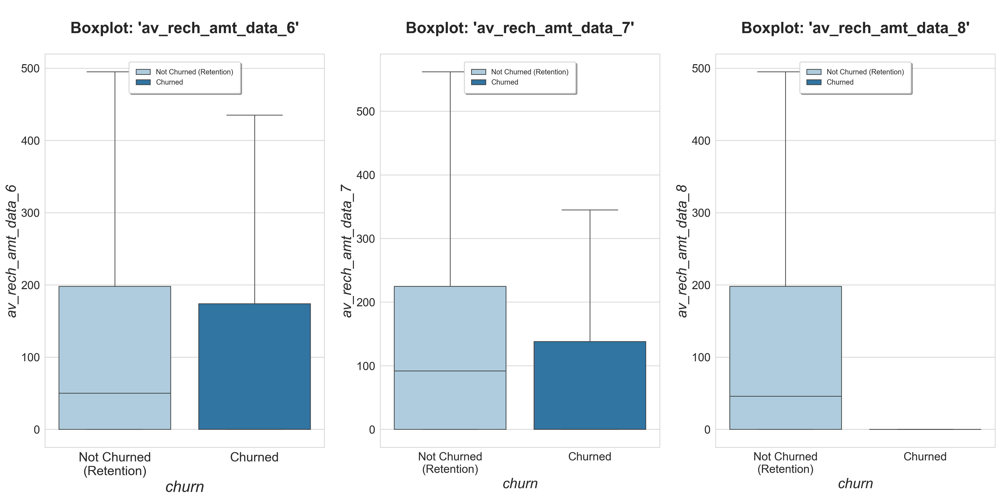

In [45]:
plot_boxplots_6_7_8('av_rech_amt_data')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


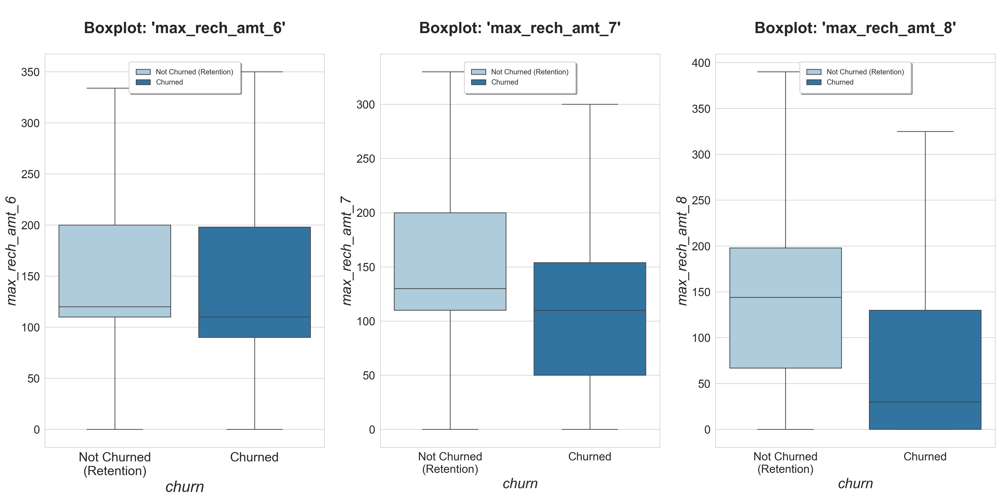

In [46]:
plot_boxplots_6_7_8('max_rech_amt')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


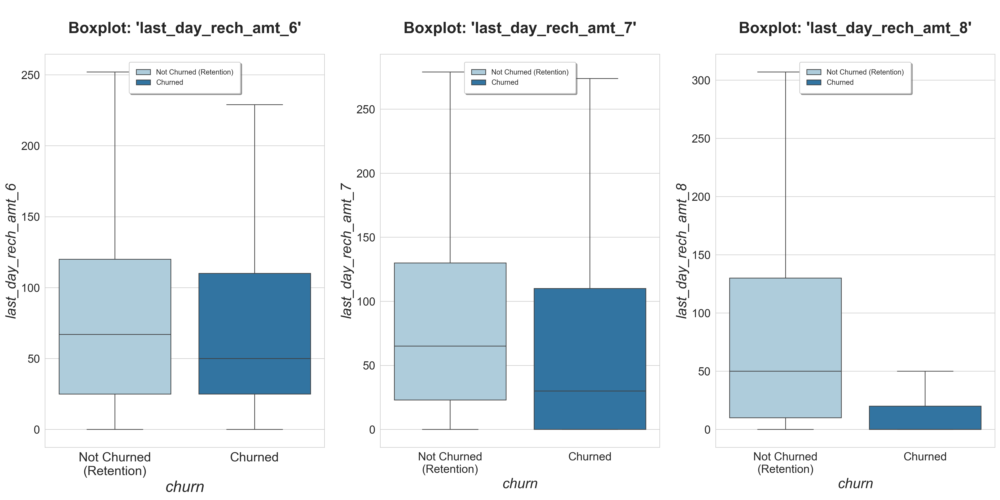

In [47]:
plot_boxplots_6_7_8('last_day_rech_amt')

In [48]:
other_rech = telecom_hv.columns[telecom_hv.columns.str.contains('rech_num|max_rech_data',regex=True)]
other_rech

Index(['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8',
       'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8'],
      dtype='object')

In [49]:
other_rech_df = telecom_hv[other_rech]
null_prcnt_df(other_rech_df)

,Column,Null Percentage
total_rech_num_6,total_rech_num_6,0.000000
total_rech_num_7,total_rech_num_7,0.000000
total_rech_num_8,total_rech_num_8,0.000000
max_rech_data_6,max_rech_data_6,44.112443
max_rech_data_7,max_rech_data_7,43.117551
max_rech_data_8,max_rech_data_8,46.799987


In [50]:
telecom_hv[['max_rech_data_6','max_rech_data_7','max_rech_data_8']].describe()

,max_rech_data_6,max_rech_data_7,max_rech_data_8
count,16740.000000,17038.000000,15935.000000
mean,139.804002,140.444712,136.353373
std,118.892926,120.295284,119.571138
min,1.000000,1.000000,1.000000
25%,25.000000,25.000000,25.000000
50%,152.000000,152.000000,152.000000
75%,198.000000,198.000000,198.000000
max,1555.000000,1555.000000,1555.000000


In [51]:
telecom_hv[['max_rech_data_6','max_rech_data_7','max_rech_data_8']] = telecom_hv[['max_rech_data_6','max_rech_data_7',\
                                                                                  'max_rech_data_8']].replace(np.nan, 0)

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


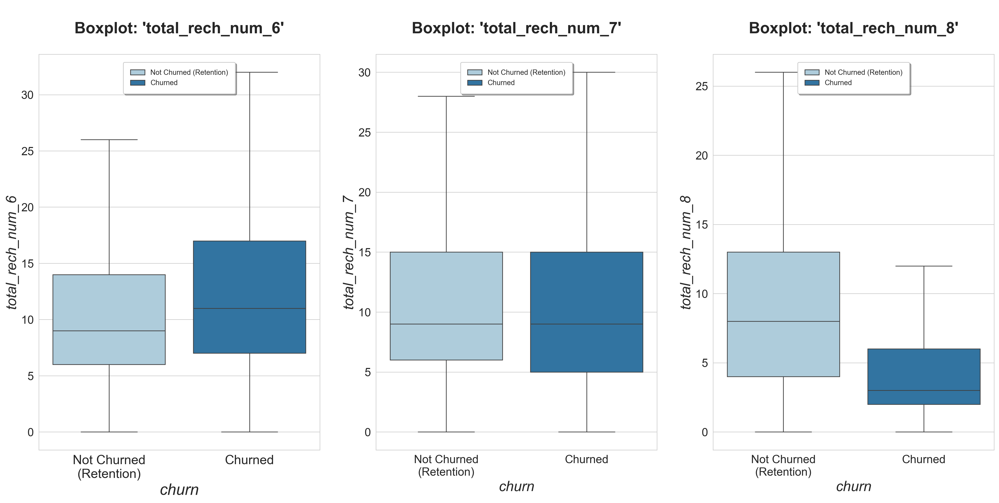

In [52]:
plot_boxplots_6_7_8('total_rech_num')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


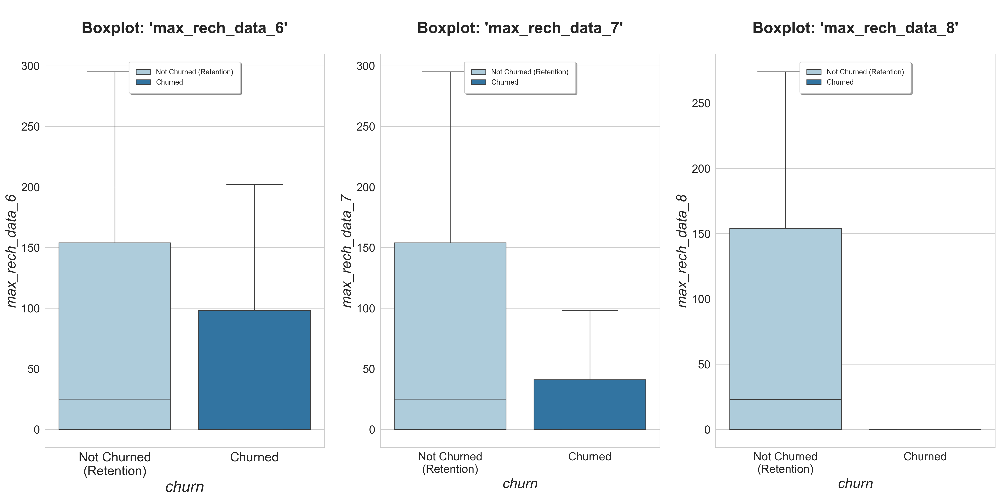

In [53]:
plot_boxplots_6_7_8('max_rech_data')

In [54]:
all_rech_vars = list(telecom_hv.columns[telecom_hv.columns.str.contains('rech_amt|rech_data_amt|rech_num|max_rech_data')])  ##Excluding 2g_3g
all_rech = telecom_hv[all_rech_vars]
null_prcnt_df(all_rech)

,Column,Null Percentage
total_rech_num_6,total_rech_num_6,0.0
total_rech_num_7,total_rech_num_7,0.0
total_rech_num_8,total_rech_num_8,0.0
total_rech_amt_6,total_rech_amt_6,0.0
total_rech_amt_7,total_rech_amt_7,0.0
total_rech_amt_8,total_rech_amt_8,0.0
max_rech_amt_6,max_rech_amt_6,0.0
max_rech_amt_7,max_rech_amt_7,0.0
max_rech_amt_8,max_rech_amt_8,0.0
last_day_rech_amt_6,last_day_rech_amt_6,0.0


In [55]:
usage_2g_3g_vars = list(telecom_hv.columns[telecom_hv.columns.str.contains('2g|3g',regex=True)])
usage_2g_3g_vars

['count_rech_2g_6',
 'count_rech_2g_7',
 'count_rech_2g_8',
 'count_rech_3g_6',
 'count_rech_3g_7',
 'count_rech_3g_8',
 'vol_2g_mb_6',
 'vol_2g_mb_7',
 'vol_2g_mb_8',
 'vol_3g_mb_6',
 'vol_3g_mb_7',
 'vol_3g_mb_8',
 'arpu_3g_6',
 'arpu_3g_7',
 'arpu_3g_8',
 'arpu_2g_6',
 'arpu_2g_7',
 'arpu_2g_8',
 'monthly_2g_6',
 'monthly_2g_7',
 'monthly_2g_8',
 'sachet_2g_6',
 'sachet_2g_7',
 'sachet_2g_8',
 'monthly_3g_6',
 'monthly_3g_7',
 'monthly_3g_8',
 'sachet_3g_6',
 'sachet_3g_7',
 'sachet_3g_8',
 'aug_vbc_3g',
 'jul_vbc_3g',
 'jun_vbc_3g']

In [56]:
usage_2g_3g = telecom_hv[usage_2g_3g_vars]
null_prcnt_df(usage_2g_3g)

,Column,Null Percentage
count_rech_2g_6,count_rech_2g_6,44.112443
count_rech_2g_7,count_rech_2g_7,43.117551
count_rech_2g_8,count_rech_2g_8,46.799987
count_rech_3g_6,count_rech_3g_6,44.112443
count_rech_3g_7,count_rech_3g_7,43.117551
count_rech_3g_8,count_rech_3g_8,46.799987
vol_2g_mb_6,vol_2g_mb_6,0.000000
vol_2g_mb_7,vol_2g_mb_7,0.000000
vol_2g_mb_8,vol_2g_mb_8,0.000000
vol_3g_mb_6,vol_3g_mb_6,0.000000


In [57]:
drop_vars = list(telecom_hv.columns[telecom_hv.columns.str.contains('arpu_2g|arpu_3g|count_rech_2g_|count_rech_3g')])
telecom_hv.drop(drop_vars, axis=1, inplace=True)

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


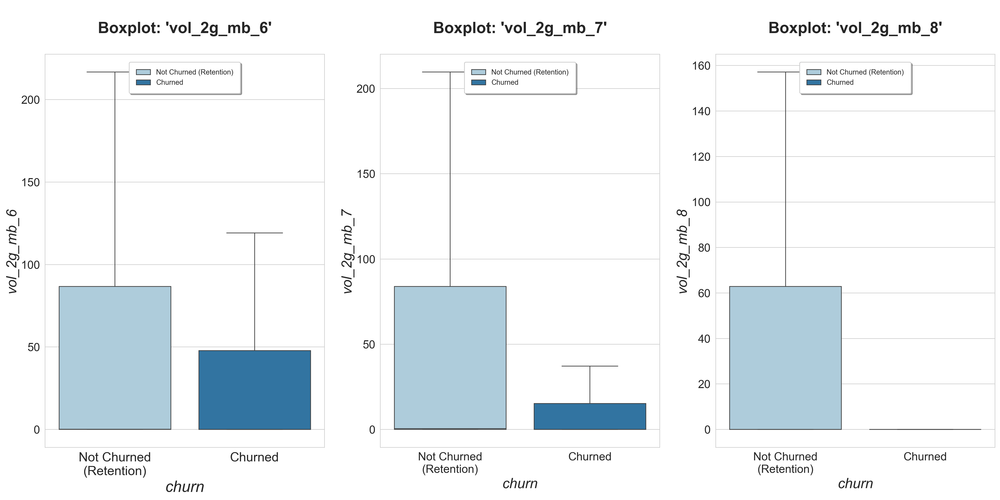

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


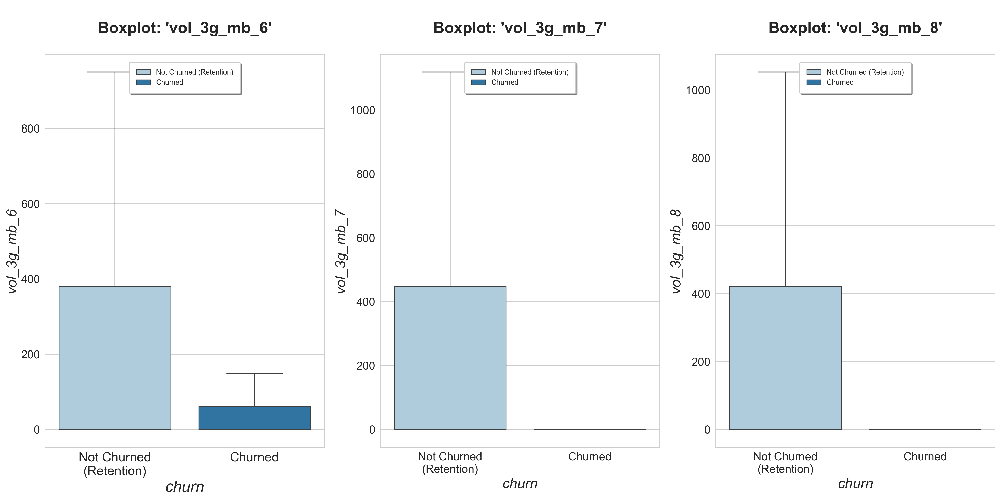

In [58]:
##Plotting volume of 2G data usage features:
plot_boxplots_6_7_8('vol_2g_mb')

##Plotting volume of 3G data usage features:
plot_boxplots_6_7_8('vol_3g_mb')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


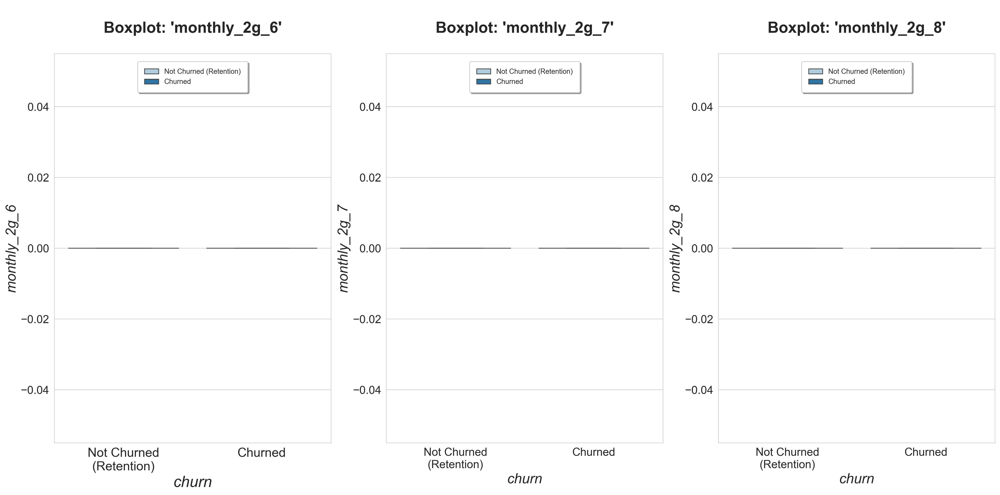

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


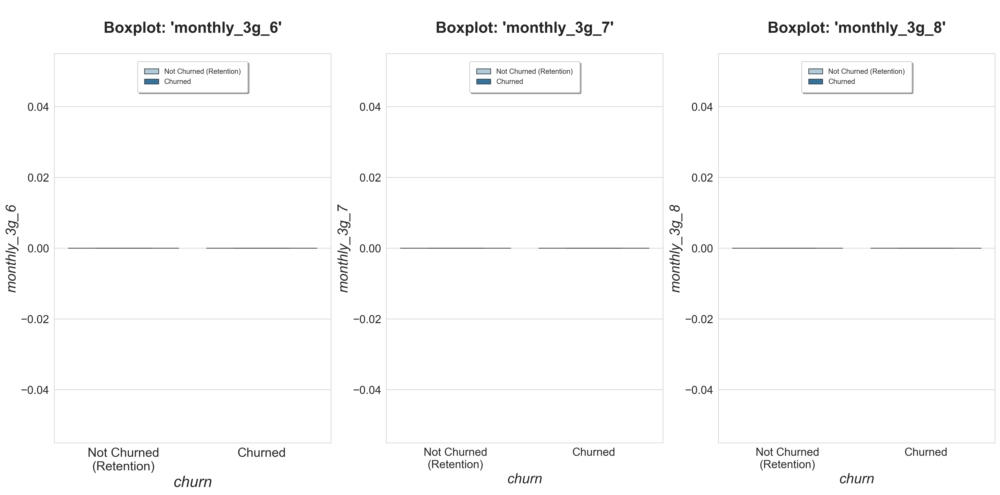

In [59]:
plot_boxplots_6_7_8('monthly_2g')  #monthly_2g for all 3 months
plot_boxplots_6_7_8('monthly_3g') 

In [60]:
def plot_barplots_6_7_8(feature):  ##Note: Showfliers: False (Suppresses the effect of outliers on the graphs.)
    plt.figure(figsize=(24,10), dpi=250)
    sns.set_style("whitegrid")
    df = telecom_hv.copy()
    
    plt.subplot(1,3,1)
    ax_11= sns.barplot(data=df, y=feature+"_6", x=df["churn"], hue="churn", palette=("Paired"))
    ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBarplot: '{feature}_6'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_6", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=22, fontstyle='italic')
    plt.yticks(fontsize=16)
    
    #legend subplot_131
    T1= ax_11.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T1.get_texts()[0].set_text('Not Churned (Retention)')
    T1.get_texts()[1].set_text('Churned')
    
    plt.subplot(1,3,2)
    ax_22= sns.barplot(data=df, y=feature+"_7", x=df["churn"], hue="churn", palette=("Paired"))
    ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBarplot: '{feature}_7'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_7", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=20, fontstyle='italic')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    #legend subplot_132
    T2= ax_22.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T2.get_texts()[0].set_text('Not Churned (Retention)')
    T2.get_texts()[1].set_text('Churned')

    plt.subplot(1,3,3)
    ax_33= sns.barplot(data=df, y=feature+"_8", x=df["churn"], hue="churn", palette=("Paired"))
    ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
    plt.title(f"\nBarplot: '{feature}_8'\n", fontsize=22, fontweight='bold')
    plt.ylabel(feature+"_8", fontsize=20, fontstyle='italic')
    plt.xlabel("churn", fontsize=20, fontstyle='italic')
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    
    #legend subplot_133
    T3= ax_33.legend(loc='center', bbox_to_anchor=(0.5, 0.94), fancybox=True, framealpha=1, shadow=True, borderpad=1)
    T3.get_texts()[0].set_text('Not Churned (Retention)')
    T3.get_texts()[1].set_text('Churned')
    
    plt.show()

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


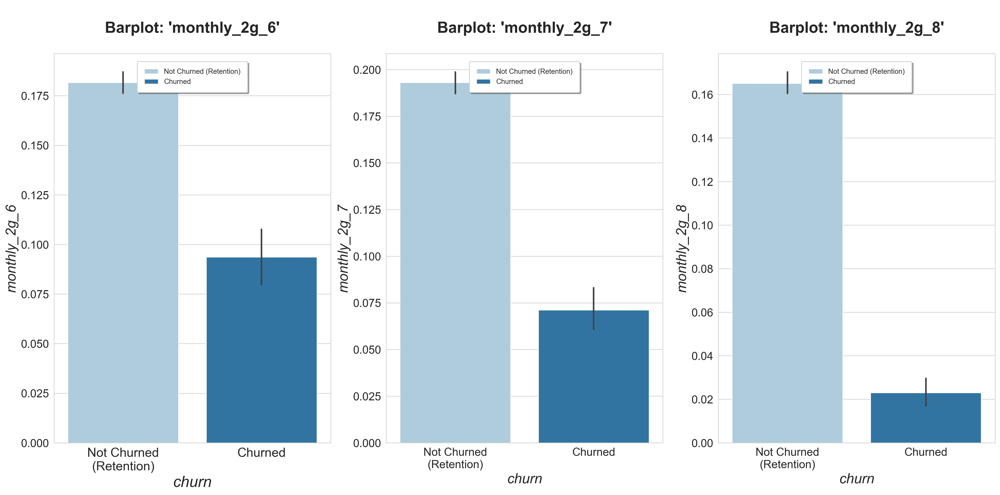

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


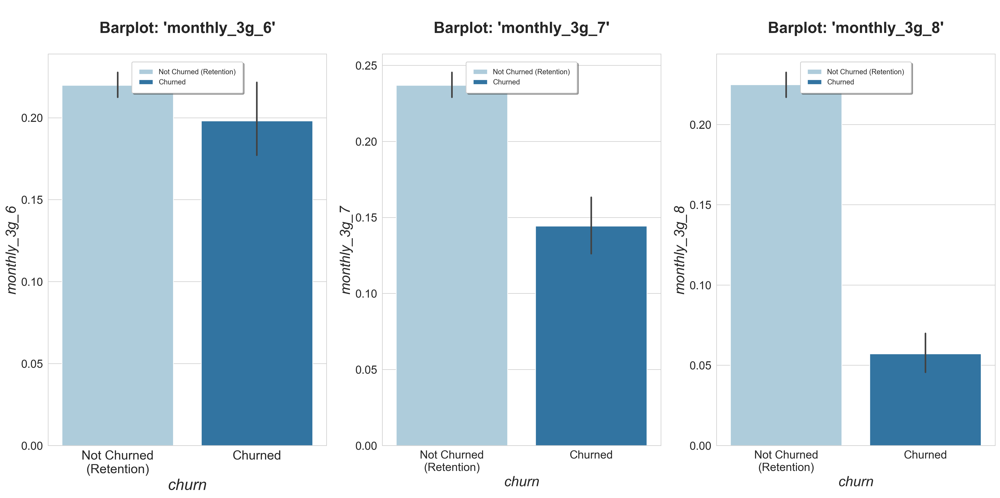

In [61]:
plot_barplots_6_7_8('monthly_2g')  #monthly_2g for all 3 months
plot_barplots_6_7_8('monthly_3g')   #monthly_3g for all 3 

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


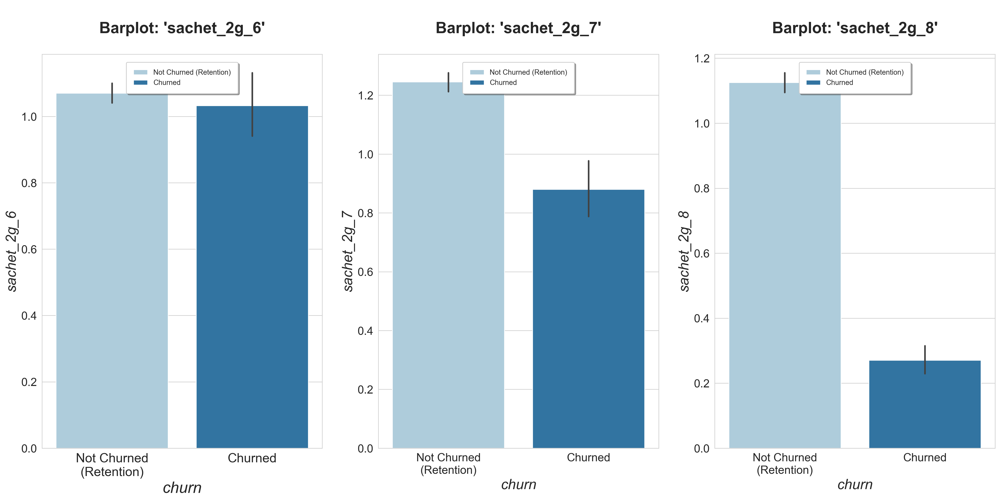

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


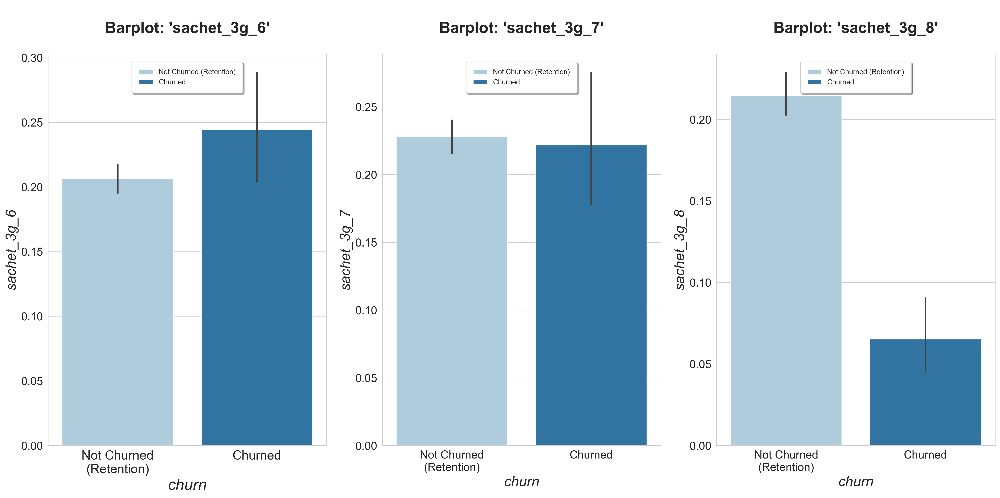

In [62]:
plot_barplots_6_7_8('sachet_2g')  #sachet_2g (service schemes with validity smaller than a month): for all 3 months
plot_barplots_6_7_8('sachet_3g')   #sachet_3g (service schemes with validity smaller than a month): for all 3 months

In [63]:
vbc_cols_list = list(telecom_hv.columns[telecom_hv.columns.str.contains('vbc')])
vbc_cols_list

['aug_vbc_3g', 'jul_vbc_3g', 'jun_vbc_3g']

In [64]:
telecom_hv.rename(columns={'jun_vbc_3g':'vbc_3g_6','jul_vbc_3g': 'vbc_3g_7', 'aug_vbc_3g': 'vbc_3g_8'}, inplace=True)

In [65]:
vbc_cols_list = list(telecom_hv.columns[telecom_hv.columns.str.contains('vbc')])
vbc_cols_list

['vbc_3g_8', 'vbc_3g_7', 'vbc_3g_6']

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


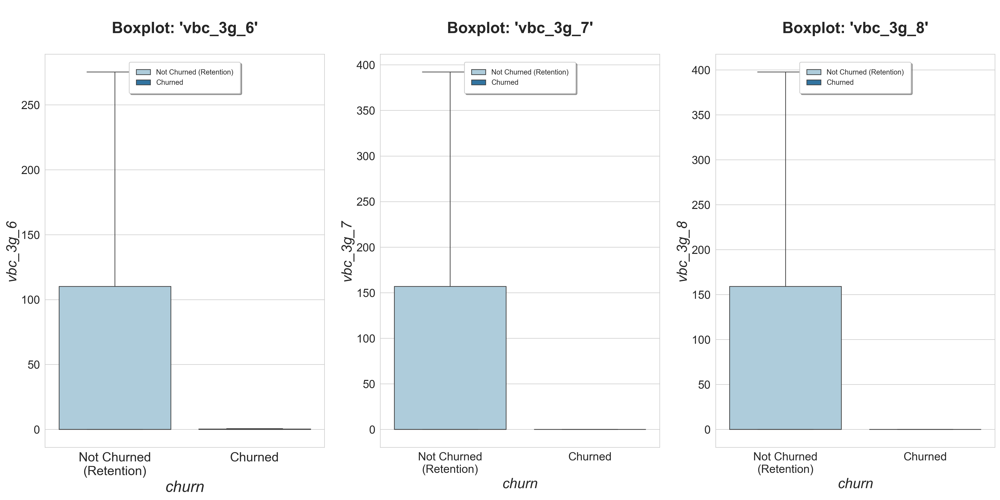

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


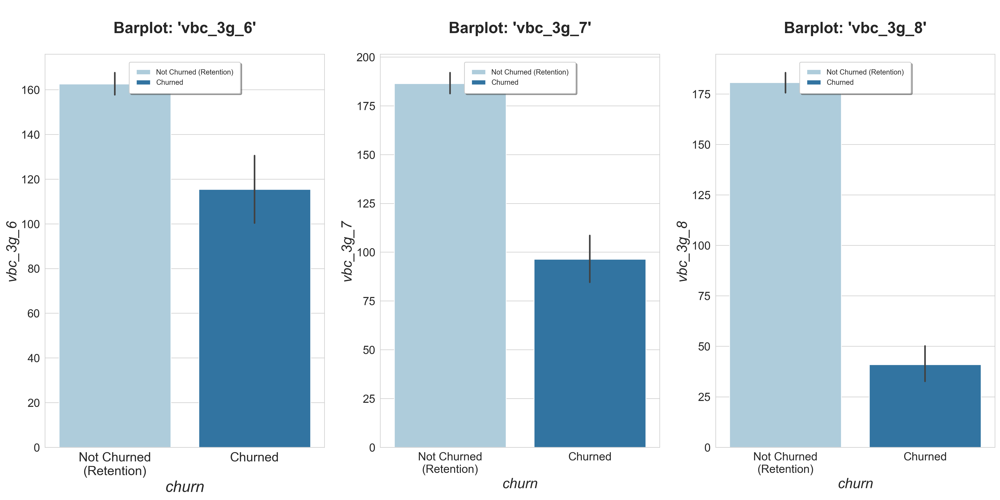

In [66]:
plot_boxplots_6_7_8('vbc_3g')
plot_barplots_6_7_8('vbc_3g')

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


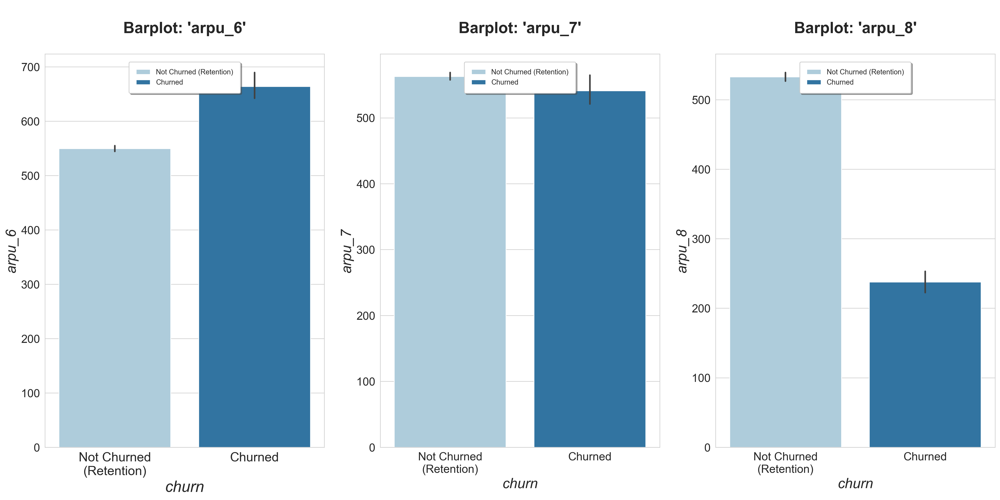

In [67]:
arpu_cols = telecom_hv.columns[telecom_hv.columns.str.contains('arpu_')]

##Plotting 'arpu_' barplots
plot_barplots_6_7_8('arpu')


In [68]:
mou_cols = telecom_hv.columns[telecom_hv.columns.str.contains('mou')]
mou_cols

Index(['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6',
       'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7',
       'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8',
       'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8',
       'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8',
       'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8',
       'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8',
       'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6',
       'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6',
       'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6',
       'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7',
       'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8',
       'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'total_og_mou_6',
       'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6',
       'loc_ic_t2t_mo

In [69]:
mou_cols_df = telecom_hv[mou_cols]
null_prcnt_df(mou_cols_df)

,Column,Null Percentage
onnet_mou_6,onnet_mou_6,1.809502
onnet_mou_7,onnet_mou_7,1.789470
onnet_mou_8,onnet_mou_8,3.912797
offnet_mou_6,offnet_mou_6,1.809502
offnet_mou_7,offnet_mou_7,1.789470
...,...,...
spl_ic_mou_7,spl_ic_mou_7,1.789470
spl_ic_mou_8,spl_ic_mou_8,3.912797
isd_ic_mou_6,isd_ic_mou_6,1.809502
isd_ic_mou_7,isd_ic_mou_7,1.789470


In [70]:
telecom_hv[mou_cols] = telecom_hv[mou_cols].replace(np.nan, 0)

In [71]:
mou_cols_df = telecom_hv[mou_cols]
null_prcnt_df(mou_cols_df)

,Column,Null Percentage
onnet_mou_6,onnet_mou_6,0.0
onnet_mou_7,onnet_mou_7,0.0
onnet_mou_8,onnet_mou_8,0.0
offnet_mou_6,offnet_mou_6,0.0
offnet_mou_7,offnet_mou_7,0.0
...,...,...
spl_ic_mou_7,spl_ic_mou_7,0.0
spl_ic_mou_8,spl_ic_mou_8,0.0
isd_ic_mou_6,isd_ic_mou_6,0.0
isd_ic_mou_7,isd_ic_mou_7,0.0


In [72]:
ic_mou_features = list(telecom_hv.columns[telecom_hv.columns.str.contains('.*_ic_.*mou_6')])
ic_mou_features

['roam_ic_mou_6',
 'loc_ic_t2t_mou_6',
 'loc_ic_t2m_mou_6',
 'loc_ic_t2f_mou_6',
 'loc_ic_mou_6',
 'std_ic_t2t_mou_6',
 'std_ic_t2m_mou_6',
 'std_ic_t2f_mou_6',
 'std_ic_mou_6',
 'total_ic_mou_6',
 'spl_ic_mou_6',
 'isd_ic_mou_6']

In [73]:
telecom_hv[ic_mou_features].describe()

,roam_ic_mou_6,loc_ic_t2t_mou_6,loc_ic_t2m_mou_6,loc_ic_t2f_mou_6,loc_ic_mou_6,std_ic_t2t_mou_6,std_ic_t2m_mou_6,std_ic_t2f_mou_6,std_ic_mou_6,total_ic_mou_6,spl_ic_mou_6,isd_ic_mou_6
count,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000
mean,16.124001,65.508916,150.474219,15.291721,231.284489,14.896832,29.212448,2.698829,46.811695,290.121569,0.061047,10.800999
std,76.344227,163.855393,219.321437,45.785255,315.005426,77.750215,98.279300,19.114766,137.597749,365.739944,0.188124,76.789627
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,6.100000,28.090000,0.000000,47.910000,0.000000,0.000000,0.000000,1.030000,72.890000,0.000000,0.000000
50%,0.000000,25.080000,84.110000,1.840000,134.560000,0.380000,5.000000,0.000000,11.410000,183.780000,0.000000,0.000000
75%,0.000000,67.480000,188.740000,11.980000,297.260000,8.190000,23.630000,0.110000,41.490000,372.160000,0.000000,0.000000
max,2613.310000,6351.440000,4693.860000,1678.410000,7454.630000,5459.560000,4630.230000,1351.110000,5459.630000,7716.140000,19.760000,6789.410000


<Figure size 1440x1200 with 0 Axes>

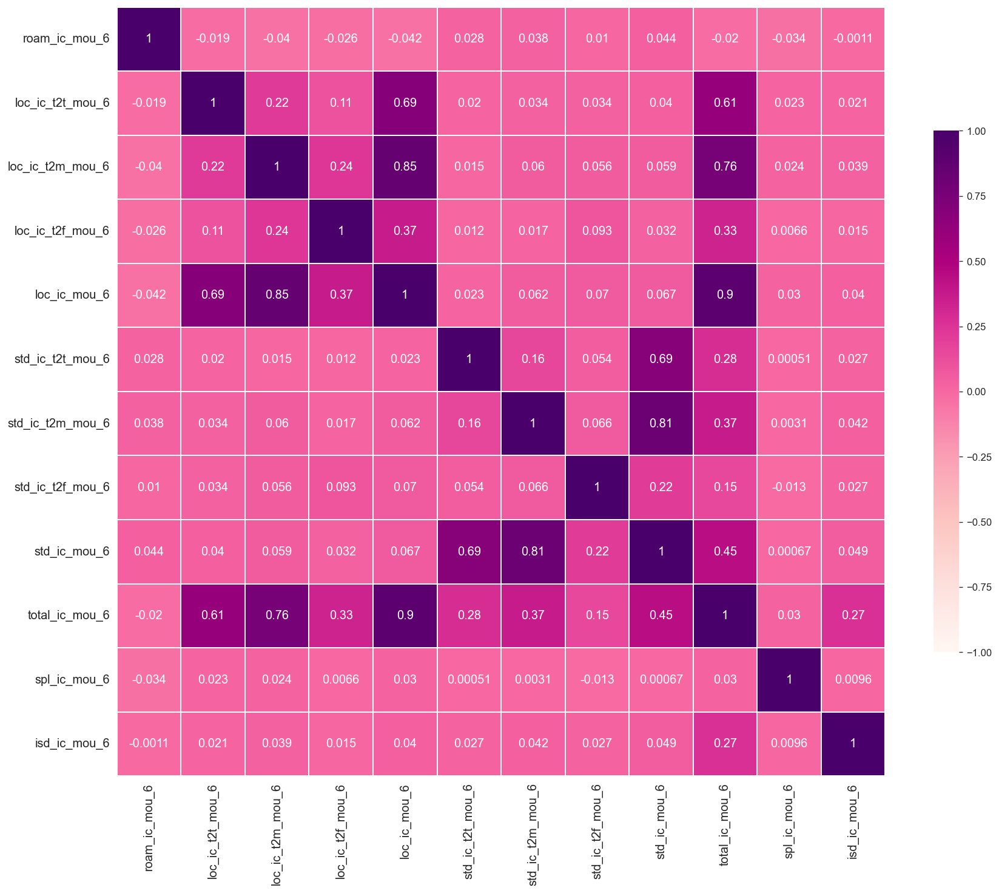

In [74]:
##Let's check the correlation between these variables to see if there is pattern between variables

#Plotting a heatmap to understand the correlation between the independent variables
plt.figure(figsize = (12,10), dpi=120)
corr_matrix_new = telecom_hv[ic_mou_features].corr()
f, ax_corr1 = plt.subplots(figsize=(15, 15), dpi=120)
ax_corr1 = sns.heatmap(corr_matrix_new, cmap= 'RdPu', cbar_kws={"shrink": .5}, vmin= -1, vmax=1, center=0,
            square=True, annot=True, linewidths=0.01, annot_kws={"size":12})
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
plt.autoscale()
plt.show()

In [75]:
##Let's check for a record (i.e. index 8: example)

print("'loc_ic_mou_6' = 'loc_ic_t2t_mou_6' + 'loc_ic_t2m_mou_6' + 'loc_ic_t2f_mou_6'")
print(telecom_hv.loc[8,'loc_ic_mou_6'],"==",telecom_hv.loc[8,['loc_ic_t2t_mou_6','loc_ic_t2m_mou_6','loc_ic_t2f_mou_6']].sum())

print("\n'std_ic_mou_6' = 'std_ic_t2t_mou_6' + 'std_ic_t2m_mou_6' + 'std_ic_t2f_mou_6'")
print(telecom_hv.loc[8,'std_ic_mou_6'],"==",telecom_hv.loc[8,['std_ic_t2t_mou_6','std_ic_t2m_mou_6','std_ic_t2f_mou_6']].sum())

print("\n'total_ic_mou_6' = 'loc_ic_mou_6' + 'std_ic_mou_6' + 'isd_ic_mou_6' + 'spl_ic_mou_6'")
print(telecom_hv.loc[8,'total_ic_mou_6'],"==",telecom_hv.loc[8,['loc_ic_mou_6','std_ic_mou_6','isd_ic_mou_6', 'spl_ic_mou_6']].sum())

'loc_ic_mou_6' = 'loc_ic_t2t_mou_6' + 'loc_ic_t2m_mou_6' + 'loc_ic_t2f_mou_6'
81.43 == 81.42

'std_ic_mou_6' = 'std_ic_t2t_mou_6' + 'std_ic_t2m_mou_6' + 'std_ic_t2f_mou_6'
22.43 == 22.43

'total_ic_mou_6' = 'loc_ic_mou_6' + 'std_ic_mou_6' + 'isd_ic_mou_6' + 'spl_ic_mou_6'
103.86 == 103.86000000000001


In [77]:
drop_ic_mou_features = list(telecom_hv.columns[telecom_hv.columns.str.contains('loc_ic_mou_|std_ic_mou_|total_ic_mou_')])
print('List of features dropped:\n', drop_ic_mou_features)

telecom_hv.drop(drop_ic_mou_features, axis=1, inplace=True)  # Removed the pipe character at the end

List of features dropped:
 ['loc_ic_mou_6', 'loc_ic_mou_7', 'loc_ic_mou_8', 'std_ic_mou_6', 'std_ic_mou_7', 'std_ic_mou_8', 'total_ic_mou_6', 'total_ic_mou_7', 'total_ic_mou_8']


In [78]:
og_mou_features = list(telecom_hv.columns[telecom_hv.columns.str.contains('.*_og_.*mou_6')])
og_mou_features

['roam_og_mou_6',
 'loc_og_t2t_mou_6',
 'loc_og_t2m_mou_6',
 'loc_og_t2f_mou_6',
 'loc_og_t2c_mou_6',
 'loc_og_mou_6',
 'std_og_t2t_mou_6',
 'std_og_t2m_mou_6',
 'std_og_t2f_mou_6',
 'std_og_mou_6',
 'isd_og_mou_6',
 'spl_og_mou_6',
 'total_og_mou_6']

<Figure size 1440x1200 with 0 Axes>

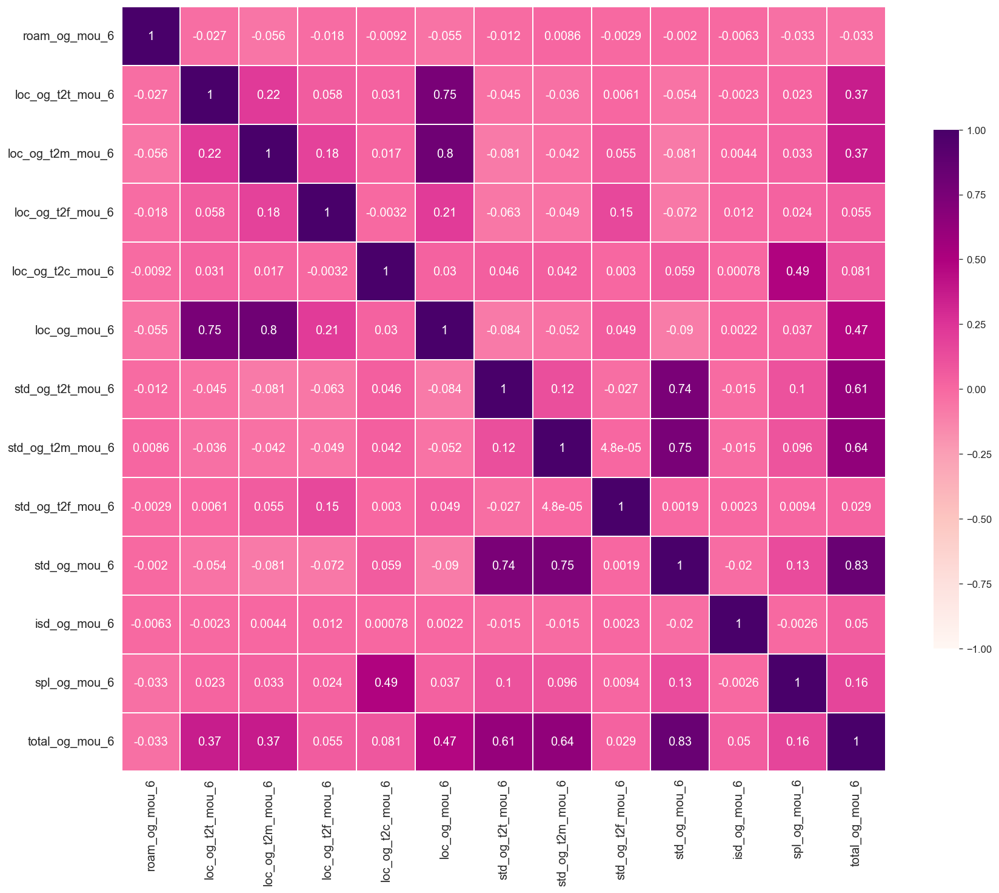

In [79]:
##Let's check the correlation between these variables to see if there is pattern between variables

#Plotting a heatmap to understand the correlation between the independent variables
plt.figure(figsize = (12,10), dpi=120)
corr_matrix_new = telecom_hv[og_mou_features].corr()
f, ax_corr1 = plt.subplots(figsize=(15, 15), dpi=120)
ax_corr1 = sns.heatmap(corr_matrix_new, cmap= 'RdPu', cbar_kws={"shrink": .5}, vmin= -1, vmax=1, center=0,
            square=True, annot=True, linewidths=0.01, annot_kws={"size":12})
plt.xticks(fontsize=12, rotation=90)
plt.yticks(fontsize=12, rotation=0)
plt.tight_layout()
plt.autoscale()
plt.show()

In [80]:
print("'loc_og_mou_6' = 'loc_og_t2t_mou_6' + 'loc_og_t2m_mou_6' + 'loc_og_t2f_mou_6'")
print(telecom_hv.loc[21,'loc_og_mou_6'],"==",telecom_hv.loc[21,['loc_og_t2t_mou_6','loc_og_t2m_mou_6','loc_og_t2f_mou_6']].sum())

print("\n'std_og_mou_6' = 'std_og_t2t_mou_6' + 'std_og_t2m_mou_6' + 'std_og_t2f_mou_6'")
print(telecom_hv.loc[21,'std_og_mou_6'],"==",telecom_hv.loc[21,['std_og_t2t_mou_6','std_og_t2m_mou_6','std_og_t2f_mou_6']].sum())

print("\n'total_og_mou_6' = 'loc_og_mou_6' + 'std_og_mou_6' +  'spl_og_mou_6' + 'isd_og_mou_6'")
print(telecom_hv.loc[21,'total_og_mou_6'],"==",telecom_hv.loc[21,['loc_og_mou_6','std_og_mou_6','spl_og_mou_6','isd_og_mou_6']].sum())

'loc_og_mou_6' = 'loc_og_t2t_mou_6' + 'loc_og_t2m_mou_6' + 'loc_og_t2f_mou_6'
97.04 == 97.04

'std_og_mou_6' = 'std_og_t2t_mou_6' + 'std_og_t2m_mou_6' + 'std_og_t2f_mou_6'
763.29 == 763.29

'total_og_mou_6' = 'loc_og_mou_6' + 'std_og_mou_6' +  'spl_og_mou_6' + 'isd_og_mou_6'
860.34 == 860.3299999999999


In [81]:
##Dropping 'loc_og_mou', 'std_og_mou' and 'total_og_mou' for all 3 months
drop_og_mou_features = list(telecom_hv.columns[telecom_hv.columns.str.contains('loc_og_mou_|std_og_mou_|total_og_mou_')])
print('List of features dropped:\n', drop_og_mou_features)

telecom_hv.drop(drop_og_mou_features, axis=1, inplace= True)

List of features dropped:
 ['loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']


In [82]:
offnet_usage_cols = list(telecom_hv.columns[telecom_hv.columns.str.contains('offnet.*mou')])
offnet_usage_cols

['offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8']

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


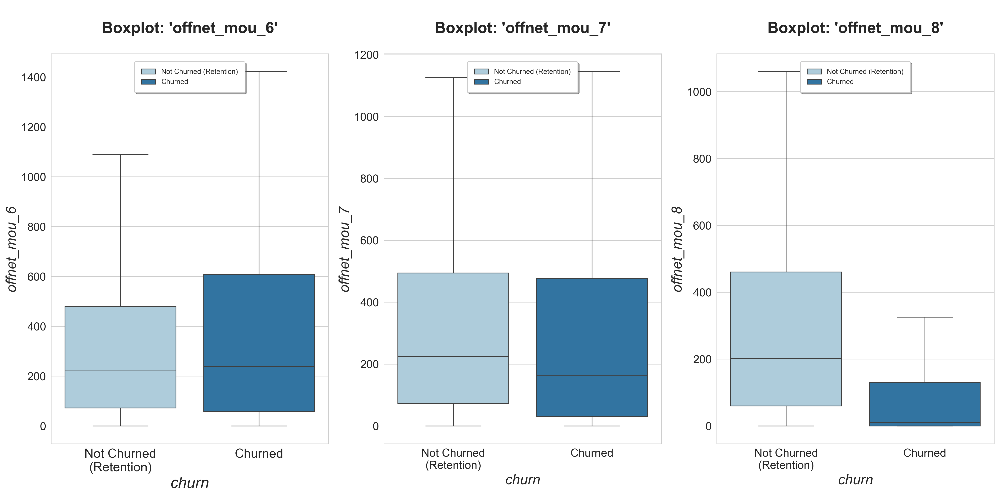

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


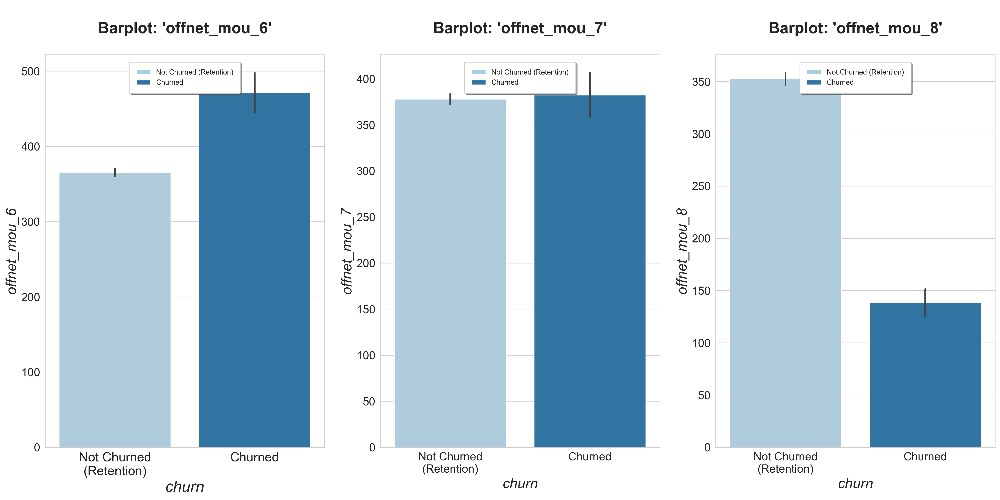

In [83]:
plot_boxplots_6_7_8('offnet_mou')  #Suppresses outliers
plot_barplots_6_7_8('offnet_mou')

In [84]:
onnet_usage_cols = list(telecom_hv.columns[telecom_hv.columns.str.contains('onnet.*mou')])
onnet_usage_cols

['onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8']

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\4067312953.py:36: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


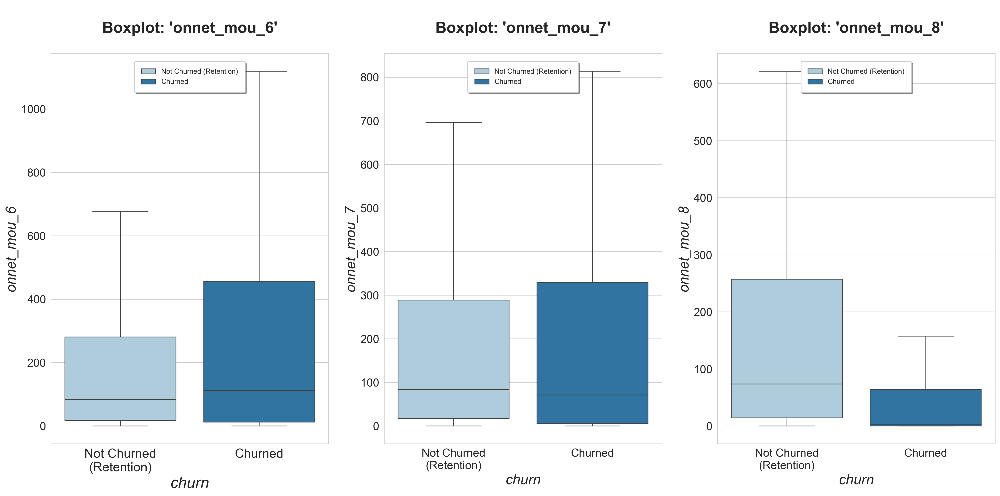

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:8: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_11.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:21: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_22.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3920388471.py:35: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax_33.set_xticklabels(labels=['Not Churned\n(Retention)','Churned'], fontsize=18)


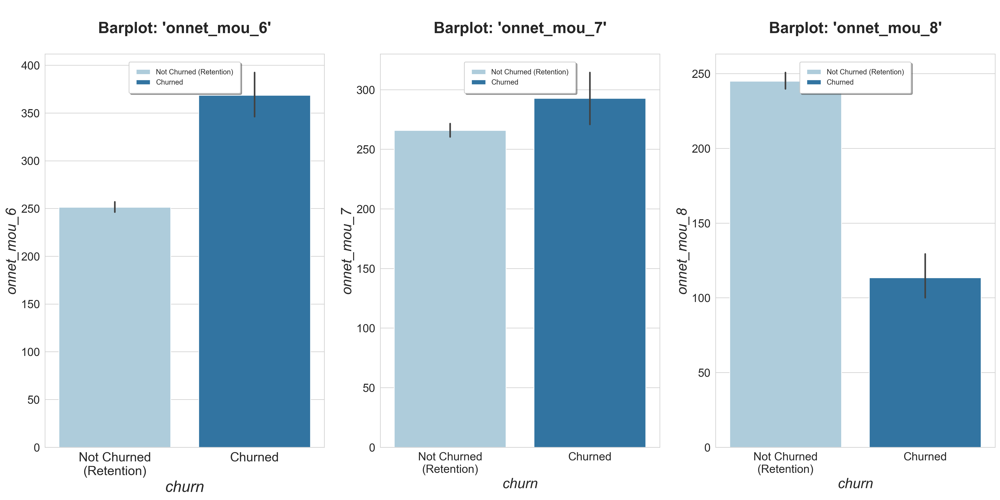

In [85]:
# Plotting 'onnet_mou' boxplots and barplots
plot_boxplots_6_7_8('onnet_mou')  #Suppresses outliers
plot_barplots_6_7_8('onnet_mou')

In [86]:
##Creating  a new column tenure_year to store the number of years the customer has been on network T
telecom_hv['tenure_year'] = round(telecom_hv['aon']/365, 1)

print(telecom_hv.tenure_year.value_counts())
print("Min:",telecom_hv.tenure_year.min())
print("Max:",telecom_hv.tenure_year.max())

tenure_year
1.3     1361
0.6     1110
0.8     1068
1.0     1035
0.9      991
        ... 
10.7       3
11.8       2
10.3       1
11.0       1
11.6       1
Name: count, Length: 105, dtype: int64
Min: 0.5
Max: 11.8


In [87]:
my_bins = [0,1,2,3,5,12]
my_labels_aon= ['0_1_year','1_2_year','2_3_year','3_5_year','5_12_year']
telecom_hv['tenure'] = pd.cut(telecom_hv['tenure_year'], bins= my_bins, labels= my_labels_aon)

##Dropping 'tenure_year' and 'aon' column as we have already created bins in 'tenure' column
telecom_hv.drop(['tenure_year','aon'] , axis=1, inplace= True)

telecom_hv.tenure.value_counts()

tenure
1_2_year     7808
5_12_year    7123
0_1_year     5777
3_5_year     4754
2_3_year     4491
Name: count, dtype: int64

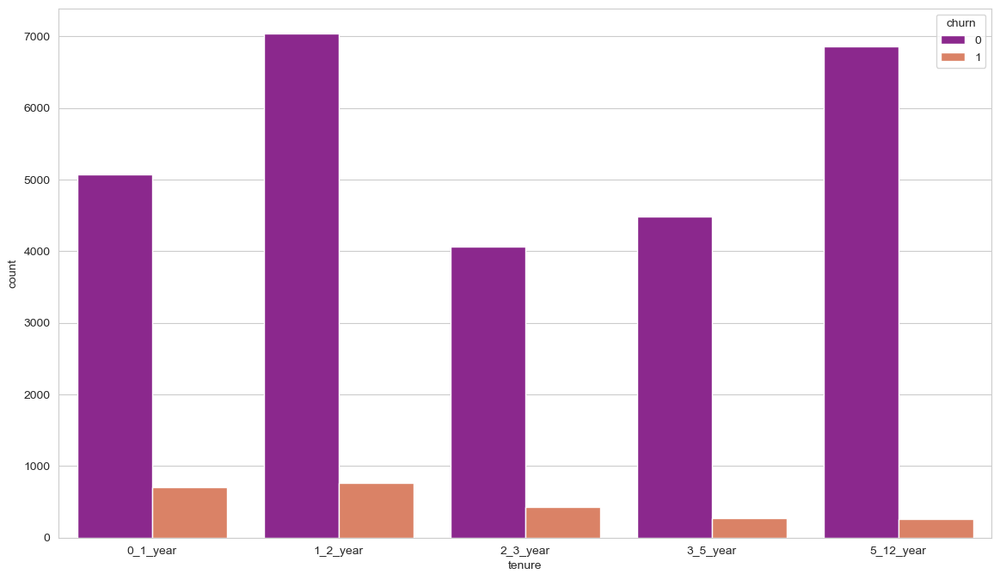

In [88]:
plt.figure(figsize=(14,8))
tenure_df= telecom_hv[['tenure','churn']]
sns.countplot(x = 'tenure', hue = 'churn',data = tenure_df,palette=("plasma"))
plt.show()

In [89]:
##Check for missing values in telecom_hv dataframe (show only missing value columns)
missing_val_cols_prcnt = round(100*telecom_hv.isnull().sum()/len(telecom_hv.index),2)
missing = pd.DataFrame(missing_val_cols_prcnt[missing_val_cols_prcnt!=0].sort_values(ascending=False))  #Descending order(% NaN)
missing.reset_index(inplace=True)
missing= missing.rename(columns={'index':'features',0:'Null_Percentage'})
missing

,features,Null_Percentage
0,night_pck_user_8,46.80
1,fb_user_8,46.80
2,night_pck_user_6,44.11
3,fb_user_6,44.11
4,night_pck_user_7,43.12
5,fb_user_7,43.12
6,og_others_8,3.91
7,ic_others_8,3.91
8,og_others_6,1.81
9,ic_others_6,1.81


In [90]:
##Dropping 'fb_user_*' and 'night_pck_user_*' features
cols_to_drop = ['fb_user_6', 'fb_user_7', 'fb_user_8', 'night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8']
telecom_hv.drop(cols_to_drop, axis=1, inplace= True)

##Imputing 'ic_others' and 'og_others' with 0 (<=3.91% missing values)
cols_to_impute = telecom_hv.columns[telecom_hv.columns.str.contains('ic_others|og_others')]
telecom_hv[cols_to_impute] = telecom_hv[cols_to_impute].replace(np.nan, 0)

In [91]:
null_prcnt_df(telecom_hv)

,Column,Null Percentage
mobile_number,mobile_number,0.0
arpu_6,arpu_6,0.0
arpu_7,arpu_7,0.0
arpu_8,arpu_8,0.0
onnet_mou_6,onnet_mou_6,0.0
...,...,...
total_rech_data_amt_7,total_rech_data_amt_7,0.0
total_rech_data_amt_8,total_rech_data_amt_8,0.0
avg_total_rech_plus_data_amt_6_7,avg_total_rech_plus_data_amt_6_7,0.0
churn,churn,0.0


In [92]:
telecom_hv.shape

(29953, 121)

In [93]:
attributes_6 = list(telecom_hv.columns[telecom_hv.columns.str.contains("_6")])
print(attributes_6)
print(len(attributes_6))

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'last_day_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'av_rech_amt_data_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'vbc_3g_6', 'total_rech_data_amt_6', 'avg_total_rech_plus_data_amt_6_7']
40


In [95]:
attributes_7 = telecom_hv.columns[telecom_hv.columns.str.contains("_7")]
print(attributes_7)
print(len(attributes_7))


Index(['arpu_7', 'onnet_mou_7', 'offnet_mou_7', 'roam_ic_mou_7',
       'roam_og_mou_7', 'loc_og_t2t_mou_7', 'loc_og_t2m_mou_7',
       'loc_og_t2f_mou_7', 'loc_og_t2c_mou_7', 'std_og_t2t_mou_7',
       'std_og_t2m_mou_7', 'std_og_t2f_mou_7', 'isd_og_mou_7', 'spl_og_mou_7',
       'og_others_7', 'loc_ic_t2t_mou_7', 'loc_ic_t2m_mou_7',
       'loc_ic_t2f_mou_7', 'std_ic_t2t_mou_7', 'std_ic_t2m_mou_7',
       'std_ic_t2f_mou_7', 'spl_ic_mou_7', 'isd_ic_mou_7', 'ic_others_7',
       'total_rech_num_7', 'total_rech_amt_7', 'max_rech_amt_7',
       'last_day_rech_amt_7', 'total_rech_data_7', 'max_rech_data_7',
       'av_rech_amt_data_7', 'vol_2g_mb_7', 'vol_3g_mb_7', 'monthly_2g_7',
       'sachet_2g_7', 'monthly_3g_7', 'sachet_3g_7', 'vbc_3g_7',
       'total_rech_data_amt_7', 'avg_total_rech_plus_data_amt_6_7'],
      dtype='object')
40


In [96]:
telecom_hv.drop('avg_total_rech_plus_data_amt_6_7', axis=1, inplace= True)

In [97]:
feature_names_6 = [i.split('_6')[0] for i in attributes_6 if i.endswith("_6")]
feature_names_7 = [i.split('_7')[0] for i in attributes_7 if i.endswith("_7")]
uncommon_feature_names = [i for i,j in (zip(feature_names_6, feature_names_7)) if i!=j]
uncommon_feature_names

[]

In [98]:
common_feature_names= [i for i,j in (zip(feature_names_6, feature_names_7)) if i==j]
common_feature_names

['arpu',
 'onnet_mou',
 'offnet_mou',
 'roam_ic_mou',
 'roam_og_mou',
 'loc_og_t2t_mou',
 'loc_og_t2m_mou',
 'loc_og_t2f_mou',
 'loc_og_t2c_mou',
 'std_og_t2t_mou',
 'std_og_t2m_mou',
 'std_og_t2f_mou',
 'isd_og_mou',
 'spl_og_mou',
 'og_others',
 'loc_ic_t2t_mou',
 'loc_ic_t2m_mou',
 'loc_ic_t2f_mou',
 'std_ic_t2t_mou',
 'std_ic_t2m_mou',
 'std_ic_t2f_mou',
 'spl_ic_mou',
 'isd_ic_mou',
 'ic_others',
 'total_rech_num',
 'total_rech_amt',
 'max_rech_amt',
 'last_day_rech_amt',
 'total_rech_data',
 'max_rech_data',
 'av_rech_amt_data',
 'vol_2g_mb',
 'vol_3g_mb',
 'monthly_2g',
 'sachet_2g',
 'monthly_3g',
 'sachet_3g',
 'vbc_3g',
 'total_rech_data_amt']

In [99]:
f6_cols=[]
f7_cols=[]
for feature in common_feature_names:
    f6= feature+'_6'
    f7= feature+'_7'
    avg_67= feature+'_avg_6_7'
    
    f6_cols.append(f6)  ##Storing all remaining attributes from '_6'
    f7_cols.append(f7)  ##Storing all remaining attributes from '_7'
    
    telecom_hv[avg_67] = (telecom_hv[f6] + telecom_hv[f7])/2

telecom_hv.head()

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\2554706007.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  telecom_hv[avg_67] = (telecom_hv[f6] + telecom_hv[f7])/2
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\2554706007.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  telecom_hv[avg_67] = (telecom_hv[f6] + telecom_hv[f7])/2
C:\Users\USER\AppData\Local\Temp\ipykernel_9808\2554706007.py:11: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has po

,mobile_number,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,...,max_rech_data_avg_6_7,av_rech_amt_data_avg_6_7,vol_2g_mb_avg_6_7,vol_3g_mb_avg_6_7,monthly_2g_avg_6_7,sachet_2g_avg_6_7,monthly_3g_avg_6_7,sachet_3g_avg_6_7,vbc_3g_avg_6_7,total_rech_data_amt_avg_6_7
0,7000842753,197.385,214.816,213.803,0.00,0.00,0.00,0.00,0.00,0.00,...,252.0,252.0,15.725,117.165,0.0,0.0,1.0,0.0,50.600,252.0
7,7000701601,1069.180,1349.850,3171.480,57.84,54.68,52.29,453.43,567.16,325.91,...,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.0,19.060,0.0
8,7001524846,378.721,492.223,137.362,413.69,351.03,35.08,94.66,80.63,136.48,...,77.0,88.5,178.000,375.475,0.5,0.5,0.0,0.0,516.405,177.0
21,7002124215,514.453,597.753,637.760,102.41,132.11,85.14,757.93,896.68,983.39,...,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0
23,7000887461,74.350,193.897,366.966,48.96,50.66,33.58,85.41,89.36,205.89,...,89.5,178.0,0.240,299.545,0.0,0.0,1.0,0.0,25.930,356.0


In [100]:
telecom_hv.drop(f6_cols, axis=1, inplace=True)

In [101]:
telecom_hv.drop(f7_cols, axis=1, inplace=True)

In [102]:
telecom_hv.head()

,mobile_number,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,...,max_rech_data_avg_6_7,av_rech_amt_data_avg_6_7,vol_2g_mb_avg_6_7,vol_3g_mb_avg_6_7,monthly_2g_avg_6_7,sachet_2g_avg_6_7,monthly_3g_avg_6_7,sachet_3g_avg_6_7,vbc_3g_avg_6_7,total_rech_data_amt_avg_6_7
0,7000842753,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,252.0,252.0,15.725,117.165,0.0,0.0,1.0,0.0,50.600,252.0
7,7000701601,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,...,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.0,19.060,0.0
8,7001524846,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,...,77.0,88.5,178.000,375.475,0.5,0.5,0.0,0.0,516.405,177.0
21,7002124215,637.760,85.14,983.39,0.00,0.00,23.34,104.81,1.58,0.00,...,0.0,0.0,0.000,0.000,0.0,0.0,0.0,0.0,0.000,0.0
23,7000887461,366.966,33.58,205.89,0.00,0.00,33.58,148.56,0.00,17.71,...,89.5,178.0,0.240,299.545,0.0,0.0,1.0,0.0,25.930,356.0


In [103]:
telecom_hv.shape

(29953, 81)

In [104]:
telecom_hv.describe(percentiles= [0.01, 0.1, 0.25, 0.5, 0.75, 0.9, 0.95, 0.99, 0.999])

,mobile_number,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,...,max_rech_data_avg_6_7,av_rech_amt_data_avg_6_7,vol_2g_mb_avg_6_7,vol_3g_mb_avg_6_7,monthly_2g_avg_6_7,sachet_2g_avg_6_7,monthly_3g_avg_6_7,sachet_3g_avg_6_7,vbc_3g_avg_6_7,total_rech_data_amt_avg_6_7
count,2.995300e+04,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,...,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000,29953.000000
mean,7.001206e+09,508.890301,234.345252,335.123008,12.512269,19.889295,78.153334,151.810056,5.891865,1.701889,...,79.010717,135.348290,125.818200,357.604327,0.178830,1.141488,0.223717,0.218726,168.894747,492.672953
std,6.908102e+05,502.136278,458.751242,481.985106,74.179181,104.799622,227.540167,233.745412,19.516259,7.147606,...,103.245264,182.091835,299.869268,840.511247,0.387753,2.416324,0.571520,0.948674,392.995414,1239.408758
min,7.000000e+09,-945.808000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1%,7.000026e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
10%,7.000251e+09,84.302800,0.000000,2.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,7.000609e+09,231.615000,10.440000,46.760000,0.000000,0.000000,2.540000,13.130000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,7.001203e+09,427.604000,65.660000,182.840000,0.000000,0.000000,20.740000,67.790000,0.000000,0.000000,...,25.000000,92.000000,6.285000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,154.000000
75%,7.001804e+09,661.753000,240.630000,438.860000,0.000000,0.000000,72.130000,197.030000,3.930000,0.010000,...,149.500000,211.000000,108.105000,445.050000,0.000000,1.000000,0.000000,0.000000,158.345000,501.000000
90%,7.002165e+09,977.546400,666.266000,823.880000,15.030000,28.880000,179.138000,398.496000,15.188000,4.576000,...,203.000000,314.700000,395.045000,1090.352000,1.000000,4.000000,1.000000,0.500000,560.194000,1233.400000


In [105]:
cont_cols_hv= [i for i in telecom_hv.columns if i not in ['mobile_number', 'churn', 'tenure']]
cont_cols_hv

##Using numpy clip() to cap the values of outliers in between 1 and 99.9 percentiles
import numpy as np
for col in cont_cols_hv:
    percentiles = telecom_hv[col].quantile([0.01,0.999]).values
    telecom_hv[col] = np.clip(telecom_hv[col], percentiles[0], percentiles[1])

In [106]:
telecom_hv.tenure.head()

0     2_3_year
7     2_3_year
8     0_1_year
21    1_2_year
23    1_2_year
Name: tenure, dtype: category
Categories (5, object): ['0_1_year' < '1_2_year' < '2_3_year' < '3_5_year' < '5_12_year']

In [107]:
cat_cols= ['tenure']
d_tenure = pd.get_dummies(telecom_hv['tenure'], prefix='tenure', drop_first = True)
telecom_hv = pd.concat([telecom_hv, d_tenure], axis = 1)

##Dropping the 'tenure' column
telecom_hv.drop(cat_cols, axis=1, inplace=True)

In [108]:
telecom_hv.head()

,mobile_number,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,...,monthly_2g_avg_6_7,sachet_2g_avg_6_7,monthly_3g_avg_6_7,sachet_3g_avg_6_7,vbc_3g_avg_6_7,total_rech_data_amt_avg_6_7,tenure_1_2_year,tenure_2_3_year,tenure_3_5_year,tenure_5_12_year
0,7000842753,213.803,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.0,0.0,1.0,0.0,50.600,252.0,False,True,False,False
7,7000701601,3171.480,52.29,325.91,31.64,38.06,40.28,162.28,53.23,0.00,...,0.0,0.0,0.0,0.0,19.060,0.0,False,True,False,False
8,7001524846,137.362,35.08,136.48,0.00,0.00,12.49,50.54,0.00,7.15,...,0.5,0.5,0.0,0.0,516.405,177.0,False,False,False,False
21,7002124215,637.760,85.14,983.39,0.00,0.00,23.34,104.81,1.58,0.00,...,0.0,0.0,0.0,0.0,0.000,0.0,True,False,False,False
23,7000887461,366.966,33.58,205.89,0.00,0.00,33.58,148.56,0.00,17.71,...,0.0,0.0,1.0,0.0,25.930,356.0,True,False,False,False


In [109]:
telecom_hv.info()

<class 'pandas.core.frame.DataFrame'>
Index: 29953 entries, 0 to 99997
Data columns (total 84 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   mobile_number                29953 non-null  int64  
 1   arpu_8                       29953 non-null  float64
 2   onnet_mou_8                  29953 non-null  float64
 3   offnet_mou_8                 29953 non-null  float64
 4   roam_ic_mou_8                29953 non-null  float64
 5   roam_og_mou_8                29953 non-null  float64
 6   loc_og_t2t_mou_8             29953 non-null  float64
 7   loc_og_t2m_mou_8             29953 non-null  float64
 8   loc_og_t2f_mou_8             29953 non-null  float64
 9   loc_og_t2c_mou_8             29953 non-null  float64
 10  std_og_t2t_mou_8             29953 non-null  float64
 11  std_og_t2m_mou_8             29953 non-null  float64
 12  std_og_t2f_mou_8             29953 non-null  float64
 13  isd_og_mou_8         

In [110]:
df1= telecom_hv.copy()

In [111]:
telecom_hv = df1.copy()

In [112]:
df_corr = telecom_hv.drop(['churn'],axis =1)
my_corr_matrix = df_corr.corr().abs()
my_corr_matrix

upper_triangle = my_corr_matrix.where(np.triu(np.ones(my_corr_matrix.shape), k=1).astype(np.bool))
cols_to_drop = [col for col in upper_triangle.columns if any(upper_triangle[col] > 0.70)]  #Reduces multicollinearity (if any)
cols_to_drop  #columns to drop from df. Independent predictors highly correlated to each other

['std_og_t2t_mou_8',
 'std_og_t2m_mou_8',
 'total_rech_amt_8',
 'av_rech_amt_data_8',
 'vol_3g_mb_8',
 'sachet_2g_8',
 'monthly_3g_8',
 'total_rech_data_amt_8',
 'onnet_mou_avg_6_7',
 'offnet_mou_avg_6_7',
 'roam_og_mou_avg_6_7',
 'loc_og_t2t_mou_avg_6_7',
 'loc_og_t2m_mou_avg_6_7',
 'loc_og_t2f_mou_avg_6_7',
 'std_og_t2t_mou_avg_6_7',
 'std_og_t2m_mou_avg_6_7',
 'std_og_t2f_mou_avg_6_7',
 'isd_og_mou_avg_6_7',
 'loc_ic_t2t_mou_avg_6_7',
 'loc_ic_t2m_mou_avg_6_7',
 'loc_ic_t2f_mou_avg_6_7',
 'std_ic_t2m_mou_avg_6_7',
 'isd_ic_mou_avg_6_7',
 'total_rech_num_avg_6_7',
 'total_rech_amt_avg_6_7',
 'total_rech_data_avg_6_7',
 'max_rech_data_avg_6_7',
 'av_rech_amt_data_avg_6_7',
 'vol_3g_mb_avg_6_7',
 'sachet_2g_avg_6_7',
 'monthly_3g_avg_6_7',
 'vbc_3g_avg_6_7',
 'total_rech_data_amt_avg_6_7']

In [113]:
telecom_hv.drop(cols_to_drop, axis=1, inplace= True)

In [114]:
telecom_hv.shape

(29953, 51)

In [115]:
def binary_val_cols(df):
    df_1 = df.copy()
    dualsvcol = (df_1.nunique()==2)
    list_dualsvcol = list(dualsvcol[dualsvcol.values==True].index)
    return list_dualsvcol

binary_cols = binary_val_cols(df= telecom_hv)
print(binary_cols)


['churn', 'tenure_1_2_year', 'tenure_2_3_year', 'tenure_3_5_year', 'tenure_5_12_year']


In [116]:
telecom_hv.drop('mobile_number', axis=1, inplace= True)

In [117]:
telecom_hv.shape

(29953, 50)

In [118]:
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(telecom_hv, train_size=0.7, test_size = 0.3, random_state=42)

In [119]:
df_binary_train = df_train.loc[:, binary_cols]
df_binary_test = df_test.loc[:, binary_cols]

##Dropping binary dummy variables and we shall concat them later to preserve the scale
df_train = df_train.drop(binary_cols, axis=1)
df_test = df_test.drop(binary_cols, axis=1)

##StandardScaler
from sklearn.preprocessing import StandardScaler
all_cols = df_train.columns
scaler = StandardScaler()

#scaler fit_transform on train data
df_train[all_cols] = scaler.fit_transform(df_train[all_cols])
#concat dummies:Train set
df_train = pd.concat([df_train, df_binary_train], axis=1)

#scaler transform on test data
df_test[all_cols] = scaler.transform(df_test[all_cols])
#concat dummies: Test set
df_test = pd.concat([df_test, df_binary_test], axis=1)


In [120]:
print(df_train.shape)
print(df_test.shape)

(20967, 50)
(8986, 50)


In [121]:
df_train.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,std_og_t2f_mou_8,...,max_rech_amt_avg_6_7,last_day_rech_amt_avg_6_7,vol_2g_mb_avg_6_7,monthly_2g_avg_6_7,sachet_3g_avg_6_7,churn,tenure_1_2_year,tenure_2_3_year,tenure_3_5_year,tenure_5_12_year
49069,-0.964812,-0.530047,-0.681501,-0.198916,-0.21154,-0.389796,-0.581484,-0.318366,-0.291535,-0.167149,...,-0.947044,-0.776549,1.927919,-0.461910,-0.25211,0,True,False,False,False
90375,2.763271,7.552357,-0.400812,-0.198916,-0.21154,-0.283090,-0.599979,-0.324278,-0.291535,-0.167149,...,-0.879722,-0.654215,-0.437476,-0.461910,-0.25211,0,False,True,False,False
80131,-0.066603,-0.530907,-0.442601,-0.198916,-0.21154,-0.391731,-0.138607,-0.339057,-0.291535,-0.167149,...,-0.287290,-0.219251,-0.437476,-0.461910,-0.25211,0,True,False,False,False
36950,-1.208095,-0.530907,-0.725466,-0.198916,-0.21154,-0.391731,-0.666810,-0.339057,-0.291535,-0.167149,...,-0.482523,-0.414079,0.285049,0.838072,-0.25211,1,False,False,False,True
22699,0.562930,-0.470947,3.121238,-0.198916,-0.21154,-0.256922,7.095243,-0.265162,-0.259171,-0.167149,...,-0.347880,-0.332523,-0.437476,-0.461910,-0.25211,0,False,False,True,False


In [122]:
y_train = df_train['churn']
y_test = df_test['churn']

##Storing all feature variables to X_train and X_test
X_train = df_train.drop('churn',axis=1)
X_test = df_test.drop('churn',axis=1)

In [123]:
y= telecom_hv['churn']
print("Before OverSampling, counts of label '1'(train_set): {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0'(train_set): {} \n".format(sum(y_train==0)))
print("Before OverSampling, churn event rate (Entire Dataset): {}% \n".format(round(sum(y==1)/len(y)*100,3)))

Before OverSampling, counts of label '1'(train_set): 1695
Before OverSampling, counts of label '0'(train_set): 19272 

Before OverSampling, churn event rate (Entire Dataset): 8.123% 



In [124]:
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression() 
  
# train the model on train set 
lr.fit(X_train, y_train.ravel()) 
  
predictions = lr.predict(X_test) 
  
# print classification report 
from sklearn.metrics import classification_report
print(classification_report(y_test, predictions, target_names=['Not Churned','Churned']))

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\3784691904.py:5: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  lr.fit(X_train, y_train.ravel())


              precision    recall  f1-score   support

 Not Churned       0.94      0.99      0.96      8248
     Churned       0.72      0.26      0.39       738

    accuracy                           0.93      8986
   macro avg       0.83      0.63      0.68      8986
weighted avg       0.92      0.93      0.92      8986



Observations:
(i) The accuracy is around 93% but it doesn't serve as a good evaluation metric as the classes are imbalanced in the dataset.
(ii) The recall of Churned i.e. positive label (Sensitivity) is 0.26 is low and the recall of Not Churned i.e. negative label (Specificity) is high, almost 1 (0.99).
(iii) This is not desired since we need to reduce the False Negatives. For better prediction of Churned (Postive Labels), the sensitivity has to be high.

In [127]:
from imblearn.combine import SMOTETomek
smote_tomek = SMOTETomek(random_state=42)
# Changed fit_sample to fit_resample as the method name has been updated in newer versions of imblearn
X_res, y_res = smote_tomek.fit_resample(X_train, y_train)

print('After OverSampling, the shape of train_X: {}'.format(X_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, churn event rate : {}% \n".format(round(sum(y_res==1)/len(y_res)*100,2)))

After OverSampling, the shape of train_X: (38510, 49)
After OverSampling, the shape of train_y: (38510,) 

After OverSampling, counts of label '1': 19255
After OverSampling, counts of label '0': 19255
After OverSampling, churn event rate : 50.0% 



In [128]:
import statsmodels.api as sm

In [130]:
import numpy as np

# First, check for and handle any non-numeric values or NaN values
X_res = X_res.select_dtypes(include=[np.number])  # Keep only numeric columns
X_res = X_res.fillna(0)  # Fill NaN values with 0 (or use another appropriate method)
y_res = y_res.fillna(0)  # Fill NaN values in target variable

# Convert to numpy arrays explicitly to ensure proper data types
X_res_np = np.asarray(X_res, dtype=float)
y_res_np = np.asarray(y_res, dtype=float)

# Now fit the model with the cleaned data
logm1 = sm.GLM(y_res_np, sm.add_constant(X_res_np), family=sm.families.Binomial())
result = logm1.fit()
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                      y   No. Observations:                38510
Model:                            GLM   Df Residuals:                    38464
Model Family:                Binomial   Df Model:                           45
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15154.
Date:                Sun, 18 Jan 2026   Deviance:                       30307.
Time:                        09:29:35   Pearson chi2:                 4.35e+05
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4508
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.8664      0.028    -67.136      0.000      -1.921      -1.812
x1            -0.1100      0.049     -2.249      0.024      -0.206      -0.014
x2            -0.2629      0.026    -10.018      0.000      -0.314      -0.211
x3            -0.2911      0.029     -9.908      0.000      -0.349      -0.233
x4             0.0087      0.019      0.465      0.642      -0.028       0.045
x5             0.1129      0.019      5.980      0.000       0.076       0.150
x6            -0.1212      0.034     -3.556      0.000      -0.188      -0.054
x7            -0.4615      0.045    -10.187      0.000      -0.550      -0.373
x8            -0.1773      0.036     -4.863      0.000      -0.249      -0.106
x9             0.1104      0.024      4.683      0.000       0.064       0.157
x10           -0.0482      0.025     -1.966      0.049      -0.096      -0.000
x11           -0.1235      0.025     -4.866      0.000      -0.173      -0.074
x12           -0.1513      0.034     -4.417      0.000      -0.218      -0.084
x13           -0.2392      0.086     -2.769      0.006      -0.408      -0.070
x14           -0.4280      0.051     -8.400      0.000      -0.528      -0.328
x15           -1.1173      0.057    -19.563      0.000      -1.229      -1.005
x16           -0.4548      0.050     -9.083      0.000      -0.553      -0.357
x17           -0.4931      0.046    -10.630      0.000      -0.584      -0.402
x18           -0.0844      0.023     -3.611      0.000      -0.130      -0.039
x19           -0.0346      0.027     -1.268      0.205      -0.088       0.019
x20           -0.5602      0.034    -16.319      0.000      -0.627      -0.493
x21           -0.0344      0.025     -1.395      0.163      -0.083       0.014
x22            0.0725      0.022      3.273      0.001       0.029       0.116
x23           -0.6033      0.030    -20.157      0.000      -0.662      -0.545
x24           -0.0126      0.028     -0.454      0.650      -0.067       0.042
x25           -0.5430      0.027    -20.476      0.000      -0.595      -0.491
x26           -0.6222      0.035    -17.944      0.000      -0.690      -0.554
x27           -0.2701      0.025    -10.684      0.000      -0.320      -0.221
x28           -0.4112      0.036    -11.347      0.000      -0.482      -0.340
x29           -0.0736      0.028     -2.605      0.009      -0.129      -0.018
x30            0.1118      0.031      3.577      0.000       0.051       0.173
x31           -0.2987      0.030     -9.917      0.000      -0.358      -0.240
x32            0.7520      0.025     30.537      0.000       0.704       0.800
x33            0.0645      0.016      3.919      0.000       0.032       0.097
x34           -0.1358      0.022     -6.296      0.000      -0.178      -0.094
x35            0.0298      0.024      1.238      0.216      -0.017       0.077
x3

In [131]:
logreg = LogisticRegression()   ##Class imbalance dealt using SMOTE
logreg

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'lbfgs'
,max_iter,100
,multi_class,'deprecated'


In [133]:
from sklearn.feature_selection import RFE

# Correct way to initialize RFE
# The first argument is the estimator (logreg)
# n_features_to_select specifies how many features to keep
rfe = RFE(estimator=logreg, n_features_to_select=25)

# Fit RFE
rfe = rfe.fit(X_res, y_res)

In [134]:
list(zip(X_res.columns, rfe.support_, rfe.ranking_))

[('arpu_8', np.True_, np.int64(1)),
 ('onnet_mou_8', np.True_, np.int64(1)),
 ('offnet_mou_8', np.True_, np.int64(1)),
 ('roam_ic_mou_8', np.False_, np.int64(19)),
 ('roam_og_mou_8', np.True_, np.int64(1)),
 ('loc_og_t2t_mou_8', np.True_, np.int64(1)),
 ('loc_og_t2m_mou_8', np.True_, np.int64(1)),
 ('loc_og_t2f_mou_8', np.True_, np.int64(1)),
 ('loc_og_t2c_mou_8', np.False_, np.int64(5)),
 ('std_og_t2f_mou_8', np.False_, np.int64(11)),
 ('isd_og_mou_8', np.False_, np.int64(3)),
 ('spl_og_mou_8', np.False_, np.int64(4)),
 ('og_others_8', np.True_, np.int64(1)),
 ('loc_ic_t2t_mou_8', np.True_, np.int64(1)),
 ('loc_ic_t2m_mou_8', np.True_, np.int64(1)),
 ('loc_ic_t2f_mou_8', np.True_, np.int64(1)),
 ('std_ic_t2t_mou_8', np.True_, np.int64(1)),
 ('std_ic_t2m_mou_8', np.False_, np.int64(7)),
 ('std_ic_t2f_mou_8', np.False_, np.int64(13)),
 ('spl_ic_mou_8', np.True_, np.int64(1)),
 ('isd_ic_mou_8', np.False_, np.int64(14)),
 ('ic_others_8', np.False_, np.int64(9)),
 ('total_rech_num_8', np.T

In [135]:
col_rfe_sup = X_res.columns[rfe.support_]
col_rfe_sup

Index(['arpu_8', 'onnet_mou_8', 'offnet_mou_8', 'roam_og_mou_8',
       'loc_og_t2t_mou_8', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_8',
       'og_others_8', 'loc_ic_t2t_mou_8', 'loc_ic_t2m_mou_8',
       'loc_ic_t2f_mou_8', 'std_ic_t2t_mou_8', 'spl_ic_mou_8',
       'total_rech_num_8', 'last_day_rech_amt_8', 'total_rech_data_8',
       'max_rech_data_8', 'vol_2g_mb_8', 'sachet_3g_8', 'vbc_3g_8',
       'arpu_avg_6_7', 'std_ic_t2t_mou_avg_6_7', 'ic_others_avg_6_7',
       'vol_2g_mb_avg_6_7', 'monthly_2g_avg_6_7'],
      dtype='object')

In [136]:
X_res_rfe = X_res[col_rfe_sup]

In [137]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def mod_vif(X_res_set):
    telecom_hv = pd.DataFrame()
    X = X_res_set
    telecom_hv['Features'] = X.columns
    telecom_hv['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    telecom_hv['VIF'] = round(telecom_hv['VIF'], 2)
    telecom_hv = telecom_hv.sort_values(by = "VIF", ascending = False)
    telecom_hv = telecom_hv[~(telecom_hv.Features=='const')] #Ignore the constant from the display
    return telecom_hv

In [138]:
X_res_rfe = sm.add_constant(X_res_rfe)
logm3 = sm.GLM(y_res,X_res_rfe, family = sm.families.Binomial())
res = logm3.fit()
print(res.summary())

##Checking VIFs of independent variables
mod_vif(X_res_rfe)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  churn   No. Observations:                38510
Model:                            GLM   Df Residuals:                    38484
Model Family:                Binomial   Df Model:                           25
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -15250.
Date:                Sun, 18 Jan 2026   Deviance:                       30500.
Time:                        09:30:53   Pearson chi2:                 3.71e+05
No. Iterations:                     8   Pseudo R-squ. (CS):             0.4480
Covariance Type:            nonrobust                                         
                             coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -1

,Features,VIF
1,arpu_8,4.77
3,offnet_mou_8,2.28
6,loc_og_t2m_mou_8,2.26
14,total_rech_num_8,2.10
16,total_rech_data_8,2.05
2,onnet_mou_8,1.91
10,loc_ic_t2m_mou_8,1.84
17,max_rech_data_8,1.81
18,vol_2g_mb_8,1.69
24,vol_2g_mb_avg_6_7,1.68


In [139]:
y_res_pred = res.predict(X_res_rfe)
y_res_pred[:10]

0    0.019932
1    0.005608
2    0.016290
3    0.811007
4    0.011399
5    0.440827
6    0.000052
7    0.762727
8    0.153764
9    0.303394
dtype: float64

In [140]:
y_res_pred = y_res_pred.values.reshape(-1)
y_res_pred[:10]

array([1.99323219e-02, 5.60759918e-03, 1.62901209e-02, 8.11006968e-01,
       1.13986053e-02, 4.40826984e-01, 5.23036447e-05, 7.62726902e-01,
       1.53764487e-01, 3.03394236e-01])

In [141]:
y_res_pred_final = pd.DataFrame({'Churn':y_res.values, 'Churn_Prob':y_res_pred})
y_res_pred_final['CustID'] = y_res.index    ##CustID is the record index ID
y_res_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.019932,0
1,0,0.005608,1
2,0,0.016290,2
3,1,0.811007,3
4,0,0.011399,4


In [142]:
y_res_pred_final['predicted'] = y_res_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.019932,0,0
1,0,0.005608,1,0
2,0,0.016290,2,0
3,1,0.811007,3,1
4,0,0.011399,4,0


In [144]:
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Define the print_model_metrics function
def print_model_metrics(y_true, y_pred, model_name):
    """
    Print various evaluation metrics for a classification model
    
    Parameters:
    y_true: actual values
    y_pred: predicted values
    model_name: name of the model for display
    """
    print(f"Model: {model_name}")
    print(f"Accuracy: {accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {precision_score(y_true, y_pred):.4f}")
    print(f"Recall: {recall_score(y_true, y_pred):.4f}")
    print(f"F1 Score: {f1_score(y_true, y_pred):.4f}")
    print(f"ROC AUC: {roc_auc_score(y_true, y_pred):.4f}")
    print("Confusion Matrix:")
    print(metrics.confusion_matrix(y_true, y_pred))
    print("\n")

# Now use the function
confusion = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final.predicted)
print_model_metrics(y_res_pred_final.Churn, y_res_pred_final.predicted, 'Logistic Regression (without PCA)')

Model: Logistic Regression (without PCA)
Accuracy: 0.8360
Precision: 0.8244
Recall: 0.8539
F1 Score: 0.8389
ROC AUC: 0.8360
Confusion Matrix:
[[15754  3501]
 [ 2813 16442]]




In [145]:
print(metrics.accuracy_score(y_res_pred_final.Churn, y_res_pred_final.predicted))

0.8360425863412101


In [146]:
def draw_roc(actual, probs):
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate = False )
    auc_score = metrics.roc_auc_score(actual, probs)
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='(ROC-AUC = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    return None


In [147]:
fpr, tpr, thresholds = metrics.roc_curve( y_res_pred_final.Churn, y_res_pred_final.Churn_Prob, drop_intermediate = False )

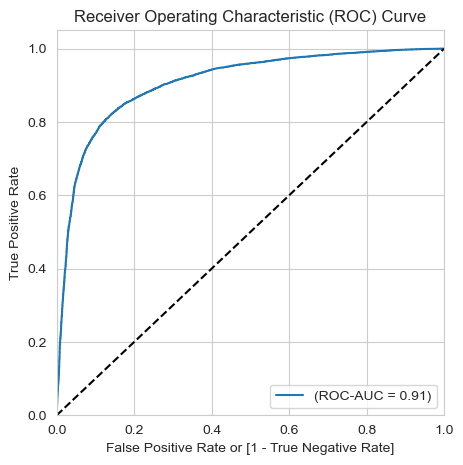

In [148]:
draw_roc(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)

In [149]:
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_res_pred_final[i]= y_res_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.019932,0,0,1,0,0,0,0,0,0,0,0,0
1,0,0.005608,1,0,1,0,0,0,0,0,0,0,0,0
2,0,0.016290,2,0,1,0,0,0,0,0,0,0,0,0
3,1,0.811007,3,1,1,1,1,1,1,1,1,1,1,0
4,0,0.011399,4,0,1,0,0,0,0,0,0,0,0,0


In [150]:
cutoff_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)


     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.695612  0.971280  0.419943
0.2   0.2  0.757336  0.949831  0.564840
0.3   0.3  0.794547  0.921735  0.667359
0.4   0.4  0.819501  0.889224  0.749779
0.5   0.5  0.836043  0.853908  0.818177
0.6   0.6  0.839964  0.807271  0.872656
0.7   0.7  0.827785  0.737834  0.917736
0.8   0.8  0.793612  0.636198  0.951026
0.9   0.9  0.624383  0.261439  0.987328


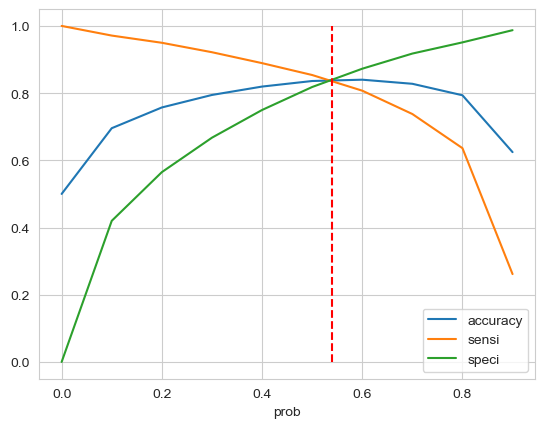

In [151]:
%matplotlib inline
sns.set_style('whitegrid')
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.54, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

In [152]:
y_res_pred_final['final_predicted'] = y_res_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.54 else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.019932,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.005608,1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.016290,2,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.811007,3,1,1,1,1,1,1,1,1,1,1,0,1
4,0,0.011399,4,0,1,0,0,0,0,0,0,0,0,0,0


In [153]:
confusion_train_opt = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final.final_predicted)
print_model_metrics(y_res_pred_final.Churn, y_res_pred_final.final_predicted,'Logistic Regression (without) PCA)')

Model: Logistic Regression (without) PCA)
Accuracy: 0.8390
Precision: 0.8406
Recall: 0.8365
F1 Score: 0.8386
ROC AUC: 0.8390
Confusion Matrix:
[[16201  3054]
 [ 3148 16107]]




In [156]:
# Define the printbold function first
def printbold(text):
    """Function to print text in bold formatting"""
    print('\033[1m' + text + '\033[0m')

# Define the missing function other_metrics_logistic_model
def other_metrics_logistic_model(confusion_matrix):
    """Function to calculate various metrics from confusion matrix"""
    # Extract values from confusion matrix
    tn, fp, fn, tp = confusion_matrix.ravel()
    
    # Calculate metrics
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    precision = tp / (tp + fp)
    npv = tn / (tn + fn)
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    
    # Return formatted string with metrics
    return f"Sensitivity/Recall: {sensitivity:.4f}\nSpecificity: {specificity:.4f}\nPrecision: {precision:.4f}\nNegative Predictive Value: {npv:.4f}\nF1 Score: {f1:.4f}"

# Now use the functions
printbold('**Evaluation Metrics: Train Set (Optimal Cut-off)**')
print("******************************************************************")
print('Accuracy of Train Set: (Logistic Regression Model without PCA):')
print(metrics.accuracy_score(y_res_pred_final.Churn, y_res_pred_final.final_predicted))
print("******************************************************************")

print(classification_report(y_res_pred_final.Churn, y_res_pred_final.final_predicted, target_names=['Not Churned','Churned']))
print("******************************************************************")

print(other_metrics_logistic_model(confusion_train_opt))
print("******************************************************************")
print('ROC of Train Set: (Logistic Regression Model without PCA):')
print("{:2.3}".format(metrics.roc_auc_score(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)))

**Evaluation Metrics: Train Set (Optimal Cut-off)**
******************************************************************
Accuracy of Train Set: (Logistic Regression Model without PCA):
0.8389509218384835
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.84      0.84      0.84     19255
     Churned       0.84      0.84      0.84     19255

    accuracy                           0.84     38510
   macro avg       0.84      0.84      0.84     38510
weighted avg       0.84      0.84      0.84     38510

******************************************************************
Sensitivity/Recall: 0.8365
Specificity: 0.8414
Precision: 0.8406
Negative Predictive Value: 0.8373
F1 Score: 0.8386
******************************************************************
ROC of Train Set: (Logistic Regression Model without PCA):
0.908


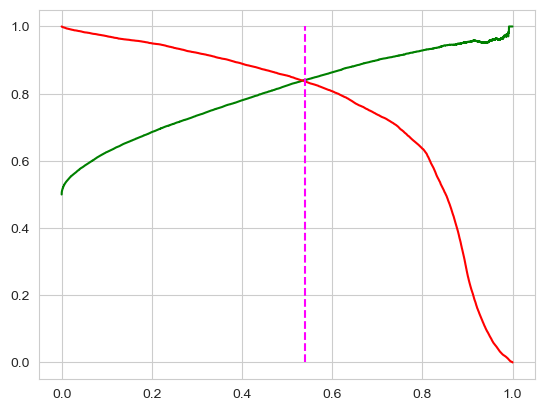

In [157]:
from sklearn.metrics import precision_recall_curve
sns.set_style('whitegrid')

p, r, thresholds = precision_recall_curve(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)

plt.plot(thresholds, p[:-1], "g-")    ##Precision: Green-Line
plt.plot(thresholds, r[:-1], "r-")   ##Recall: Red-Line
plt.vlines(x=0.54, ymax=1, ymin=0, colors='magenta', linestyles="--")
plt.show()

In [158]:
##Making predictions on test data

X_res_new1 = X_res_rfe
X_res_new1.drop('const', axis=1, inplace=True)

#Assigning similar columns to test data as that of train set
X_test = X_test[X_res_new1.columns]
X_test.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,og_others_8,loc_ic_t2t_mou_8,loc_ic_t2m_mou_8,...,total_rech_data_8,max_rech_data_8,vol_2g_mb_8,sachet_3g_8,vbc_3g_8,arpu_avg_6_7,std_ic_t2t_mou_avg_6_7,ic_others_avg_6_7,vol_2g_mb_avg_6_7,monthly_2g_avg_6_7
73764,0.172121,-0.225830,-0.250297,0.741020,-0.058477,-0.559060,-0.339057,-0.053536,0.106787,-0.522713,...,-0.562242,-0.668558,-0.361404,-0.202604,0.201901,0.027136,4.388770,3.861516,-0.344890,-0.46191
18280,2.749429,-0.179162,3.347565,-0.211540,0.397673,7.446657,-0.035202,-0.053536,0.862481,1.277520,...,0.141442,1.665086,0.355342,-0.202604,1.786960,1.728187,-0.081047,-0.154945,-0.277061,-0.46191
43793,-0.843957,-0.528235,-0.699078,-0.066625,-0.391731,-0.666810,-0.339057,-0.053536,-0.426592,-0.707681,...,0.493285,-0.437046,0.672726,-0.202604,-0.416668,-0.895796,-0.195302,-0.168071,2.745742,-0.46191
69530,-0.951918,-0.530907,-0.723116,-0.211540,-0.391731,-0.662043,-0.339057,-0.053536,-0.380385,-0.487564,...,1.196969,-0.437046,1.227802,-0.202604,-0.416668,-1.046963,-0.260711,-0.168071,-0.252305,-0.46191
71555,1.021208,-0.149068,-0.128780,0.442698,0.317847,0.357989,-0.333145,-0.053536,1.100983,-0.032978,...,0.493285,0.238970,0.580087,0.839825,1.046187,0.087334,-0.236241,-0.168071,0.663999,-0.46191


In [159]:
##Adding the constant to X_test (as res model is based on statsmodels)
X_test_sm = sm.add_constant(X_test)
y_test_pred = res.predict(X_test_sm)

In [160]:
y_test_pred = res.predict(X_test_sm)
y_test_pred[:10]

73764    0.505993
18280    0.000131
43793    0.600922
69530    0.210832
71555    0.063726
62740    0.181876
27580    0.307167
67019    0.142776
22171    0.079102
75445    0.041117
dtype: float64

In [161]:
y_test_pred = y_test_pred.values.reshape(-1)
y_test_pred[:10]

array([5.05993268e-01, 1.30741384e-04, 6.00922321e-01, 2.10831766e-01,
       6.37262920e-02, 1.81875542e-01, 3.07167455e-01, 1.42775893e-01,
       7.91023310e-02, 4.11168024e-02])

In [162]:
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['CustID'] = y_test.index    ##CustID is the record index ID
y_test_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.505993,73764
1,0,0.000131,18280
2,0,0.600922,43793
3,0,0.210832,69530
4,0,0.063726,71555


In [163]:
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.54 else 0)  ##optimal cut-off is 0.54
y_test_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.505993,73764,0
1,0,0.000131,18280,0
2,0,0.600922,43793,1
3,0,0.210832,69530,0
4,0,0.063726,71555,0


In [164]:
##Confusion Matrix (optimal test set) 
confusion_test_opt = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.predicted)
print_model_metrics(y_test_pred_final.Churn, y_test_pred_final.predicted,'Logistic Regression (without) PCA)')

Model: Logistic Regression (without) PCA)
Accuracy: 0.8440
Precision: 0.3194
Recall: 0.7954
F1 Score: 0.4557
ROC AUC: 0.8219
Confusion Matrix:
[[6997 1251]
 [ 151  587]]




In [165]:
printbold('**Evaluation Metrics: Test Set (Optimal Cut-off)**')
print("******************************************************************")
print("Accuracy of Test Set: (Logistic Regression Model without PCA):")
print(metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.predicted))
print("******************************************************************")

from sklearn.metrics import classification_report
print(classification_report(y_test_pred_final.Churn, y_test_pred_final.predicted, target_names=['Not Churned','Churned']))  # target_names=target_names
print("******************************************************************")

print(other_metrics_logistic_model(confusion_test_opt))
print("******************************************************************")
print('ROC of Test Set: (Logistic Regression Model without PCA):')
print("{:2.3}".format(metrics.roc_auc_score(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob)))

**Evaluation Metrics: Test Set (Optimal Cut-off)**
******************************************************************
Accuracy of Test Set: (Logistic Regression Model without PCA):
0.8439795237035388
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.98      0.85      0.91      8248
     Churned       0.32      0.80      0.46       738

    accuracy                           0.84      8986
   macro avg       0.65      0.82      0.68      8986
weighted avg       0.92      0.84      0.87      8986

******************************************************************
Sensitivity/Recall: 0.7954
Specificity: 0.8483
Precision: 0.3194
Negative Predictive Value: 0.9789
F1 Score: 0.4557
******************************************************************
ROC of Test Set: (Logistic Regression Model without PCA):
0.894


In [166]:
##Coefficients of features
rfe_coef_list = np.array(rfe.estimator_.coef_.round(4).tolist()[0]) 

rfe_df = pd.DataFrame({'Features':X_res_rfe.columns, 'Coefficients':rfe_coef_list, \
                         'Abs_Coefficients (Desc_Sort)':abs(rfe_coef_list)})

##Sorting coefficient in descending order of absolute coefficient values and reset index to 'Features'
rfe_df = rfe_df.sort_values(by='Abs_Coefficients (Desc_Sort)', ascending=False)
rfe_df["Rank (Feature Importance Based)"] = rfe_df["Abs_Coefficients (Desc_Sort)"].rank(ascending=False)
rfe_df.drop('Abs_Coefficients (Desc_Sort)', axis=1, inplace=True)
rfe_df.set_index('Features', inplace= True)
rfe_df

,Coefficients,Rank (Feature Importance Based)
Features,,
loc_ic_t2m_mou_8,-1.1155,1.0
arpu_avg_6_7,0.7202,2.0
total_rech_data_8,-0.6138,3.0
total_rech_num_8,-0.5931,4.0
spl_ic_mou_8,-0.5717,5.0
last_day_rech_amt_8,-0.5390,6.0
std_ic_t2t_mou_8,-0.5101,7.0
loc_ic_t2f_mou_8,-0.4743,8.0
loc_ic_t2t_mou_8,-0.4307,9.0


In [167]:
##Getting Top15 features
top15_df= rfe_df[:15]
top15_df

printbold("**Top 15 features in the model based on their importance are as follows:**")
print('*'*70)
print(top15_df)

**Top 15 features in the model based on their importance are as follows:**
**********************************************************************
                     Coefficients  Rank (Feature Importance Based)
Features                                                          
loc_ic_t2m_mou_8          -1.1155                              1.0
arpu_avg_6_7               0.7202                              2.0
total_rech_data_8         -0.6138                              3.0
total_rech_num_8          -0.5931                              4.0
spl_ic_mou_8              -0.5717                              5.0
last_day_rech_amt_8       -0.5390                              6.0
std_ic_t2t_mou_8          -0.5101                              7.0
loc_ic_t2f_mou_8          -0.4743                              8.0
loc_ic_t2t_mou_8          -0.4307                              9.0
vol_2g_mb_8               -0.4291                             10.0
loc_og_t2m_mou_8          -0.4100                 

In [168]:
telecom_hv = df1.copy()

In [169]:
telecom_hv.shape

(29953, 84)

In [170]:
def binary_val_cols(df):
    df_1 = df.copy()
    dualsvcol = (df_1.nunique()==2)
    list_dualsvcol = list(dualsvcol[dualsvcol.values==True].index)
    return list_dualsvcol

binary_cols = binary_val_cols(df= telecom_hv)
print(binary_cols)

['churn', 'tenure_1_2_year', 'tenure_2_3_year', 'tenure_3_5_year', 'tenure_5_12_year']


In [171]:
telecom_hv.drop('mobile_number', axis=1, inplace= True)

In [172]:
from sklearn.model_selection import train_test_split
np.random.seed(0)
df_train, df_test = train_test_split(telecom_hv, train_size=0.7, test_size = 0.3, random_state=42)


In [173]:
df_binary_train = df_train.loc[:, binary_cols]
df_binary_test = df_test.loc[:, binary_cols]

##Dropping binary dummy variables and we shall concat them later to preserve the scale
df_train = df_train.drop(binary_cols, axis=1)
df_test = df_test.drop(binary_cols, axis=1)

##StandardScaler
from sklearn.preprocessing import StandardScaler
all_cols = df_train.columns
scaler = StandardScaler()

#scaler fit_transform on train data
df_train[all_cols] = scaler.fit_transform(df_train[all_cols])
#concat dummies:Train set
df_train = pd.concat([df_train, df_binary_train], axis=1)

#scaler transform on test data
df_test[all_cols] = scaler.transform(df_test[all_cols])
#concat dummies: Test set
df_test = pd.concat([df_test, df_binary_test], axis=1)

In [174]:
print(df_train.shape)
print(df_test.shape)

(20967, 83)
(8986, 83)


In [175]:
df_train.head()

,arpu_8,onnet_mou_8,offnet_mou_8,roam_ic_mou_8,roam_og_mou_8,loc_og_t2t_mou_8,loc_og_t2m_mou_8,loc_og_t2f_mou_8,loc_og_t2c_mou_8,std_og_t2t_mou_8,...,sachet_2g_avg_6_7,monthly_3g_avg_6_7,sachet_3g_avg_6_7,vbc_3g_avg_6_7,total_rech_data_amt_avg_6_7,churn,tenure_1_2_year,tenure_2_3_year,tenure_3_5_year,tenure_5_12_year
49069,-0.964812,-0.530047,-0.681501,-0.198916,-0.21154,-0.389796,-0.581484,-0.318366,-0.291535,-0.384920,...,1.854891,-0.400701,-0.25211,-0.440274,-0.081574,0,True,False,False,False
90375,2.763271,7.552357,-0.400812,-0.198916,-0.21154,-0.283090,-0.599979,-0.324278,-0.291535,8.796887,...,-0.479482,-0.400701,-0.25211,-0.440274,-0.442978,0,False,True,False,False
80131,-0.066603,-0.530907,-0.442601,-0.198916,-0.21154,-0.391731,-0.138607,-0.339057,-0.291535,-0.384920,...,-0.267266,-0.400701,-0.25211,-0.440274,-0.431570,0,True,False,False,False
36950,-1.208095,-0.530907,-0.725466,-0.198916,-0.21154,-0.391731,-0.666810,-0.339057,-0.291535,-0.384920,...,-0.479482,-0.400701,-0.25211,-0.440274,-0.352627,1,False,False,False,True
22699,0.562930,-0.470947,3.121238,-0.198916,-0.21154,-0.256922,7.095243,-0.265162,-0.259171,-0.384920,...,-0.479482,-0.400701,-0.25211,-0.440274,-0.442978,0,False,False,True,False


In [176]:
y_train = df_train['churn']
y_test = df_test['churn']

##Storing all feature variables to X_train and X_test
X_train = df_train.drop('churn',axis=1)
X_test = df_test.drop('churn',axis=1)

In [177]:
y= telecom_hv['churn']
print("Before OverSampling, counts of label '1'(train_set): {}".format(sum(y_train==1)))
print("Before OverSampling, counts of label '0'(train_set): {} \n".format(sum(y_train==0)))
print("Before OverSampling, churn event rate (Entire Dataset): {}% \n".format(round(sum(y==1)/len(y)*100,3)))


Before OverSampling, counts of label '1'(train_set): 1695
Before OverSampling, counts of label '0'(train_set): 19272 

Before OverSampling, churn event rate (Entire Dataset): 8.123% 



In [178]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression() 
  
# train the model on train set 
lr.fit(X_train, y_train.ravel()) 
predictions_train = lr.predict(X_train)
classification_report_base_mod_train = classification_report(y_train, predictions_train, target_names=['Not Churned','Churned'])
print("For Train Set (Class Imbalance Dataset):\n", classification_report_base_mod_train) 
  
# predictions and print classification report  for test data
predictions = lr.predict(X_test) 
classification_report_base_mod_test =classification_report(y_test, predictions, target_names=['Not Churned','Churned'])
print("For Test Set (Class Imbalance Dataset):\n", classification_report_base_mod_test)

C:\Users\USER\AppData\Local\Temp\ipykernel_9808\687111045.py:6: FutureWarning: Series.ravel is deprecated. The underlying array is already 1D, so ravel is not necessary.  Use `to_numpy()` for conversion to a numpy array instead.
  lr.fit(X_train, y_train.ravel())


For Train Set (Class Imbalance Dataset):
               precision    recall  f1-score   support

 Not Churned       0.94      0.99      0.96     19272
     Churned       0.68      0.27      0.39      1695

    accuracy                           0.93     20967
   macro avg       0.81      0.63      0.68     20967
weighted avg       0.92      0.93      0.92     20967

For Test Set (Class Imbalance Dataset):
               precision    recall  f1-score   support

 Not Churned       0.94      0.99      0.96      8248
     Churned       0.73      0.29      0.41       738

    accuracy                           0.93      8986
   macro avg       0.83      0.64      0.69      8986
weighted avg       0.92      0.93      0.92      8986



In [181]:
from imblearn.combine import SMOTETomek
smote_tomek = SMOTETomek(random_state=42)
# Changed fit_sample to fit_resample as the method name has been updated in newer versions
X_res, y_res = smote_tomek.fit_resample(X_train, y_train)

##Storing the balanced class X_res and y_res values for future models with pca
X_res_pca_smote_tomek = X_res.copy()
y_res_pca_smote_tomek = y_res.copy()

print('After OverSampling, the shape of train_X: {}'.format(X_res.shape))
print('After OverSampling, the shape of train_y: {} \n'.format(y_res.shape))

print("After OverSampling, counts of label '1': {}".format(sum(y_res==1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_res==0)))
print("After OverSampling, churn event rate : {}% \n".format(round(sum(y_res==1)/len(y_res)*100,2)))

After OverSampling, the shape of train_X: (38522, 82)
After OverSampling, the shape of train_y: (38522,) 

After OverSampling, counts of label '1': 19261
After OverSampling, counts of label '0': 19261
After OverSampling, churn event rate : 50.0% 



In [182]:
from sklearn.decomposition import PCA
pca = PCA(random_state=42)
pca.fit(X_res)

,n_components,None
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,42


In [183]:
pca.components_

array([[ 3.00383477e-01,  9.92329139e-02,  1.63464864e-01, ...,
        -8.93102693e-03,  5.99279611e-03,  2.98438212e-02],
       [-9.09961963e-02, -1.31727698e-01, -1.41938581e-01, ...,
        -1.24157915e-02, -6.89764620e-03,  2.65735405e-03],
       [-8.03163427e-02, -1.29710212e-01, -9.45254729e-02, ...,
         2.72206058e-03,  2.55047526e-03,  2.65464570e-02],
       ...,
       [ 1.13483445e-02, -3.12205627e-01,  3.55631548e-01, ...,
        -3.12774159e-03, -1.54407140e-03, -2.53532282e-03],
       [-2.08713841e-03,  1.06607895e-02, -1.56598130e-02, ...,
         3.25403552e-06, -1.24650360e-03,  3.97349089e-04],
       [-3.28155045e-03, -2.64901373e-01, -3.13602580e-01, ...,
        -6.89068880e-07, -4.34924532e-04, -1.65477674e-03]],
      shape=(82, 82))

In [184]:
pca.explained_variance_ratio_

array([1.05407708e-01, 1.03904975e-01, 6.44942606e-02, 5.82551619e-02,
       4.63033463e-02, 4.22839506e-02, 3.39318191e-02, 2.91029364e-02,
       2.84891841e-02, 2.63113446e-02, 2.37050356e-02, 2.12725074e-02,
       1.96258917e-02, 1.91441547e-02, 1.80016462e-02, 1.69620173e-02,
       1.62167552e-02, 1.58136807e-02, 1.56427403e-02, 1.50881268e-02,
       1.43579685e-02, 1.34022342e-02, 1.21849529e-02, 1.12298637e-02,
       1.08856688e-02, 1.06369765e-02, 1.03857716e-02, 1.00241282e-02,
       9.54162858e-03, 9.39921888e-03, 8.86085841e-03, 8.81811099e-03,
       7.94729070e-03, 7.85467839e-03, 7.53017883e-03, 7.22446513e-03,
       6.81054601e-03, 6.64639904e-03, 5.97124284e-03, 5.73653049e-03,
       5.44953531e-03, 5.08858296e-03, 4.96351062e-03, 4.93110022e-03,
       4.56909200e-03, 4.35151959e-03, 4.11180439e-03, 3.84307256e-03,
       3.66856291e-03, 3.51690954e-03, 3.41430134e-03, 3.21816066e-03,
       3.13592614e-03, 2.97986634e-03, 2.80137194e-03, 2.73046854e-03,
      

In [185]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)

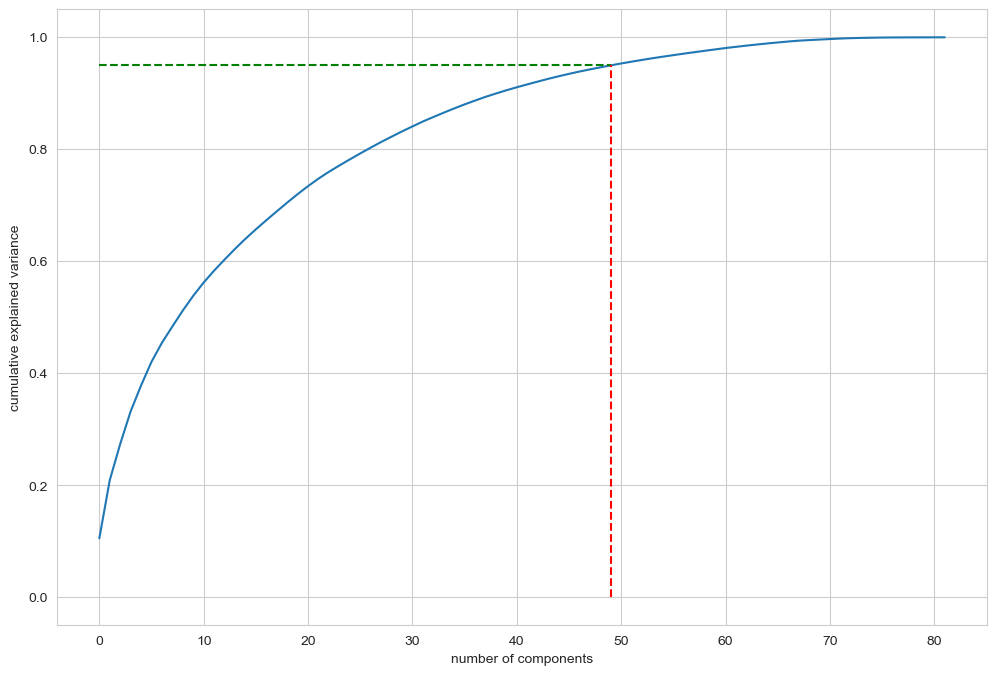

In [186]:
%matplotlib inline
sns.set_style('whitegrid')
fig = plt.figure(figsize = (12,8))
plt.plot(var_cumu)
plt.hlines(y=0.95, xmax=49, xmin=0, colors="g", linestyles="--")
plt.vlines(x=49, ymax=0.95, ymin=0, colors="r", linestyles="--")  ##Optimal number of features-> 49, explains 95% variance
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()


In [187]:
from sklearn.decomposition import IncrementalPCA
from sklearn import metrics
pca_final = IncrementalPCA(n_components=49)  ##Incremental PCA using 49 components
df_train_pca = pca_final.fit_transform(X_res)

In [188]:
df_train_pca.shape

(38522, 49)

<Axes: >

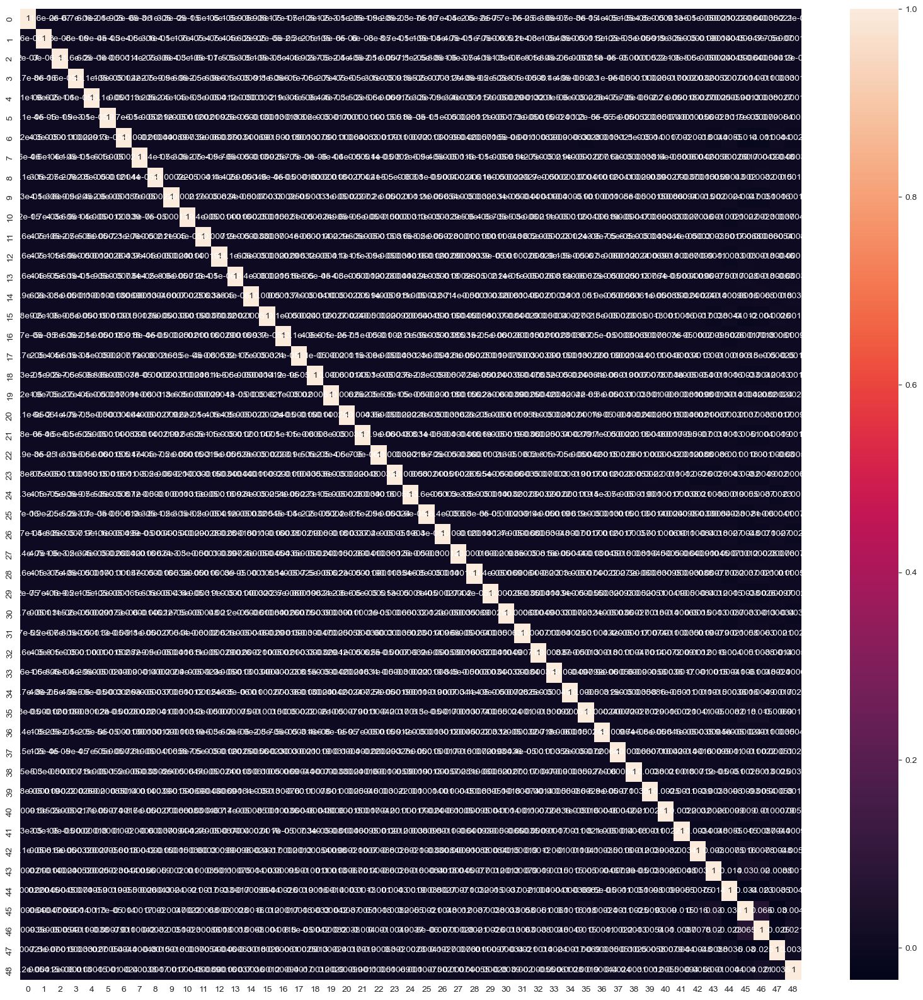

In [189]:
corrmat = np.corrcoef(df_train_pca.transpose())  ##Correlation matrix
plt.figure(figsize=[20,20])
sns.heatmap(corrmat, annot=True)

In [190]:
df_test_pca = pca_final.transform(X_test)  #transform test set
df_test_pca.shape

(8986, 49)

In [191]:
X_train_pca = df_train_pca
y_train_pca = y_res
X_test_pca = df_test_pca
y_test_pca = y_test

In [192]:
from sklearn.linear_model import LogisticRegression
learner_pca = LogisticRegression()   ##No hyperparameter tuning and class is balanced using SMOTE
model_pca = learner_pca.fit(df_train_pca, y_res)

In [193]:
pred_probs_train = model_pca.predict_proba(df_train_pca)

In [194]:
y_res_pred= pred_probs_train[:,1]   ##Getting churn probability values(1)
y_res_pred

array([0.01585347, 0.01047932, 0.07625801, ..., 0.95090102, 0.94417026,
       0.51755815], shape=(38522,))

In [195]:
y_res_pred_final = pd.DataFrame({'Churn':y_res.values, 'Churn_Prob':y_res_pred})
y_res_pred_final['CustID'] = y_res.index    ##CustID is the record index ID
y_res_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.015853,0
1,0,0.010479,1
2,0,0.076258,2
3,1,0.737657,3
4,0,0.002447,4


In [196]:
y_res_pred_final['predicted'] = y_res_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.015853,0,0
1,0,0.010479,1,0
2,0,0.076258,2,0
3,1,0.737657,3,1
4,0,0.002447,4,0


In [197]:
confusion = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final.predicted)
print_model_metrics(y_res_pred_final.Churn, y_res_pred_final.predicted,'Logistic Regression (with PCA)')

Model: Logistic Regression (with PCA)
Accuracy: 0.8442
Precision: 0.8299
Recall: 0.8659
F1 Score: 0.8475
ROC AUC: 0.8442
Confusion Matrix:
[[15842  3419]
 [ 2583 16678]]




In [198]:
print(metrics.accuracy_score(y_res_pred_final.Churn, y_res_pred_final.predicted))

0.8441929287160583


In [199]:
def draw_roc(actual, probs):
    fpr, tpr, thresholds = metrics.roc_curve(actual, probs, drop_intermediate = False )
    auc_score = metrics.roc_auc_score(actual, probs)
    plt.figure(figsize=(5, 5))
    plt.plot( fpr, tpr, label='(ROC_AUC = %0.2f)' % auc_score )
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate or [1 - True Negative Rate]')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

    return None

In [200]:
fpr, tpr, thresholds = metrics.roc_curve( y_res_pred_final.Churn, y_res_pred_final.Churn_Prob, drop_intermediate = False )

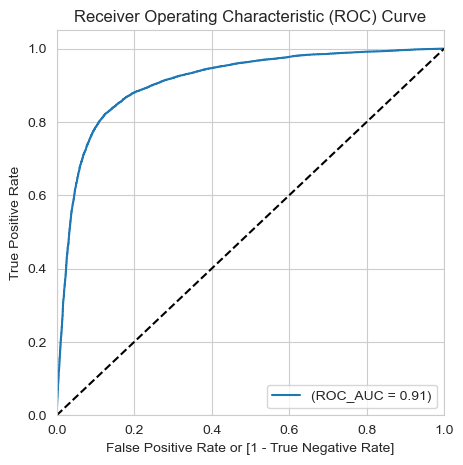

In [201]:
draw_roc(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)

In [202]:
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_res_pred_final[i]= y_res_pred_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.015853,0,0,1,0,0,0,0,0,0,0,0,0
1,0,0.010479,1,0,1,0,0,0,0,0,0,0,0,0
2,0,0.076258,2,0,1,0,0,0,0,0,0,0,0,0
3,1,0.737657,3,1,1,1,1,1,1,1,1,1,0,0
4,0,0.002447,4,0,1,0,0,0,0,0,0,0,0,0


In [203]:
cutoff_df = pd.DataFrame(columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoff_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoff_df)

     prob  accuracy     sensi     speci
0.0   0.0  0.500000  1.000000  0.000000
0.1   0.1  0.707180  0.971808  0.442552
0.2   0.2  0.767276  0.950210  0.584341
0.3   0.3  0.803723  0.926847  0.680598
0.4   0.4  0.828306  0.897928  0.758683
0.5   0.5  0.844193  0.865895  0.822491
0.6   0.6  0.848191  0.821089  0.875292
0.7   0.7  0.833887  0.752557  0.915217
0.8   0.8  0.785447  0.618971  0.951924
0.9   0.9  0.644515  0.305799  0.983230


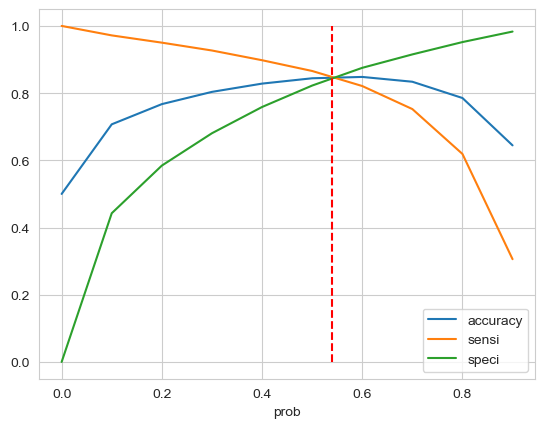

In [204]:
%matplotlib inline
cutoff_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.54, ymax=1, ymin=0, colors="r", linestyles="--")
plt.show()

In [205]:
y_res_pred_final['final_predicted'] = y_res_pred_final.Churn_Prob.map( lambda x: 1 if x > 0.54 else 0)
y_res_pred_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.015853,0,0,1,0,0,0,0,0,0,0,0,0,0
1,0,0.010479,1,0,1,0,0,0,0,0,0,0,0,0,0
2,0,0.076258,2,0,1,0,0,0,0,0,0,0,0,0,0
3,1,0.737657,3,1,1,1,1,1,1,1,1,1,0,0,1
4,0,0.002447,4,0,1,0,0,0,0,0,0,0,0,0,0


In [206]:
confusion_train_opt = metrics.confusion_matrix(y_res_pred_final.Churn, y_res_pred_final.final_predicted)
print_model_metrics(y_res_pred_final.Churn, y_res_pred_final.final_predicted,'Logistic Regression (with PCA)')

Model: Logistic Regression (with PCA)
Accuracy: 0.8461
Precision: 0.8448
Recall: 0.8481
F1 Score: 0.8464
ROC AUC: 0.8461
Confusion Matrix:
[[16259  3002]
 [ 2925 16336]]




In [207]:
printbold('**Evaluation Metrics: Train Set (Optimal Cut-off)---[using PCA for feature selection]**')
print("******************************************************************")
print('Accuracy of Train Set: (Logistic Regression Model with PCA):')
print(metrics.accuracy_score(y_res_pred_final.Churn, y_res_pred_final.final_predicted))
print("******************************************************************")

from sklearn.metrics import classification_report
print(classification_report(y_res_pred_final.Churn, y_res_pred_final.final_predicted, target_names=['Not Churned','Churned']))
print("******************************************************************")

print(other_metrics_logistic_model(confusion_train_opt))
print("******************************************************************")
print('ROC of Train Set: (Logistic Regression Model with PCA):')
print("{:2.3}".format(metrics.roc_auc_score(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)))

**Evaluation Metrics: Train Set (Optimal Cut-off)---[using PCA for feature selection]**
******************************************************************
Accuracy of Train Set: (Logistic Regression Model with PCA):
0.8461398681273039
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.85      0.84      0.85     19261
     Churned       0.84      0.85      0.85     19261

    accuracy                           0.85     38522
   macro avg       0.85      0.85      0.85     38522
weighted avg       0.85      0.85      0.85     38522

******************************************************************
Sensitivity/Recall: 0.8481
Specificity: 0.8441
Precision: 0.8448
Negative Predictive Value: 0.8475
F1 Score: 0.8464
******************************************************************
ROC of Train Set: (Logistic Regression Model with PCA):
0.912


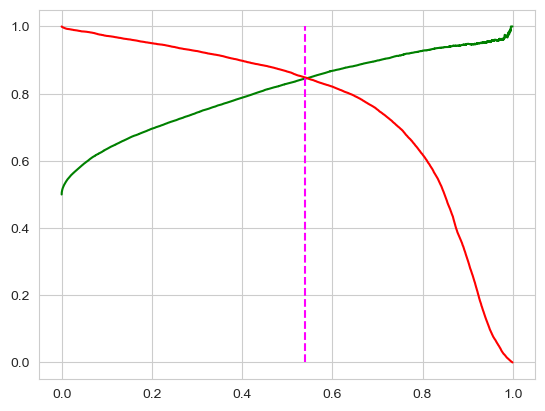

In [208]:
from sklearn.metrics import precision_recall_curve

p, r, thresholds = precision_recall_curve(y_res_pred_final.Churn, y_res_pred_final.Churn_Prob)

plt.plot(thresholds, p[:-1], "g-")  ##Precision: green-line
plt.plot(thresholds, r[:-1], "r-")  ##Recall: red-line
plt.vlines(x=0.54, ymax=1, ymin=0, colors='magenta', linestyles="--")
plt.show()

In [209]:
pred_probs_test = model_pca.predict_proba(df_test_pca)

In [210]:
y_test_pred= pred_probs_test[:,1]   ##Getting churn probability values(1)
y_test_pred

array([4.06842975e-01, 3.35377511e-05, 5.09857608e-01, ...,
       1.63883502e-01, 2.33761787e-02, 2.78441332e-01], shape=(8986,))

In [211]:
y_test_pred_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_pred})
y_test_pred_final['CustID'] = y_test.index    ##CustID is the record index ID
y_test_pred_final.head()

,Churn,Churn_Prob,CustID
0,0,0.406843,73764
1,0,0.000034,18280
2,0,0.509858,43793
3,0,0.171900,69530
4,0,0.026904,71555


In [212]:
y_test_pred_final['predicted'] = y_test_pred_final.Churn_Prob.map(lambda x: 1 if x > 0.54 else 0)  ##optimal cut-off is 0.54
y_test_pred_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.406843,73764,0
1,0,0.000034,18280,0
2,0,0.509858,43793,0
3,0,0.171900,69530,0
4,0,0.026904,71555,0


In [213]:
confusion_test_opt = metrics.confusion_matrix(y_test_pred_final.Churn, y_test_pred_final.predicted)
print_model_metrics(y_test_pred_final.Churn, y_test_pred_final.predicted, 'Logistic Regression (with PCA)')

Model: Logistic Regression (with PCA)
Accuracy: 0.8418
Precision: 0.3157
Recall: 0.7940
F1 Score: 0.4518
ROC AUC: 0.8200
Confusion Matrix:
[[6978 1270]
 [ 152  586]]




In [214]:
printbold('**Evaluation Metrics: Test Set (Optimal Cut-off)---[using PCA for Feature Selection]**')
print("******************************************************************")
print('Accuracy of Test Set: (Logistic Regression Model with PCA):')
accuracy_score_pca_no_hyp = metrics.accuracy_score(y_test_pred_final.Churn, y_test_pred_final.predicted)
print(accuracy_score_pca_no_hyp)
print("******************************************************************")

from sklearn.metrics import classification_report
class_rep_pc_no_hyp = classification_report(y_test_pred_final.Churn, y_test_pred_final.predicted,\
                                         target_names=['Not Churned','Churned'])
print(class_rep_pc_no_hyp)  # target_names=target_names
print("******************************************************************")

confusion_test_opt_pca_no_hyp = confusion_test_opt
print(other_metrics_logistic_model(confusion_test_opt_pca_no_hyp))
print("******************************************************************")
print('ROC of Test Set: (Logistic Regression Model with PCA):')
auc_roc_pca_no_hyp = metrics.roc_auc_score(y_test_pred_final.Churn, y_test_pred_final.Churn_Prob)
print("{:2.3}".format(auc_roc_pca_no_hyp))

**Evaluation Metrics: Test Set (Optimal Cut-off)---[using PCA for Feature Selection]**
******************************************************************
Accuracy of Test Set: (Logistic Regression Model with PCA):
0.8417538393055864
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.98      0.85      0.91      8248
     Churned       0.32      0.79      0.45       738

    accuracy                           0.84      8986
   macro avg       0.65      0.82      0.68      8986
weighted avg       0.92      0.84      0.87      8986

******************************************************************
Sensitivity/Recall: 0.7940
Specificity: 0.8460
Precision: 0.3157
Negative Predictive Value: 0.9787
F1 Score: 0.4518
******************************************************************
ROC of Test Set: (Logistic Regression Model with PCA):
0.895


In [10]:
import numpy as np
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# First, ensure X and y have the same number of samples
# This is a critical step - you need to make sure df_train_pca and y_res have the same length
# Option 1: If you're using resampling techniques (like SMOTE), apply them correctly
# Option 2: If one dataset has more samples, align them

# Assuming you have df_train_pca and y_res already defined but with different lengths
# Here's how you might align them (choose the appropriate method for your case):

# Method 1: Use only the common indices
common_indices = min(len(df_train_pca), len(y_res))
df_train_pca_aligned = df_train_pca[:common_indices]
y_res_aligned = y_res[:common_indices]

# Method 2: If y_res was created from df_train_pca but got modified:
# Recreate y_res from the same source as df_train_pca

# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear', 'sag']
penalty = ['l2']
c_values = np.logspace(-3, 3, 10)   # Lambda = 1/c_values (Here, c_values range from 0.001 to 1000)

# define grid search
grid = dict(solver=solvers, penalty=penalty, C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1_macro', error_score=0)

# Use the aligned datasets
grid_result = grid_search.fit(X=df_train_pca_aligned, y=y_res_aligned)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.549654 using {'C': np.float64(2.154434690031882), 'penalty': 'l2', 'solver': 'newton-cg'}
0.428681 (0.174669) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'newton-cg'}
0.428681 (0.174669) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'lbfgs'}
0.498694 (0.162487) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'liblinear'}
0.427860 (0.148412) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'sag'}
0.431670 (0.170934) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'newton-cg'}
0.432199 (0.167962) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'lbfgs'}
0.498694 (0.162487) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'liblinear'}
0.436167 (0.170898) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'sag'}
0.500015 (0.155888) with: {'C': np.float64(0.021544346900318832), 'penalty': 'l2', 'solver': 'newton-cg'}
0.494512 (0.163291) with: {'

In [12]:
import numpy as np
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# First, ensure X and y have the same number of samples
# This is a critical step - you need to make sure df_train_pca and y_res have the same length
# Option 1: If you're using resampling techniques (like SMOTE), apply them correctly
# Option 2: If one dataset has more samples, align them

# Assuming you have df_train_pca and y_res already defined but with different lengths
# Here's how you might align them (choose the appropriate method for your case):

# Method 1: Use only the common indices
common_indices = min(len(df_train_pca), len(y_res))
df_train_pca_aligned = df_train_pca[:common_indices]
y_res_aligned = y_res[:common_indices]

# Method 2: If y_res was created from df_train_pca but got modified:
# Recreate y_res from the same source as df_train_pca

# define models and parameters
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear', 'sag']
penalty = ['l2']
c_values = np.logspace(-3, 3, 10)   # Lambda = 1/c_values (Here, c_values range from 0.001 to 1000)

# define grid search
grid = dict(solver=solvers, penalty=penalty, C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=42)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='f1_macro', error_score=0)

# Use the aligned datasets
grid_result = grid_search.fit(X=df_train_pca_aligned, y=y_res_aligned)

# summarize results
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

Best: 0.549654 using {'C': np.float64(2.154434690031882), 'penalty': 'l2', 'solver': 'newton-cg'}
0.428681 (0.174669) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'newton-cg'}
0.428681 (0.174669) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'lbfgs'}
0.498694 (0.162487) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'liblinear'}
0.427702 (0.167893) with: {'C': np.float64(0.001), 'penalty': 'l2', 'solver': 'sag'}
0.431670 (0.170934) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'newton-cg'}
0.432199 (0.167962) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'lbfgs'}
0.498694 (0.162487) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'liblinear'}
0.437834 (0.155989) with: {'C': np.float64(0.004641588833612777), 'penalty': 'l2', 'solver': 'sag'}
0.500015 (0.155888) with: {'C': np.float64(0.021544346900318832), 'penalty': 'l2', 'solver': 'newton-cg'}
0.494512 (0.163291) with: {'

In [13]:
import numpy as np
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, roc_auc_score, accuracy_score, confusion_matrix
from sklearn import metrics
from imblearn.combine import SMOTETomek

# Define helper functions
def printbold(text):
    print('\033[1m' + text + '\033[0m')

def other_metrics_logistic_model(confusion_matrix):
    tn, fp, fn, tp = confusion_matrix.ravel()
    sensitivity = tp / (tp + fn)
    specificity = tn / (tn + fp)
    precision = tp / (tp + fp)
    f1 = 2 * (precision * sensitivity) / (precision + sensitivity)
    
    return pd.DataFrame({
        'Metric': ['Sensitivity', 'Specificity', 'Precision', 'F1 Score'],
        'Value': [round(sensitivity, 4), round(specificity, 4), round(precision, 4), round(f1, 4)]
    })

# Assuming you have your data loaded
# Replace these with your actual data loading code
# For example:
# df_train = pd.read_csv('train_data.csv')
# df_test = pd.read_csv('test_data.csv')
# X_train = df_train.drop('target', axis=1)
# y_train = df_train['target']
# X_test = df_test.drop('target', axis=1)
# y_test = df_test['target']

# For demonstration, creating dummy data
np.random.seed(42)
X_train = pd.DataFrame(np.random.rand(100, 10))
y_train = pd.Series(np.random.randint(0, 2, 100))
X_test = pd.DataFrame(np.random.rand(50, 10))
y_test = pd.Series(np.random.randint(0, 2, 50))

# Apply PCA
pca = PCA(n_components=5)
df_train_pca = pca.fit_transform(X_train)
df_test_pca = pca.transform(X_test)

# Apply SMOTETomek for handling class imbalance
smote_tomek = SMOTETomek(random_state=42)
df_train_pca_res, y_res = smote_tomek.fit_resample(df_train_pca, y_train)

# Train baseline model (before SMOTE)
base_model = LogisticRegression(random_state=42)
base_model.fit(df_train_pca, y_train)

# Baseline model predictions
base_train_pred = base_model.predict(df_train_pca)
base_test_pred = base_model.predict(df_test_pca)

# Classification reports for baseline model
classification_report_base_mod_train = classification_report(y_train, base_train_pred, target_names=['Not Churned', 'Churned'])
classification_report_base_mod_test = classification_report(y_test, base_test_pred, target_names=['Not Churned', 'Churned'])

# Define threshold for classification
THRESHOLD = 0.5

# Train Lasso model with balanced data
lassoclf = LogisticRegression(penalty='l2', solver='liblinear', random_state=42)
lassoclf.fit(df_train_pca_res, y_res)

printbold("**For Logistic Regression Model (with PCA and Hyperparameter Tuning):**")
print('L2 Regularisation(lasso)    Optimal Threshold:', THRESHOLD)
print("*"*70)

##Baseline Model (Train Data Performance: Before SMOTE):
printbold('**Baseline Model (Class Imbalance Dataset: Before SMOTE):**')
print("For Train Set (Class Imbalance Dataset):\n", classification_report_base_mod_train)
print("-"*70)
print("For Test Set (Prediction: Class Imbalance Dataset):\n", classification_report_base_mod_test)
print("*"*70)

# predict using train data (After SMOTE: Oversampled Minority Class)
train_pred_prob = lassoclf.predict_proba(df_train_pca_res)  # Using df_train_pca_res for consistency
train_pred_prob_val = pd.DataFrame((train_pred_prob)[:,1]).values.reshape(-1)
train_pred = np.where(train_pred_prob[:,1] > THRESHOLD, 1, 0)

printbold("**For Training Set (Class Balanced: After SMOTETomek:):**")
print("ROC_AUC_Score:", round(roc_auc_score(y_res, train_pred_prob_val),4))
print("Accuracy:", round(accuracy_score(y_res, train_pred),4))
print(classification_report(y_res, train_pred, target_names=['Not Churned','Churned']))
print("-"*70)
confusion_train_log_pca = metrics.confusion_matrix(y_res, train_pred)
print(other_metrics_logistic_model(confusion_train_log_pca))
    
# predict using test data
print("*"*70)
test_pred_prob = lassoclf.predict_proba(df_test_pca)  # Using df_test_pca consistently
test_pred_prob_val = pd.DataFrame((test_pred_prob)[:,1]).values.reshape(-1)
test_pred = np.where(test_pred_prob[:,1] > THRESHOLD, 1, 0)
printbold("**For Test Set (Prediction):**")
print("ROC_AUC_Score:", round(roc_auc_score(y_test, test_pred_prob_val),4))
print("Accuracy:", round(accuracy_score(y_test, test_pred),4))
print(classification_report(y_test, test_pred, target_names=['Not Churned','Churned']))
print("-"*70)

confusion_test_log_pca = metrics.confusion_matrix(y_test, test_pred)
print(other_metrics_logistic_model(confusion_test_log_pca))
print("*"*70)

**For Logistic Regression Model (with PCA and Hyperparameter Tuning):**
L2 Regularisation(lasso)    Optimal Threshold: 0.5
**********************************************************************
**Baseline Model (Class Imbalance Dataset: Before SMOTE):**
For Train Set (Class Imbalance Dataset):
               precision    recall  f1-score   support

 Not Churned       0.57      0.67      0.62        52
     Churned       0.56      0.46      0.51        48

    accuracy                           0.57       100
   macro avg       0.57      0.57      0.56       100
weighted avg       0.57      0.57      0.56       100

----------------------------------------------------------------------
For Test Set (Prediction: Class Imbalance Dataset):
               precision    recall  f1-score   support

 Not Churned       0.35      0.36      0.35        25
     Churned       0.33      0.32      0.33        25

    accuracy                           0.34        50
   macro avg       0.34      0.34  

In [14]:
from sklearn.ensemble import RandomForestClassifier

# Running the random forest with default parameters.
rfc = RandomForestClassifier()

In [18]:
# There are two ways to fix this error:

# Option 1: Resize y_res to match df_train_pca (84 samples)
y_res = y_res[:84]  # Slice y_res to match the 84 samples in df_train_pca

# OR

# Option 2: Resize df_train_pca to match y_res (100 samples)
# If df_train_pca originally had 100 samples but was incorrectly sliced:
# df_train_pca = original_df_train_pca  # Use the original 100 samples

# Then fit the model with matching dimensions
rfc.fit(df_train_pca, y_res)

,n_estimators,100
,criterion,'gini'
,max_depth,None
,min_samples_split,2
,min_samples_leaf,1
,min_weight_fraction_leaf,0.0
,max_features,'sqrt'
,max_leaf_nodes,None
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [19]:
rf_predictions = rfc.predict(df_test_pca)

In [20]:
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
# Let's check the report of our default model
print(classification_report(y_test,rf_predictions,target_names=['Not Churned','Churned']))


              precision    recall  f1-score   support

 Not Churned       0.53      0.64      0.58        25
     Churned       0.55      0.44      0.49        25

    accuracy                           0.54        50
   macro avg       0.54      0.54      0.54        50
weighted avg       0.54      0.54      0.54        50



In [21]:
print(accuracy_score(y_test,rf_predictions))

0.54


In [22]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_depth': range(4, 40, 4)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1_macro", return_train_score=True)
rf.fit(df_train_pca,y_res)

,estimator,RandomForestClassifier()
,param_grid,"{'max_depth': range(4, 40, 4)}"
,scoring,'f1_macro'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,n_estimators,100


In [23]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.266023,0.060823,0.013259,0.001351,4,{'max_depth': 4},0.588235,0.527778,0.484848,0.463158,...,0.511217,0.043767,6,0.96982,1.0,0.984954,0.984954,0.985214,0.984988,0.009544
1,0.211733,0.034064,0.011790,0.003065,8,{'max_depth': 8},0.470588,0.527778,0.635714,0.409722,...,0.543983,0.099547,3,1.00000,1.0,1.000000,1.000000,1.000000,1.000000,0.000000
2,0.209186,0.060427,0.010934,0.001558,12,{'max_depth': 12},0.582456,0.470588,0.439560,0.588235,...,0.525480,0.060040,5,1.00000,1.0,1.000000,1.000000,1.000000,1.000000,0.000000
3,0.162515,0.003664,0.010051,0.000807,16,{'max_depth': 16},0.582456,0.588235,0.564103,0.527778,...,0.576324,0.030036,1,1.00000,1.0,1.000000,1.000000,1.000000,1.000000,0.000000
4,0.160906,0.005153,0.009942,0.000745,20,{'max_depth': 20},0.582456,0.409722,0.315018,0.470588,...,0.467714,0.098504,9,1.00000,1.0,1.000000,1.000000,1.000000,1.000000,0.000000


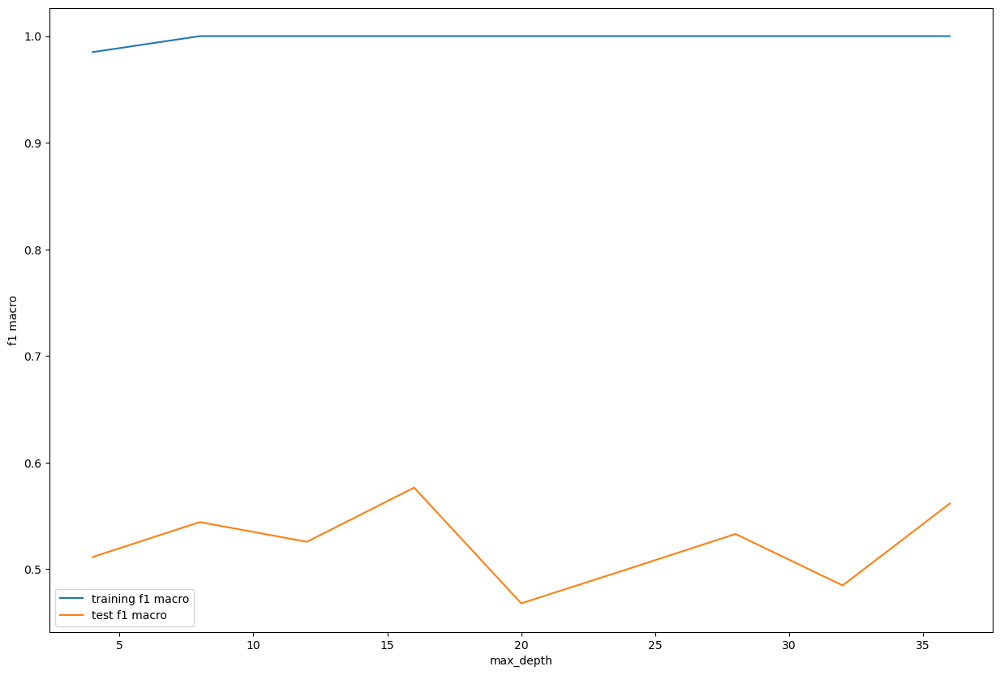

In [25]:
# Import matplotlib.pyplot library first
import matplotlib.pyplot as plt

# Now the plotting code will work
plt.figure(figsize=(15,10))
plt.plot(scores["param_max_depth"], 
         scores["mean_train_score"], 
         label="training f1 macro")
plt.plot(scores["param_max_depth"], 
         scores["mean_test_score"], 
         label="test f1 macro")
plt.xlabel("max_depth")
plt.ylabel("f1 macro")
plt.legend()
plt.show()

In [26]:
my_df= pd.DataFrame()
my_df['mean_train_score']=rf.cv_results_['mean_train_score'] 
my_df['mean_test_score']=rf.cv_results_['mean_test_score'] 
my_df['diff'] = my_df['mean_train_score'] - my_df['mean_test_score']
#my_df.sort_values(by='diff', ascending= False)
my_df

,mean_train_score,mean_test_score,diff
0,0.984988,0.511217,0.473772
1,1.000000,0.543983,0.456017
2,1.000000,0.525480,0.474520
3,1.000000,0.576324,0.423676
4,1.000000,0.467714,0.532286
5,1.000000,0.500072,0.499928
6,1.000000,0.532816,0.467184
7,1.000000,0.484519,0.515481
8,1.000000,0.561359,0.438641


In [27]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_leaf': range(100, 600, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1_macro", return_train_score=True)
rf.fit(df_train_pca,y_res)

,estimator,RandomForestClassifier()
,param_grid,"{'min_samples_leaf': range(100, 600, 50)}"
,scoring,'f1_macro'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,n_estimators,100


In [28]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.177945,0.030406,0.019367,0.019141,100,{'min_samples_leaf': 100},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
1,0.177424,0.012704,0.011177,0.001485,150,{'min_samples_leaf': 150},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
2,0.161326,0.009366,0.009870,0.000412,200,{'min_samples_leaf': 200},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
3,0.191161,0.016156,0.011810,0.002567,250,{'min_samples_leaf': 250},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
4,0.233129,0.034202,0.013081,0.002597,300,{'min_samples_leaf': 300},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344


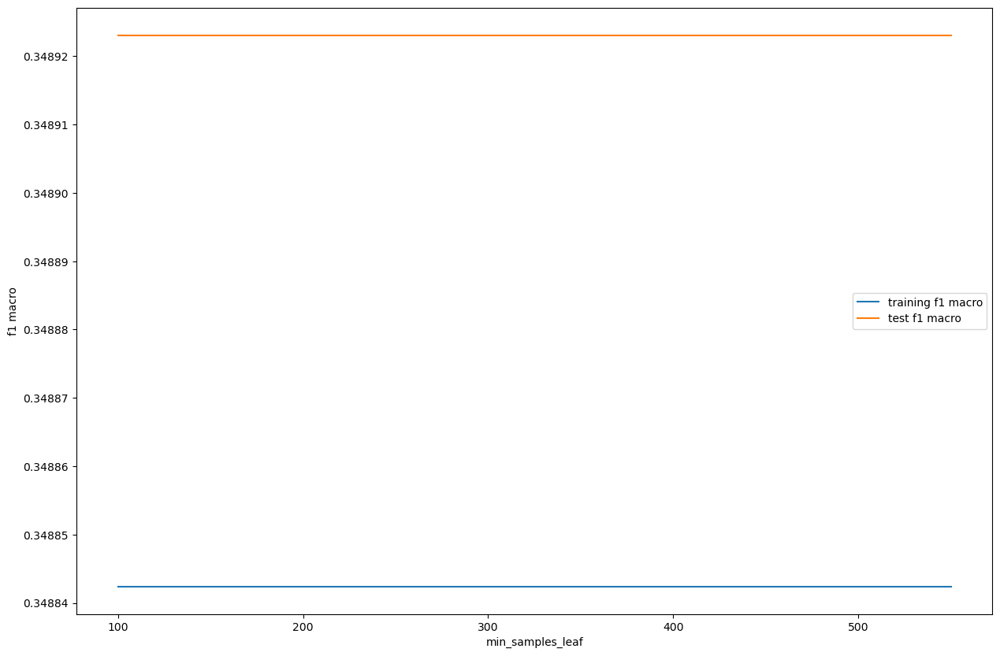

In [29]:
plt.figure(figsize=(15,10))
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_train_score"], 
         label="training f1 macro")
plt.plot(scores["param_min_samples_leaf"], 
         scores["mean_test_score"], 
         label="test f1 macro")
plt.xlabel("min_samples_leaf")
plt.ylabel("f1 macro")
plt.legend()
plt.show()

In [30]:
my_df= pd.DataFrame()
my_df['mean_train_score']=rf.cv_results_['mean_train_score'] 
my_df['mean_test_score']=rf.cv_results_['mean_test_score'] 
my_df['diff'] = my_df['mean_train_score'] - my_df['mean_test_score']
#my_df.sort_values(by='diff', ascending= False)
my_df

,mean_train_score,mean_test_score,diff
0,0.348842,0.348923,-0.000081
1,0.348842,0.348923,-0.000081
2,0.348842,0.348923,-0.000081
3,0.348842,0.348923,-0.000081
4,0.348842,0.348923,-0.000081
5,0.348842,0.348923,-0.000081
6,0.348842,0.348923,-0.000081
7,0.348842,0.348923,-0.000081
8,0.348842,0.348923,-0.000081
9,0.348842,0.348923,-0.000081


In [31]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'n_estimators': range(100, 600, 100)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1_macro", return_train_score=True)
rf.fit(df_train_pca,y_res)


,estimator,RandomForestClassifier()
,param_grid,"{'n_estimators': range(100, 600, 100)}"
,scoring,'f1_macro'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,n_estimators,500


In [32]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.203316,0.046463,0.010588,0.000607,100,{'n_estimators': 100},0.527778,0.527778,0.613636,0.645833,...,0.561418,0.058183,2,1.0,1.0,1.0,1.0,1.0,1.0,0.0
1,0.373412,0.038304,0.019004,0.002572,200,{'n_estimators': 200},0.527778,0.470588,0.484848,0.635714,...,0.517119,0.063135,5,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,0.717168,0.080730,0.026166,0.002002,300,{'n_estimators': 300},0.527778,0.470588,0.463158,0.527778,...,0.521670,0.055839,4,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,0.666763,0.011296,0.029833,0.002284,400,{'n_estimators': 400},0.463158,0.588235,0.613636,0.470588,...,0.550933,0.069459,3,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,0.808678,0.006411,0.035954,0.001825,500,{'n_estimators': 500},0.588235,0.470588,0.582456,0.527778,...,0.571066,0.071648,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0


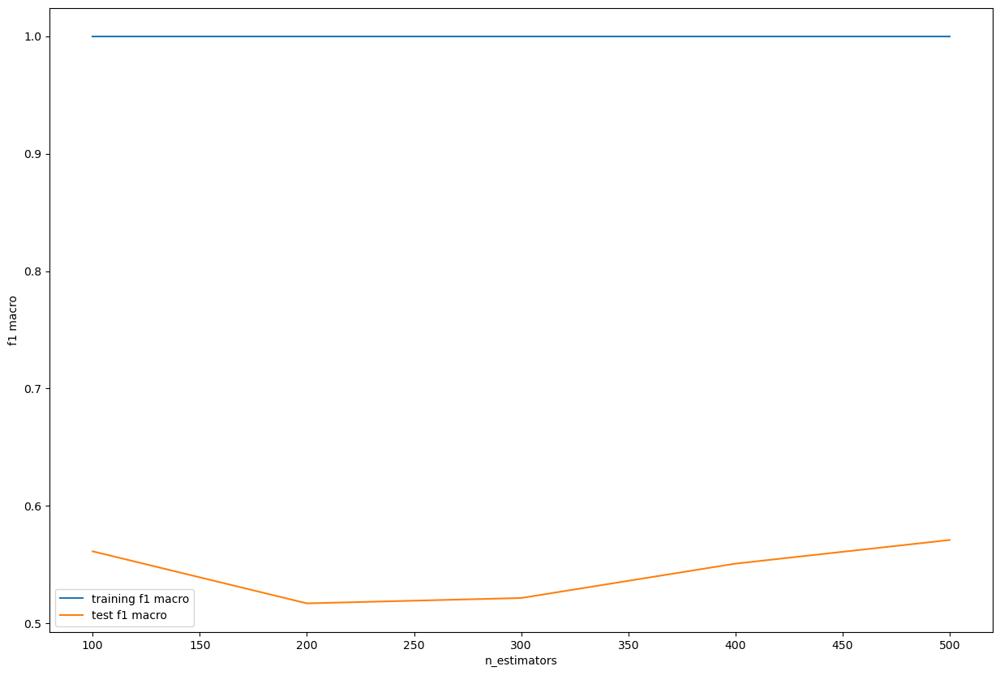

In [33]:
plt.figure(figsize=(15,10))
plt.plot(scores["param_n_estimators"], 
         scores["mean_train_score"], 
         label="training f1 macro")
plt.plot(scores["param_n_estimators"], 
         scores["mean_test_score"], 
         label="test f1 macro")
plt.xlabel("n_estimators")
plt.ylabel("f1 macro")
plt.legend()
plt.show()

In [34]:
my_df= pd.DataFrame()
my_df['mean_train_score']=rf.cv_results_['mean_train_score'] 
my_df['mean_test_score']=rf.cv_results_['mean_test_score'] 
my_df['diff'] = my_df['mean_train_score'] - my_df['mean_test_score']
#my_df.sort_values(by='diff', ascending= False)
my_df

,mean_train_score,mean_test_score,diff
0,1.0,0.561418,0.438582
1,1.0,0.517119,0.482881
2,1.0,0.521670,0.478330
3,1.0,0.550933,0.449067
4,1.0,0.571066,0.428934


In [35]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'min_samples_split': range(0, 800, 50)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1_macro", return_train_score=True)
rf.fit(df_train_pca,y_res)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:516: FitFailedWarning: 
5 fits failed out of a total of 80.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py", line 1358, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py", line 471, in _validate_params
    valida

,estimator,RandomForestClassifier()
,param_grid,"{'min_samples_split': range(0, 800, 50)}"
,scoring,'f1_macro'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,n_estimators,100


In [36]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.000975,0.000114,0.000000,0.000000,0,{'min_samples_split': 0},NaN,NaN,NaN,NaN,...,NaN,NaN,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.195547,0.050365,0.010645,0.000831,50,{'min_samples_split': 50},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
2,0.175050,0.016692,0.010847,0.001493,100,{'min_samples_split': 100},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
3,0.160832,0.007621,0.011295,0.001969,150,{'min_samples_split': 150},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344
4,0.190853,0.026397,0.011433,0.000985,200,{'min_samples_split': 200},0.346154,0.346154,0.346154,0.346154,...,0.348923,0.005538,1,0.349515,0.349515,0.349515,0.349515,0.346154,0.348842,0.001344


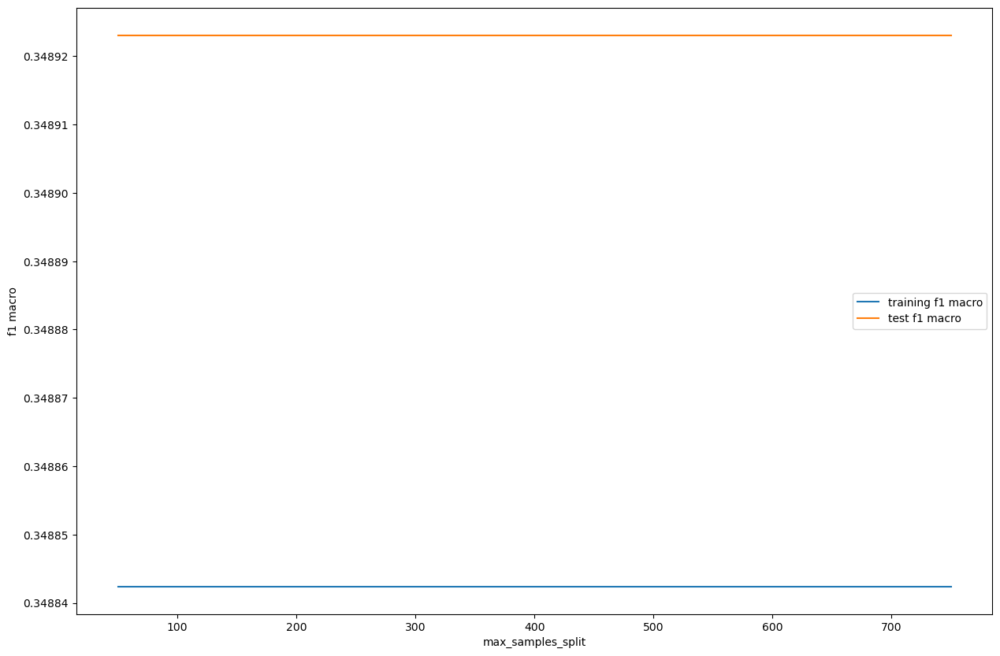

In [37]:
plt.figure(figsize=(15,10))
plt.plot(scores["param_min_samples_split"], 
         scores["mean_train_score"], 
         label="training f1 macro")
plt.plot(scores["param_min_samples_split"], 
         scores["mean_test_score"], 
         label="test f1 macro")
#plt.vlines(x=24, ymax=1, ymin=0.825, colors='magenta', linestyles="--")
#plt.vlines(x=28, ymax=1, ymin=0.825, colors='red', linestyles="--")
plt.xlabel("max_samples_split")
plt.ylabel("f1 macro")
plt.legend()
plt.show()

In [38]:
my_df= pd.DataFrame()
my_df['mean_train_score']=rf.cv_results_['mean_train_score'] 
my_df['mean_test_score']=rf.cv_results_['mean_test_score'] 
my_df['diff'] = my_df['mean_train_score'] - my_df['mean_test_score']
#my_df.sort_values(by='diff', ascending= False)
my_df

,mean_train_score,mean_test_score,diff
0,NaN,NaN,NaN
1,0.348842,0.348923,-0.000081
2,0.348842,0.348923,-0.000081
3,0.348842,0.348923,-0.000081
4,0.348842,0.348923,-0.000081
5,0.348842,0.348923,-0.000081
6,0.348842,0.348923,-0.000081
7,0.348842,0.348923,-0.000081
8,0.348842,0.348923,-0.000081
9,0.348842,0.348923,-0.000081


>0.1 0.517 (0.146)
>0.2 0.502 (0.170)
>0.3 0.491 (0.134)
>0.4 0.512 (0.165)
>0.5 0.493 (0.169)
>0.6 0.512 (0.176)
>0.7 0.533 (0.161)
>0.8 0.514 (0.151)
>0.9 0.473 (0.146)
>1.0 0.517 (0.142)


C:\Users\USER\AppData\Local\Temp\ipykernel_1324\3180322739.py:51: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  pyplot.boxplot(results, labels=names, showmeans=True)


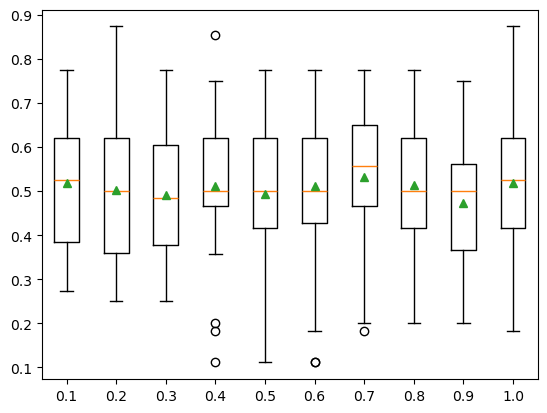

In [39]:
from numpy import mean
from numpy import std
from numpy import arange
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot

##Note: Copy these variables for future models using pca
X_train_pca = df_train_pca
y_train_pca = y_res
X_test_pca = df_test_pca
y_test_pca = y_test


# get a list of models to evaluate
def get_models():
    models = dict()
    # explore ratios from 10% to 100% in 10% increments
    for i in arange(0.1, 1.1, 0.1):
        key = '%.1f' % i
        # set max_samples=None to use 100%
        if i == 1.0:
            i = None
        models[key] = RandomForestClassifier(max_samples=i)
    return models

# evaluate a given model using cross-validation
def evaluate_model(model, X, y):
    # define the evaluation procedure
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    # evaluate the model and collect the results
    scores = cross_val_score(model, X, y, scoring='f1_macro', cv=cv, n_jobs=-1)
    return scores


# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
for name, model in models.items():
    # evaluate the model
    scores = evaluate_model(model, X=df_train_pca, y=y_res)
    # store the results
    results.append(scores)
    names.append(name)
    # summarize the performance along the way
    print('>%s %.3f (%.3f)' % (name, mean(scores), std(scores)))
# plot model performance for comparison
pyplot.boxplot(results, labels=names, showmeans=True)
pyplot.show()


In [40]:
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV


# specify number of folds for k-fold CV
n_folds = 5

# parameters to build the model on
parameters = {'max_leaf_nodes': range(0, 100, 13)}

# instantiate the model
rf = RandomForestClassifier()


# fit tree on training data
rf = GridSearchCV(rf, parameters, 
                    cv=n_folds, 
                   scoring="f1_macro", return_train_score=True)
rf.fit(df_train_pca,y_res)

C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:516: FitFailedWarning: 
5 fits failed out of a total of 40.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
    ~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py", line 1358, in wrapper
    estimator._validate_params()
    ~~~~~~~~~~~~~~~~~~~~~~~~~~^^
  File "C:\Users\USER\anaconda3\Lib\site-packages\sklearn\base.py", line 471, in _validate_params
    valida

,estimator,RandomForestClassifier()
,param_grid,"{'max_leaf_nodes': range(0, 100, 13)}"
,scoring,'f1_macro'
,n_jobs,None
,refit,True
,cv,5
,verbose,0
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,True
,n_estimators,100


In [41]:
scores = rf.cv_results_
pd.DataFrame(scores).head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_leaf_nodes,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.001049,0.000140,0.000000,0.000000,0,{'max_leaf_nodes': 0},NaN,NaN,NaN,NaN,...,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0.247867,0.095302,0.011360,0.002613,13,{'max_leaf_nodes': 13},0.582456,0.470588,0.463158,0.527778,...,0.528796,0.055941,6,1.0,1.0,1.0,1.0,1.0,1.0,0.0
2,0.186195,0.017713,0.011261,0.001723,26,{'max_leaf_nodes': 26},0.470588,0.470588,0.564103,0.645833,...,0.554032,0.073050,3,1.0,1.0,1.0,1.0,1.0,1.0,0.0
3,0.183154,0.015525,0.011558,0.002116,39,{'max_leaf_nodes': 39},0.588235,0.470588,0.514286,0.582456,...,0.568368,0.073459,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
4,0.173778,0.011299,0.010137,0.000874,52,{'max_leaf_nodes': 52},0.527778,0.527778,0.635714,0.463158,...,0.568140,0.080996,2,1.0,1.0,1.0,1.0,1.0,1.0,0.0


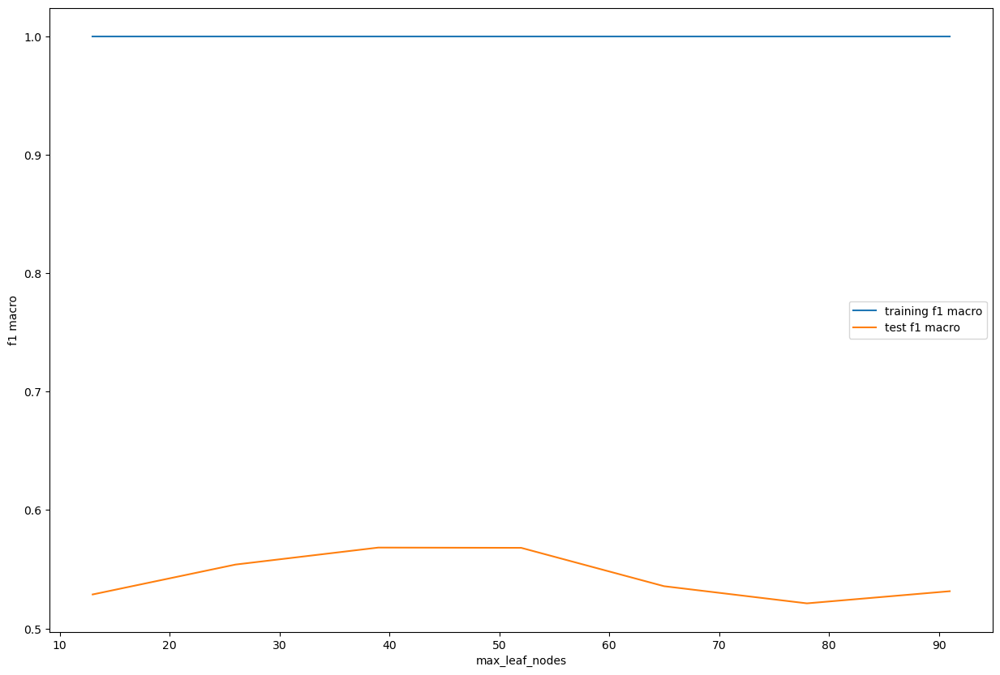

In [42]:
# plotting f1 score with 'max_leaf_nodes'
plt.figure(figsize=(15,10))
plt.plot(scores["param_max_leaf_nodes"], 
         scores["mean_train_score"], 
         label="training f1 macro")
plt.plot(scores["param_max_leaf_nodes"], 
         scores["mean_test_score"], 
         label="test f1 macro")
plt.xlabel("max_leaf_nodes")
plt.ylabel("f1 macro")
plt.legend()
plt.show()

In [43]:
my_df= pd.DataFrame()
my_df['mean_train_score']=rf.cv_results_['mean_train_score'] 
my_df['mean_test_score']=rf.cv_results_['mean_test_score'] 
my_df['diff'] = my_df['mean_train_score'] - my_df['mean_test_score']
#my_df.sort_values(by='diff', ascending= False)
my_df

,mean_train_score,mean_test_score,diff
0,NaN,NaN,NaN
1,1.0,0.528796,0.471204
2,1.0,0.554032,0.445968
3,1.0,0.568368,0.431632
4,1.0,0.568140,0.431860
5,1.0,0.535769,0.464231
6,1.0,0.521289,0.478711
7,1.0,0.531534,0.468466


In [44]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'max_features': [7],  
    'max_depth': [24,25],
    'min_samples_leaf': [100, 200, 300],
    'n_estimators': [300],
    'min_samples_split': [250,350,450],
    'max_leaf_nodes': [25,27]
}

# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, scoring= 'f1_macro',  ##scoring= 'f1_macro'
                          cv = 5, n_jobs = -1,verbose = 1)

In [45]:
grid_search.fit(df_train_pca, y_res)

Fitting 5 folds for each of 36 candidates, totalling 180 fits


,estimator,RandomForestClassifier()
,param_grid,"{'max_depth': [24, 25], 'max_features': [7], 'max_leaf_nodes': [25, 27], 'min_samples_leaf': [100, 200, ...], ...}"
,scoring,'f1_macro'
,n_jobs,-1
,refit,True
,cv,5
,verbose,1
,pre_dispatch,'2*n_jobs'
,error_score,nan
,return_train_score,False
,n_estimators,300


In [46]:
print('We can get f1_macro of',grid_search.best_score_,'using',grid_search.best_params_)

We can get f1_macro of 0.3489230769230769 using {'max_depth': 24, 'max_features': 7, 'max_leaf_nodes': 25, 'min_samples_leaf': 100, 'min_samples_split': 250, 'n_estimators': 300}


In [47]:
rf_final = RandomForestClassifier(bootstrap=True,
                             max_depth=24,
                             max_features=7,
                             max_leaf_nodes=27,
                             min_samples_leaf=100, 
                             min_samples_split=250,
                             n_estimators=300)

In [48]:
rf_final.fit(df_train_pca, y_res)

,n_estimators,300
,criterion,'gini'
,max_depth,24
,min_samples_split,250
,min_samples_leaf,100
,min_weight_fraction_leaf,0.0
,max_features,7
,max_leaf_nodes,27
,min_impurity_decrease,0.0
,bootstrap,True
,oob_score,False


In [49]:
predrf_probs_train = rf_final.predict_proba(df_train_pca)

In [50]:
y_res_predrf = predrf_probs_train[:,1]##Getting churn probability values(1)

In [51]:
y_res_predrf_final = pd.DataFrame({'Churn':y_res.values, 'Churn_Prob':y_res_predrf})
y_res_predrf_final['CustID'] = y_res.index    ##CustID is the record index ID
y_res_predrf_final.head()

,Churn,Churn_Prob,CustID
0,0,0.463016,0
1,1,0.463016,1
2,1,0.463016,2
3,1,0.463016,3
4,1,0.463016,4


In [52]:
y_res_predrf_final['predicted'] = y_res_predrf_final.Churn_Prob.map(lambda x: 1 if x > 0.5 else 0)
y_res_predrf_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.463016,0,0
1,1,0.463016,1,0
2,1,0.463016,2,0
3,1,0.463016,3,0
4,1,0.463016,4,0


In [54]:
# First, define the print_model_metrics function
def print_model_metrics(y_true, y_pred, model_name):
    """
    Function to print classification metrics
    
    Parameters:
    y_true: actual values
    y_pred: predicted values
    model_name: name of the model for display
    """
    print(f"Model: {model_name}")
    print(f"Accuracy: {metrics.accuracy_score(y_true, y_pred):.4f}")
    print(f"Precision: {metrics.precision_score(y_true, y_pred):.4f}")
    print(f"Recall: {metrics.recall_score(y_true, y_pred):.4f}")
    print(f"F1 Score: {metrics.f1_score(y_true, y_pred):.4f}")
    print("Classification Report:")
    print(metrics.classification_report(y_true, y_pred))
    
# Now use the function
confusion = metrics.confusion_matrix(y_res_predrf_final.Churn, y_res_predrf_final.predicted)
print_model_metrics(y_res_predrf_final.Churn, y_res_predrf_final.predicted, 'Random Forest (with PCA)')

Model: Random Forest (with PCA)
Accuracy: 0.5357
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000
Classification Report:
              precision    recall  f1-score   support

           0       0.54      1.00      0.70        45
           1       0.00      0.00      0.00        39

    accuracy                           0.54        84
   macro avg       0.27      0.50      0.35        84
weighted avg       0.29      0.54      0.37        84



C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packag

In [55]:
print(metrics.accuracy_score(y_res_predrf_final.Churn, y_res_predrf_final.predicted))

0.5357142857142857


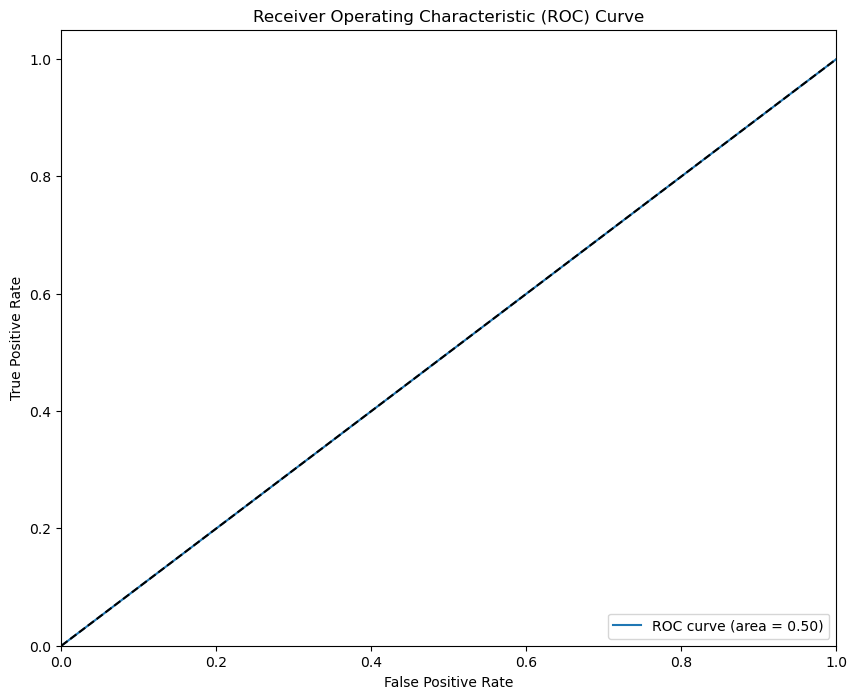

In [57]:
# First, define the draw_roc function
def draw_roc(y_true, y_pred_prob):
    """
    Function to draw ROC curve
    
    Parameters:
    y_true: True labels
    y_pred_prob: Predicted probabilities
    """
    fpr, tpr, thresholds = metrics.roc_curve(y_true, y_pred_prob)
    roc_auc = metrics.auc(fpr, tpr)
    
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')  # diagonal line
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend(loc="lower right")
    plt.show()

# Now use the function
fpr_rf, tp_rf, thresholds_rf = metrics.roc_curve(y_res_predrf_final.Churn, y_res_predrf_final.Churn_Prob, drop_intermediate=False)
# ROC curve for train data
draw_roc(y_res_predrf_final.Churn, y_res_predrf_final.Churn_Prob)

In [58]:
# Let's create columns with different probability cutoffs 
numbers = [float(x)/10 for x in range(10)]
for i in numbers:
    y_res_predrf_final[i]= y_res_predrf_final.Churn_Prob.map(lambda x: 1 if x > i else 0)
y_res_predrf_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9
0,0,0.463016,0,0,1,1,1,1,1,0,0,0,0,0
1,1,0.463016,1,0,1,1,1,1,1,0,0,0,0,0
2,1,0.463016,2,0,1,1,1,1,1,0,0,0,0,0
3,1,0.463016,3,0,1,1,1,1,1,0,0,0,0,0
4,1,0.463016,4,0,1,1,1,1,1,0,0,0,0,0


In [59]:
cutoffrf_df = pd.DataFrame( columns = ['prob','accuracy','sensi','speci'])
from sklearn.metrics import confusion_matrix

# TP = confusion[1,1] # true positive 
# TN = confusion[0,0] # true negatives
# FP = confusion[0,1] # false positives
# FN = confusion[1,0] # false negatives

num = [0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in num:
    cm1 = metrics.confusion_matrix(y_res_predrf_final.Churn, y_res_predrf_final[i] )
    total1=sum(sum(cm1))
    accuracy = (cm1[0,0]+cm1[1,1])/total1
    
    speci = cm1[0,0]/(cm1[0,0]+cm1[0,1])
    sensi = cm1[1,1]/(cm1[1,0]+cm1[1,1])
    cutoffrf_df.loc[i] =[ i ,accuracy,sensi,speci]
print(cutoffrf_df)

     prob  accuracy  sensi  speci
0.0   0.0  0.464286    1.0    0.0
0.1   0.1  0.464286    1.0    0.0
0.2   0.2  0.464286    1.0    0.0
0.3   0.3  0.464286    1.0    0.0
0.4   0.4  0.464286    1.0    0.0
0.5   0.5  0.535714    0.0    1.0
0.6   0.6  0.535714    0.0    1.0
0.7   0.7  0.535714    0.0    1.0
0.8   0.8  0.535714    0.0    1.0
0.9   0.9  0.535714    0.0    1.0


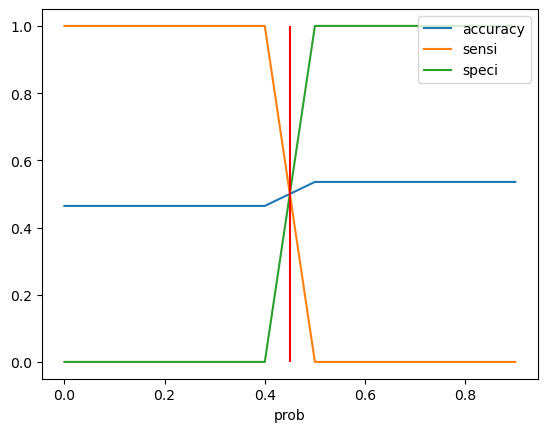

In [60]:
# Let's plot accuracy sensitivity and specificity for various probabilities.
%matplotlib inline
cutoffrf_df.plot.line(x='prob', y=['accuracy','sensi','speci'])
plt.vlines(x=0.45, ymax=1, ymin=0, colors="r", linestyles="-")
plt.show()

In [61]:
y_res_predrf_final['final_predicted'] = y_res_predrf_final.Churn_Prob.map( lambda x: 1 if x > 0.45 else 0)
y_res_predrf_final.head()

,Churn,Churn_Prob,CustID,predicted,0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,final_predicted
0,0,0.463016,0,0,1,1,1,1,1,0,0,0,0,0,1
1,1,0.463016,1,0,1,1,1,1,1,0,0,0,0,0,1
2,1,0.463016,2,0,1,1,1,1,1,0,0,0,0,0,1
3,1,0.463016,3,0,1,1,1,1,1,0,0,0,0,0,1
4,1,0.463016,4,0,1,1,1,1,1,0,0,0,0,0,1


In [62]:
confusion_train_optrf = metrics.confusion_matrix(y_res_predrf_final.Churn, y_res_predrf_final.final_predicted)
print_model_metrics(y_res_predrf_final.Churn, y_res_predrf_final.final_predicted,'Random Forest (with PCA)')

Model: Random Forest (with PCA)
Accuracy: 0.4643
Precision: 0.4643
Recall: 1.0000
F1 Score: 0.6341
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        45
           1       0.46      1.00      0.63        39

    accuracy                           0.46        84
   macro avg       0.23      0.50      0.32        84
weighted avg       0.22      0.46      0.29        84



C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [63]:
printbold('**Evaluation Metrics: Train Set (Optimal Cut-off) ---[using PCA for feature selection]**')
print("******************************************************************")
print('Accuracy of Train Set: (Random Forest Model with PCA):')
print(metrics.accuracy_score(y_res_predrf_final.Churn, y_res_predrf_final.final_predicted))
print("******************************************************************")

from sklearn.metrics import classification_report
print(classification_report(y_res_predrf_final.Churn, y_res_predrf_final.final_predicted, target_names=['Not Churned','Churned']))
print("******************************************************************")

print(other_metrics_logistic_model(confusion_train_optrf))
print("******************************************************************")
print('ROC of Train Set: (Random Forest Model with PCA):')
print("{:2.3}".format(metrics.roc_auc_score(y_res_predrf_final.Churn, y_res_predrf_final.Churn_Prob)))

**Evaluation Metrics: Train Set (Optimal Cut-off) ---[using PCA for feature selection]**
******************************************************************
Accuracy of Train Set: (Random Forest Model with PCA):
0.4642857142857143
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.00      0.00      0.00        45
     Churned       0.46      1.00      0.63        39

    accuracy                           0.46        84
   macro avg       0.23      0.50      0.32        84
weighted avg       0.22      0.46      0.29        84

******************************************************************
        Metric   Value
0  Sensitivity  1.0000
1  Specificity  0.0000
2    Precision  0.4643
3     F1 Score  0.6341
******************************************************************
ROC of Train Set: (Random Forest Model with PCA):
0.5


C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [64]:
pred_probs_testrf = rf_final.predict_proba(df_test_pca)

In [66]:
y_test_predrf = pred_probs_testrf[:,1]   ##Getting churn probability values(1)
y_test_pred = y_test_predrf  # Define y_test_pred using the value from y_test_predrf

# Alternatively, you could just use y_test_predrf directly instead of creating a new variable
# Or if you meant to do something else with y_test_pred, you need to define it properly

In [67]:
y_test_predrf_final = pd.DataFrame({'Churn':y_test.values, 'Churn_Prob':y_test_predrf})
y_test_predrf_final['CustID'] = y_test.index    ##CustID is the record index ID
y_test_predrf_final.head()

,Churn,Churn_Prob,CustID
0,0,0.463016,0
1,0,0.463016,1
2,0,0.463016,2
3,1,0.463016,3
4,1,0.463016,4


In [68]:
y_test_predrf_final['predicted'] = y_test_predrf_final.Churn_Prob.map(lambda x: 1 if x > 0.45 else 0)  ##optimal cut-off is 0.45
y_test_predrf_final.head()

,Churn,Churn_Prob,CustID,predicted
0,0,0.463016,0,1
1,0,0.463016,1,1
2,0,0.463016,2,1
3,1,0.463016,3,1
4,1,0.463016,4,1


In [69]:
confusion_test_optrf = metrics.confusion_matrix(y_test_predrf_final.Churn, y_test_predrf_final.predicted)
print_model_metrics(y_test_predrf_final.Churn, y_test_predrf_final.predicted, 'Random Forest (with PCA)')


Model: Random Forest (with PCA)
Accuracy: 0.5000
Precision: 0.5000
Recall: 1.0000
F1 Score: 0.6667
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        25
           1       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50



C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [70]:
printbold('**Evaluation Metrics: Test Set (Optimal Cut-off)---[using PCA for Feature Selection]**')
print("******************************************************************")
print('Accuracy of Test Set: (Random Forest Model with PCA):')
print(metrics.accuracy_score(y_test_predrf_final.Churn, y_test_predrf_final.predicted))
print("******************************************************************")

from sklearn.metrics import classification_report
print(classification_report(y_test_predrf_final.Churn, y_test_predrf_final.predicted, target_names=['Not Churned','Churned']))  # target_names=target_names
print("******************************************************************")

print(other_metrics_logistic_model(confusion_test_optrf))
print("******************************************************************")
print('ROC of Test Set: (Random Forest Model with PCA):')
print("{:2.3}".format(metrics.roc_auc_score(y_test_predrf_final.Churn, y_test_predrf_final.Churn_Prob)))

**Evaluation Metrics: Test Set (Optimal Cut-off)---[using PCA for Feature Selection]**
******************************************************************
Accuracy of Test Set: (Random Forest Model with PCA):
0.5
******************************************************************
              precision    recall  f1-score   support

 Not Churned       0.00      0.00      0.00        25
     Churned       0.50      1.00      0.67        25

    accuracy                           0.50        50
   macro avg       0.25      0.50      0.33        50
weighted avg       0.25      0.50      0.33        50

******************************************************************
        Metric   Value
0  Sensitivity  1.0000
1  Specificity  0.0000
2    Precision  0.5000
3     F1 Score  0.6667
******************************************************************
ROC of Test Set: (Random Forest Model with PCA):
0.5


C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])
C:\Users\USER\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1731: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", result.shape[0])


In [ ]:
# First, install the xgboost package
!pip install xgboost

# Then import it
import xgboost as xgb

# You may need to restart your kernel after installation
# for the changes to take effect